In [2]:
pip install pytz

Note: you may need to restart the kernel to use updated packages.


In [1]:
from datetime import datetime
from pytz import timezone
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np
from scipy.stats import pearsonr
from sklearn.metrics import r2_score
from sklearn import linear_model
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
import seaborn as sns

import csv
from statistics import mean 
import pandas as pd
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
#from sklearn.ensemble import RandomForestRegresso

In [32]:
df = pd.read_csv("gmt_file1.csv")
#df = pd.read_csv("gmt_device2.csv")
#df = pd.read_csv("gmt_file_pm.csv")
#df = pd.read_csv("epoch_date.csv")

In [33]:
df

,Epoch date,GMT,Battery_percentage,NO2_ppb_megasense
0,1623924154,17-06-2021 10:02,88,2557
1,1623924185,17-06-2021 10:03,88,2567
2,1623924216,17-06-2021 10:03,88,2553
3,1623924247,17-06-2021 10:04,88,2557
4,1623924316,17-06-2021 10:05,87,2603
...,...,...,...,...
1745,1624870602,28-06-2021 08:56,100,2696
1746,1624870798,28-06-2021 08:59,100,2692
1747,1624871129,28-06-2021 09:05,100,2703
1748,1624871554,28-06-2021 09:12,100,2714


In [35]:
df.dtypes

Epoch date             int64
GMT                   object
Battery_percentage     int64
NO2_ppb_megasense      int64
dtype: object

In [88]:
import time
t= []
epoch_time = df['Epoch date']
for i in range(len(df)):
    time_formatted = time.strftime("%d-%m-%Y %H:%M:%S", time.localtime(epoch_time[i]))
    t.append(time_formatted)

In [89]:
epoch_time

0       1623924154
1       1623924185
2       1623924216
3       1623924247
4       1623924316
           ...    
1745    1624870602
1746    1624870798
1747    1624871129
1748    1624871554
1749    1624871847
Name: Epoch date, Length: 1750, dtype: int64

In [90]:
t

['17-06-2021 15:32:34',
 '17-06-2021 15:33:05',
 '17-06-2021 15:33:36',
 '17-06-2021 15:34:07',
 '17-06-2021 15:35:16',
 '17-06-2021 15:36:16',
 '17-06-2021 15:36:47',
 '17-06-2021 15:37:18',
 '17-06-2021 15:37:49',
 '17-06-2021 15:38:20',
 '17-06-2021 15:38:51',
 '17-06-2021 15:39:22',
 '17-06-2021 15:39:53',
 '17-06-2021 15:40:24',
 '17-06-2021 15:41:29',
 '17-06-2021 15:42:00',
 '17-06-2021 15:43:59',
 '17-06-2021 15:49:55',
 '17-06-2021 15:55:34',
 '17-06-2021 16:00:24',
 '17-06-2021 16:01:36',
 '17-06-2021 16:02:07',
 '17-06-2021 16:06:19',
 '17-06-2021 16:19:10',
 '17-06-2021 16:19:43',
 '17-06-2021 16:20:14',
 '17-06-2021 16:20:45',
 '17-06-2021 16:21:16',
 '17-06-2021 16:22:19',
 '17-06-2021 16:22:50',
 '17-06-2021 16:23:21',
 '17-06-2021 16:23:52',
 '17-06-2021 16:24:23',
 '17-06-2021 16:24:54',
 '17-06-2021 16:25:25',
 '17-06-2021 16:25:56',
 '17-06-2021 16:26:27',
 '17-06-2021 16:29:36',
 '17-06-2021 16:30:08',
 '17-06-2021 16:33:31',
 '17-06-2021 16:40:55',
 '17-06-2021 16:

In [91]:
df['Date Time']= t

In [92]:
df

,Epoch date,GMT,Battery_percentage,NO2_ppb_megasense,Date Time
0,1623924154,17-06-2021 10:02,88,2557,17-06-2021 15:32:34
1,1623924185,17-06-2021 10:03,88,2567,17-06-2021 15:33:05
2,1623924216,17-06-2021 10:03,88,2553,17-06-2021 15:33:36
3,1623924247,17-06-2021 10:04,88,2557,17-06-2021 15:34:07
4,1623924316,17-06-2021 10:05,87,2603,17-06-2021 15:35:16
...,...,...,...,...,...
1745,1624870602,28-06-2021 08:56,100,2696,28-06-2021 14:26:42
1746,1624870798,28-06-2021 08:59,100,2692,28-06-2021 14:29:58
1747,1624871129,28-06-2021 09:05,100,2703,28-06-2021 14:35:29
1748,1624871554,28-06-2021 09:12,100,2714,28-06-2021 14:42:34


In [66]:
#df = df.drop(['GMT'], axis = 1)
df.tail(15)

,Epoch date,GMT,Battery_percentage,CO_mega,Date Time
1819,1624904765,28-06-2021 18:26,100,598,28-06-2021 23:56:05
1820,1624904849,28-06-2021 18:27,100,599,28-06-2021 23:57:29
1821,1624905142,28-06-2021 18:32,100,594,29-06-2021 00:02:22
1822,1624905294,28-06-2021 18:34,100,596,29-06-2021 00:04:54
1823,1624905569,28-06-2021 18:39,100,594,29-06-2021 00:09:29
1824,1624906078,28-06-2021 18:47,100,594,29-06-2021 00:17:58
1825,1624906713,28-06-2021 18:58,100,593,29-06-2021 00:28:33
1826,1624906989,28-06-2021 19:03,100,596,29-06-2021 00:33:09
1827,1624907069,28-06-2021 19:04,100,598,29-06-2021 00:34:29
1828,1624907203,28-06-2021 19:06,100,600,29-06-2021 00:36:43


In [67]:
df = df[['Epoch date', 'GMT', 'Date Time', 'PM2.5_mega_ppb', 'PM10_mega_ppb']]

KeyError: "['PM2.5_mega_ppb', 'PM10_mega_ppb'] not in index"

In [93]:
aero = pd.read_csv("C:\\Users\\spand\\Downloads\\Aeroqo(260621)no2.csv")
#aero = pd.read_csv("C:\\Users\\spand\\Downloads\\Aeroqo(010721).csv")
#aero = pd.read_csv("C:\\Users\\spand\\Downloads\\Aeroqo(090721)pm.csv")

In [94]:
aero['Date Time'] = pd.to_datetime(aero['Date Time'], dayfirst = True)

In [95]:
aero

,Date Time,Monitor ID,Location ID,NO2(ppm),NO2_ppb
0,2021-06-22 10:49:00,1,1,0.023,23
1,2021-06-22 10:50:00,1,1,0.013,13
2,2021-06-22 10:51:00,1,1,0.017,17
3,2021-06-22 10:52:00,1,1,0.017,17
4,2021-06-22 10:53:00,1,1,0.018,18
...,...,...,...,...,...
5666,2021-06-26 10:16:00,1,1,0.012,12
5667,2021-06-26 10:17:00,1,1,0.013,13
5668,2021-06-26 10:18:00,1,1,0.013,13
5669,2021-06-26 10:19:00,1,1,0.013,13


In [96]:
aero = aero.drop([' Monitor ID', ' Location ID'], axis = 1)

In [97]:
list(aero)

['Date Time', ' NO2(ppm)', 'NO2_ppb']

In [98]:
df['Date Time'] = pd.to_datetime(df['Date Time'], dayfirst = True)
df.set_index("Date Time", inplace=True)
DF = df.resample("T").mean().round(2)


In [99]:
DF

,Epoch date,Battery_percentage,NO2_ppb_megasense
Date Time,,,
2021-06-17 15:32:00,1.623924e+09,88.0,2557.0
2021-06-17 15:33:00,1.623924e+09,88.0,2560.0
2021-06-17 15:34:00,1.623924e+09,88.0,2557.0
2021-06-17 15:35:00,1.623924e+09,87.0,2603.0
2021-06-17 15:36:00,1.623924e+09,87.0,2606.5
...,...,...,...
2021-06-28 14:43:00,NaN,NaN,NaN
2021-06-28 14:44:00,NaN,NaN,NaN
2021-06-28 14:45:00,NaN,NaN,NaN


In [100]:
DF = DF.dropna()
DF

,Epoch date,Battery_percentage,NO2_ppb_megasense
Date Time,,,
2021-06-17 15:32:00,1.623924e+09,88.0,2557.0
2021-06-17 15:33:00,1.623924e+09,88.0,2560.0
2021-06-17 15:34:00,1.623924e+09,88.0,2557.0
2021-06-17 15:35:00,1.623924e+09,87.0,2603.0
2021-06-17 15:36:00,1.623924e+09,87.0,2606.5
...,...,...,...
2021-06-28 14:26:00,1.624871e+09,100.0,2696.0
2021-06-28 14:29:00,1.624871e+09,100.0,2692.0
2021-06-28 14:35:00,1.624871e+09,100.0,2703.0


In [101]:
A = pd.merge(DF, aero, on = 'Date Time', how = 'inner')

In [105]:
A

,Date Time,Epoch date,Battery_percentage,NO2_ppb_megasense,NO2(ppm),NO2_ppb,NO2_mega_ppm
0,2021-06-22 10:50:00,1.624339e+09,30.0,6553.0,0.013,13,6.5530
1,2021-06-22 10:51:00,1.624339e+09,31.5,4540.5,0.017,17,4.5405
2,2021-06-22 10:53:00,1.624339e+09,36.0,3498.0,0.018,18,3.4980
3,2021-06-22 10:54:00,1.624339e+09,39.0,3265.5,0.020,20,3.2655
4,2021-06-22 10:58:00,1.624340e+09,48.0,2757.0,0.028,28,2.7570
...,...,...,...,...,...,...,...
809,2021-06-26 09:52:00,1.624681e+09,100.0,2689.0,0.012,12,2.6890
810,2021-06-26 10:02:00,1.624682e+09,100.0,2689.0,0.013,13,2.6890
811,2021-06-26 10:11:00,1.624682e+09,100.0,2692.0,0.012,12,2.6920
812,2021-06-26 10:16:00,1.624683e+09,100.0,2689.0,0.012,12,2.6890


In [103]:
A = A.dropna()

In [104]:
A["NO2_mega_ppm"] = A["NO2_ppb_megasense"]/1000

In [79]:
A['CO_ppb_aero'] = A[" CO_ppm"]*1000
A

,Date Time,Epoch date,Battery_percentage,CO_mega,CO_ppm,CO_ppb_aero
0,2021-06-26 19:42:00,1.624717e+09,63.0,547.0,1.19,1190.0
1,2021-06-26 19:45:00,1.624717e+09,62.0,548.0,1.06,1060.0
2,2021-06-26 19:52:00,1.624717e+09,62.0,541.0,0.83,830.0
3,2021-06-26 20:11:00,1.624718e+09,61.0,544.0,0.46,460.0
4,2021-06-26 20:18:00,1.624719e+09,60.0,660.0,0.90,900.0
...,...,...,...,...,...,...
208,2021-06-29 00:43:00,1.624908e+09,100.0,602.0,0.00,0.0
209,2021-06-29 00:52:00,1.624908e+09,100.0,601.0,0.00,0.0
210,2021-06-29 01:02:00,1.624909e+09,100.0,601.0,0.00,0.0
211,2021-06-29 01:04:00,1.624909e+09,100.0,600.0,0.00,0.0


In [80]:
A['CO_mega_ppm'] = A["CO_mega"]/1000

In [28]:
import matplotlib.pyplot as plt

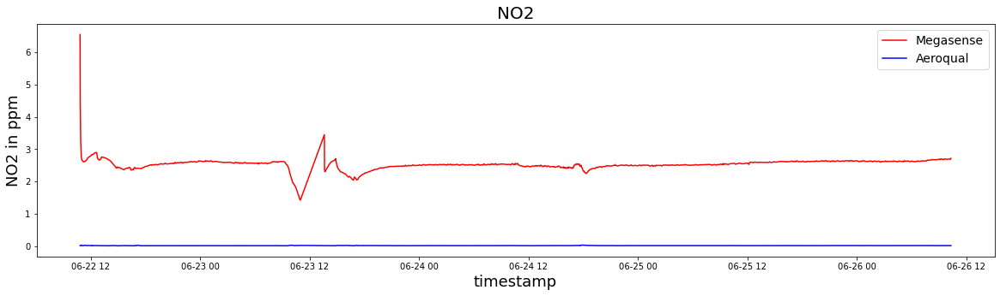

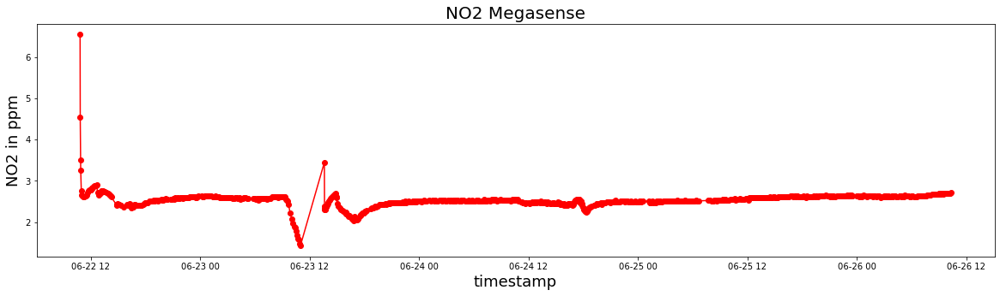

Text(0.5, 1.0, 'NO2 Aeroqual')

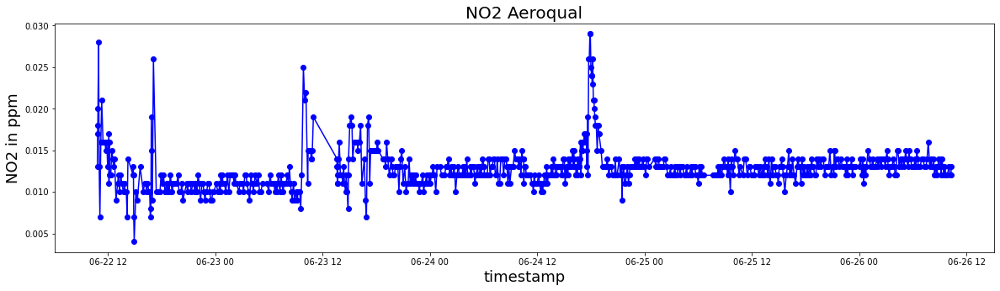

In [109]:
x = A['Date Time']
y1 = A['NO2_mega_ppm']
y2 = A[' NO2(ppm)']
fig= plt.figure(figsize=(20,5))
plt.plot(x, y1, '-r') 
plt.plot(x, y2, 'b')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('NO2 in ppm', fontsize=18)
plt.legend(["Megasense", "Aeroqual"], fontsize=14)
plt.title('NO2', fontsize=20)
plt.show()
fig= plt.figure(figsize=(20,5))
# plotting points as a scatter plot
plt.plot(x, y1, '-or')
plt.xlabel('timestamp', fontsize=18)
plt.ylabel('NO2 in ppm', fontsize=18)
#plt.legend(["Megasense", "Aeroqual"])
plt.title('NO2 Megasense', fontsize=20)
plt.show()

fig= plt.figure(figsize=(20,5))
plt.plot(x, y2, '-ob')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('NO2 in ppm', fontsize=18)
#plt.legend(["Aeroqual"])
plt.title('NO2 Aeroqual', fontsize=20)

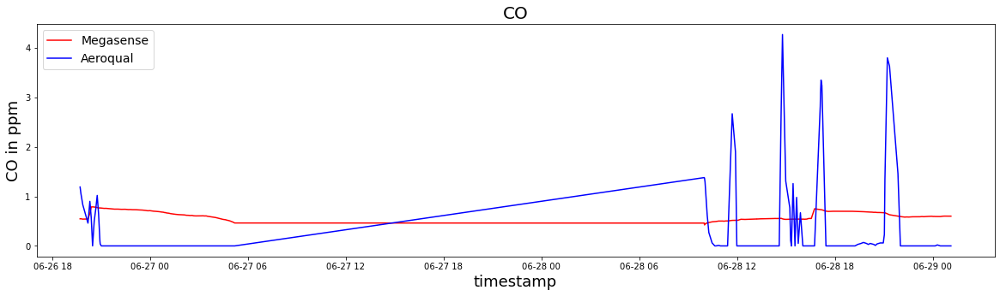

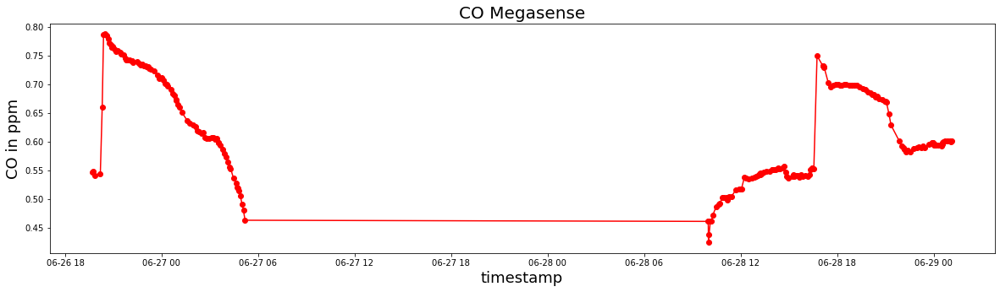

Text(0.5, 1.0, 'CO Aeroqual')

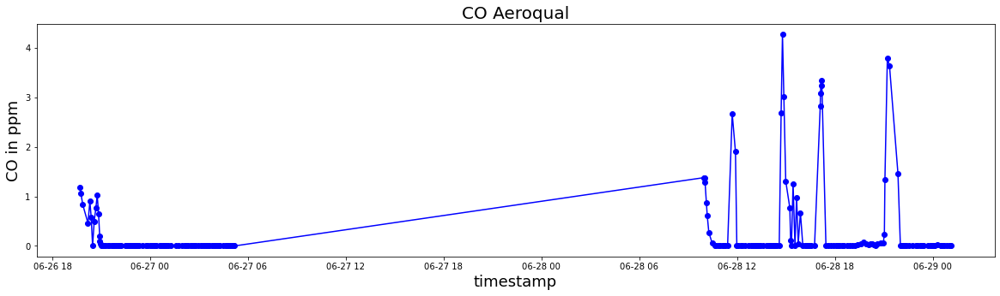

In [84]:
x = A['Date Time']
y1 = A['CO_mega_ppm']
y2 = A[' CO_ppm']
fig= plt.figure(figsize=(20,5))
plt.plot(x, y1, '-r') 
plt.plot(x, y2, 'b')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
plt.legend(["Megasense", "Aeroqual"], fontsize=14)
plt.title('CO', fontsize=20)
plt.show()
fig= plt.figure(figsize=(20,5))
# plotting points as a scatter plot
plt.plot(x, y1, '-or')
plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
#plt.legend(["Megasense", "Aeroqual"])
plt.title('CO Megasense', fontsize=20)
plt.show()

fig= plt.figure(figsize=(20,5))
plt.plot(x, y2, '-ob')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
#plt.legend(["Aeroqual"])
plt.title('CO Aeroqual', fontsize=20)

max correlation is at lag 477
max correlation is  0.286
Pearsons correlation: -0.122
MSE NO2:  6398299.147811917
MAE NO2:  2519.936326781327
RMSE NO2:  2529.48594536754


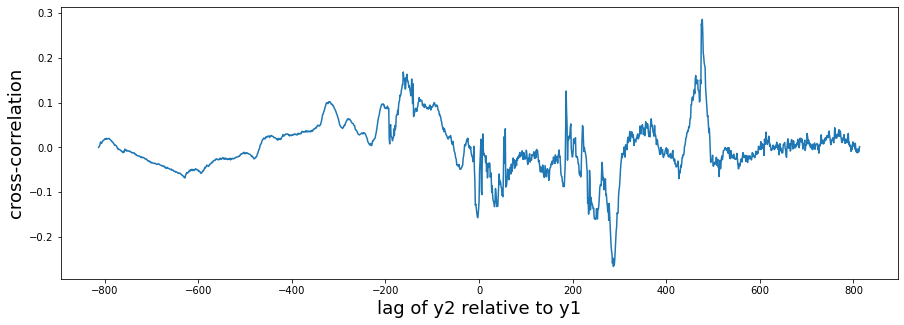

In [159]:
import numpy as np
from scipy.stats import pearsonr
from sklearn.metrics import r2_score
from sklearn import linear_model
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
npts = len(A)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation',fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize = 18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(A['NO2_ppb_megasense'], A['NO2_ppb'])
MAE = mean_absolute_error(A['NO2_ppb_megasense'],A['NO2_ppb'])
print("MSE NO2: ", MSE)
print("MAE NO2: ", MAE)
print("RMSE NO2: ", np.sqrt(mean_squared_error(A['NO2_ppb_megasense'], A['NO2_ppb'])))

In [106]:
A.head(5)

,Date Time,NO2_ppb_megasense,NO2(ppm),NO2_ppb
1,2021-06-22 10:50:00,6553.0,0.013,13
2,2021-06-22 10:51:00,4540.5,0.017,17
4,2021-06-22 10:53:00,3498.0,0.018,18
5,2021-06-22 10:54:00,3265.5,0.020,20
9,2021-06-22 10:58:00,2757.0,0.028,28


In [111]:
A.to_csv("NO2_mega&aero.csv")

max correlation is at lag 125
max correlation is  0.223
Pearsons correlation: -0.041
MSE CO:  696530.4929577465
MAE CO:  693.6291079812206
RMSE CO:  834.5840239051706


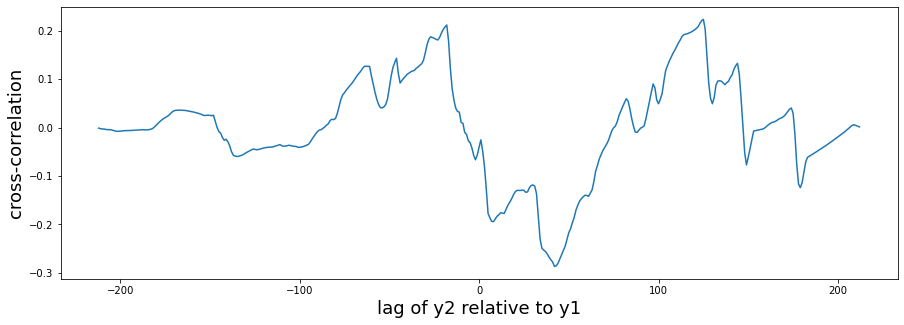

In [137]:
import numpy as np
from scipy.stats import pearsonr
from sklearn.metrics import r2_score
from sklearn import linear_model
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
npts = len(A)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(A['CO_mega'], A['CO_ppb_aero'])
MAE = mean_absolute_error(A['CO_mega'],A['CO_ppb_aero'])
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(A['CO_mega'], A['CO_ppb_aero'])))

In [85]:
A.to_csv("CO_mega&aero.csv")

In [131]:
B = A[A['Battery_percentage']>50]

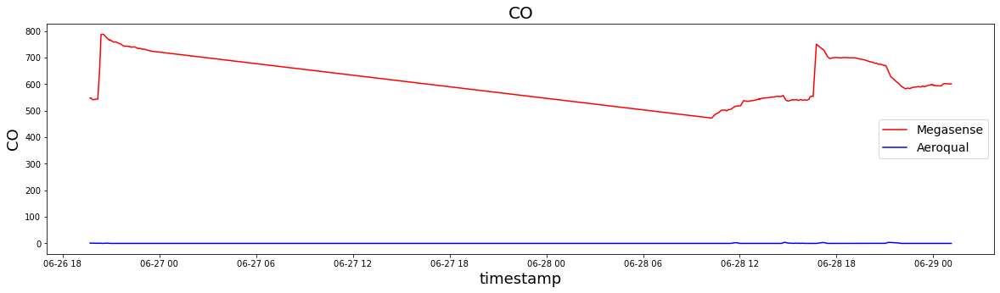

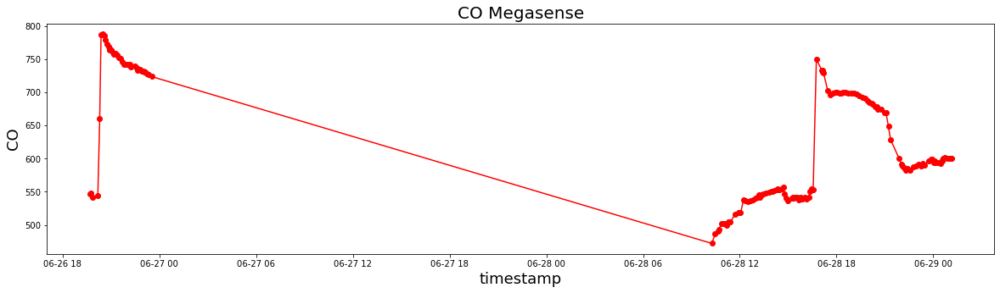

Text(0.5, 1.0, 'CO Aeroqual')

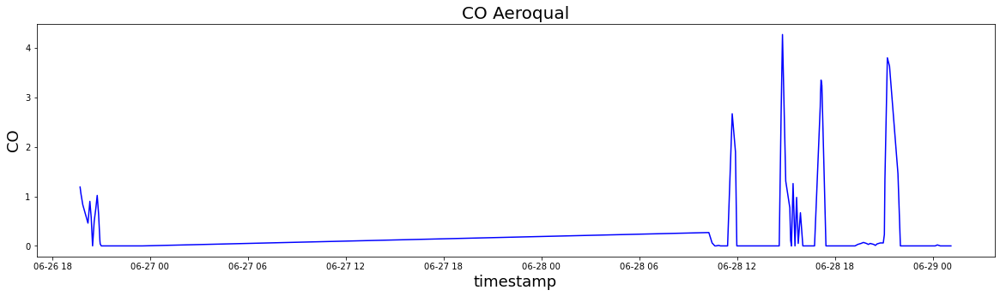

In [132]:
x = B['Date Time']
y1 = B['CO_mega']
y2 = B[' CO_ppm']
fig= plt.figure(figsize=(20,5))
plt.plot(x, y1, '-r') 
plt.plot(x, y2, 'b')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO', fontsize=18)
plt.legend(["Megasense", "Aeroqual"], fontsize=14)
plt.title('CO', fontsize=20)
plt.show()
fig= plt.figure(figsize=(20,5))
# plotting points as a scatter plot
plt.plot(x, y1, '-or')
plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO', fontsize=18)
#plt.legend(["Megasense", "Aeroqual"])
plt.title('CO Megasense', fontsize=20)
plt.show()

fig= plt.figure(figsize=(20,5))
plt.plot(x, y2, 'b')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO', fontsize=18)
#plt.legend(["Aeroqual"])
plt.title('CO Aeroqual', fontsize=20)

max correlation is at lag -18
max correlation is  0.26
Pearsons correlation: -0.001
MSE CO:  797303.8484375
MAE CO:  719.528125
RMSE CO:  892.9187244298889


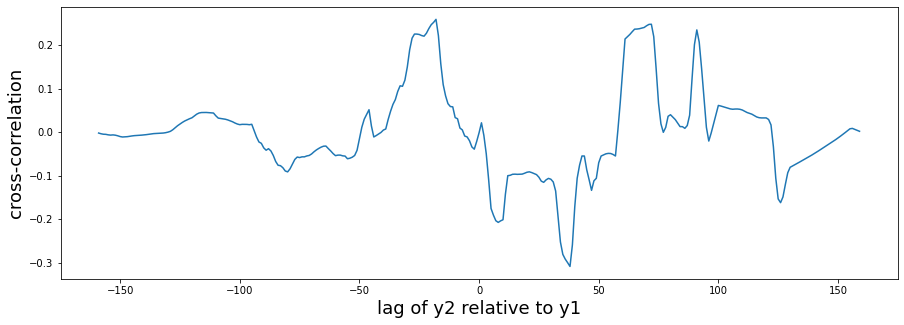

In [134]:
npts = len(B)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize = 18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(B['CO_mega'], B['CO_ppb_aero'])
MAE = mean_absolute_error(B['CO_mega'],B['CO_ppb_aero'])
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(B['CO_mega'], B['CO_ppb_aero'])))

In [160]:
B = A[A['Battery_percentage']>50]

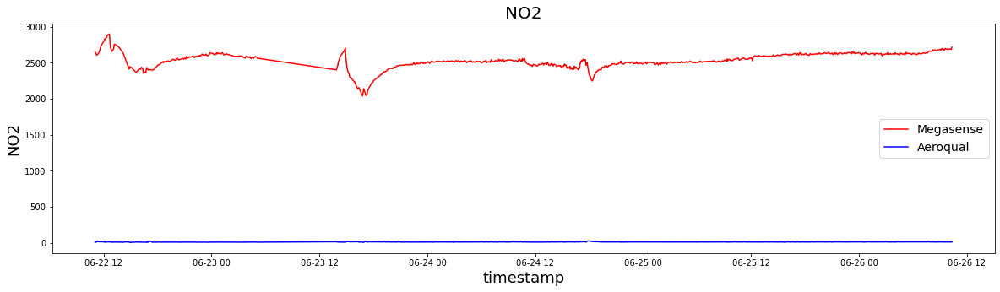

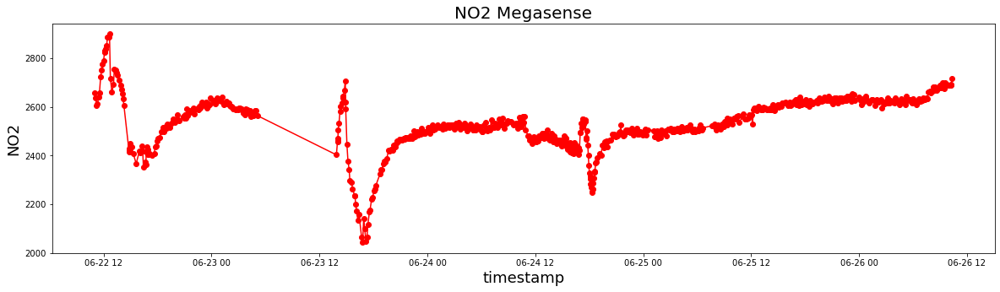

Text(0.5, 1.0, 'NO2 Aeroqual')

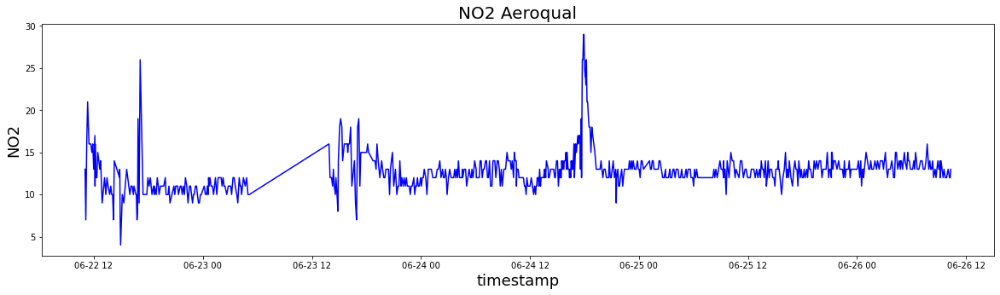

In [161]:
x = B['Date Time']
y1 = B['NO2_ppb_megasense']
y2 = B['NO2_ppb']
fig= plt.figure(figsize=(20,5))
plt.plot(x, y1, '-r') 
plt.plot(x, y2, 'b')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('NO2', fontsize=18)
plt.legend(["Megasense", "Aeroqual"], fontsize=14)
plt.title('NO2', fontsize=20)
plt.show()
fig= plt.figure(figsize=(20,5))
# plotting points as a scatter plot
plt.plot(x, y1, '-or')
plt.xlabel('timestamp', fontsize=18)
plt.ylabel('NO2', fontsize=18)
#plt.legend(["Megasense", "Aeroqual"])
plt.title('NO2 Megasense', fontsize=20)
plt.show()

fig= plt.figure(figsize=(20,5))
plt.plot(x, y2, 'b')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('NO2', fontsize=18)
#plt.legend(["Aeroqual"])
plt.title('NO2 Aeroqual', fontsize=20)

max correlation is at lag 406
max correlation is  0.259
Pearsons correlation: -0.241
MSE NO2:  6398299.147811917
MAE NO2:  2519.936326781327
RMSE NO2:  2529.48594536754


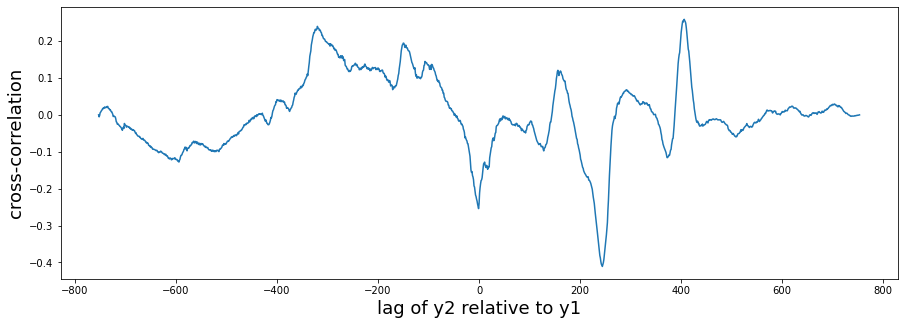

In [162]:
npts = len(B)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation',fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize = 18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(A['NO2_ppb_megasense'], A['NO2_ppb'])
MAE = mean_absolute_error(A['NO2_ppb_megasense'],A['NO2_ppb'])
print("MSE NO2: ", MSE)
print("MAE NO2: ", MAE)
print("RMSE NO2: ", np.sqrt(mean_squared_error(A['NO2_ppb_megasense'], A['NO2_ppb'])))

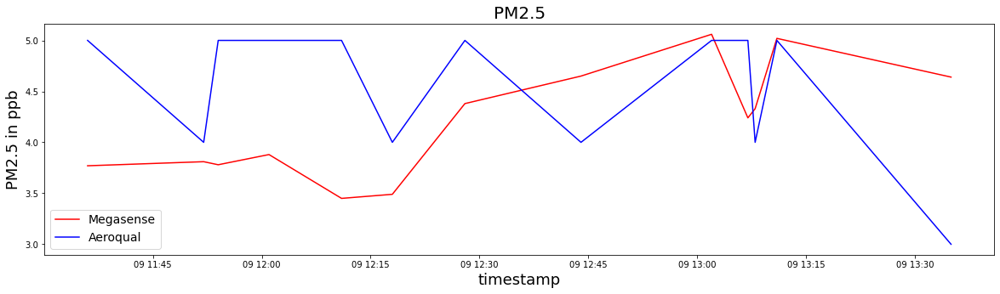

In [37]:
x = A['Date Time']
y1 = A['PM2.5_mega_ppb']
y2 = A['PM2.5_ppb']
fig= plt.figure(figsize=(20,5))
plt.plot(x, y1, '-r') 
plt.plot(x, y2, 'b')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('PM2.5 in ppb', fontsize=18)
plt.legend(["Megasense", "Aeroqual"], fontsize=14)
plt.title('PM2.5', fontsize=20)
plt.show()

max correlation is at lag -8
max correlation is  0.22
Pearsons correlation: -0.094
MSE PM2.5:  0.8570307692307692
MAE PM2.5:  0.7615384615384614
RMSE PM2.5:  0.925759563402274


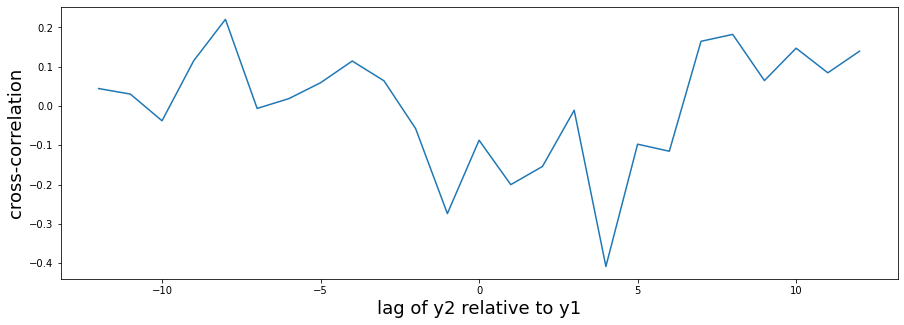

In [32]:
import numpy as np
from scipy.stats import pearsonr
from sklearn.metrics import r2_score
from sklearn import linear_model
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
npts = len(A)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation',fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize = 18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(A['PM2.5_mega_ppb'], A['PM2.5_ppb'])
MAE = mean_absolute_error(A['PM2.5_mega_ppb'], A['PM2.5_ppb'])
print("MSE PM2.5: ", MSE)
print("MAE PM2.5: ", MAE)
print("RMSE PM2.5: ", np.sqrt(mean_squared_error(A['PM2.5_mega_ppb'], A['PM2.5_ppb'])))

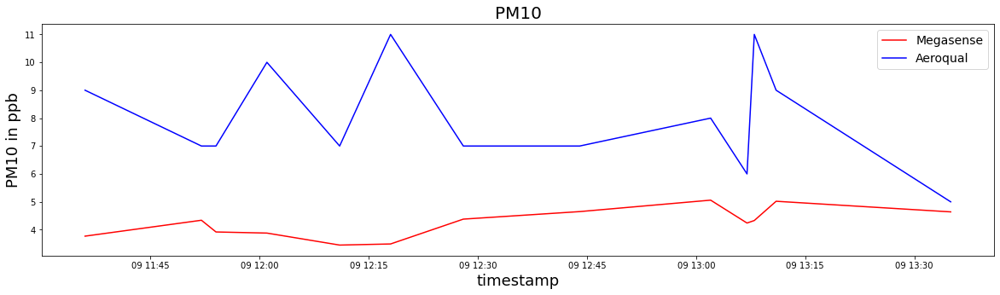

In [36]:
x = A['Date Time']
y1 = A['PM10_mega_ppb']
y2 = A['PM10_ppb']
fig= plt.figure(figsize=(20,5))
plt.plot(x, y1, '-r') 
plt.plot(x, y2, 'b')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('PM10 in ppb', fontsize=18)
plt.legend(["Megasense", "Aeroqual"], fontsize=14)
plt.title('PM10', fontsize=20)
plt.show()

max correlation is at lag 2
max correlation is  0.222
Pearsons correlation: -0.266
MSE PM10:  18.07376153846154
MAE PM10:  3.756153846153846
RMSE PM10:  4.251324680433328


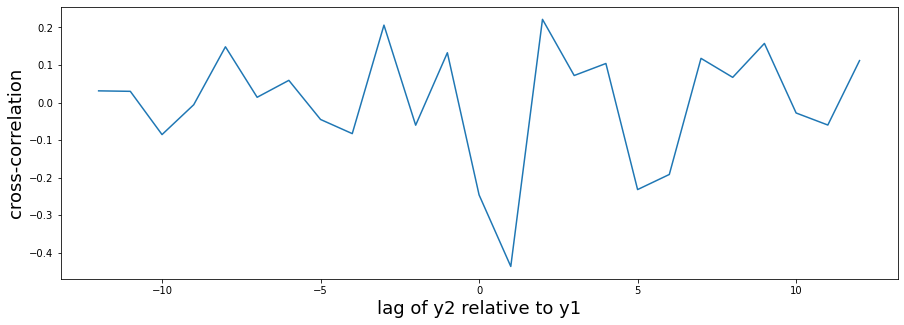

In [34]:
npts = len(A)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation',fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize = 18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(A['PM10_mega_ppb'], A['PM10_ppb'])
MAE = mean_absolute_error(A['PM10_mega_ppb'], A['PM10_ppb'])
print("MSE PM10: ", MSE)
print("MAE PM10: ", MAE)
print("RMSE PM10: ", np.sqrt(mean_squared_error(A['PM10_mega_ppb'], A['PM10_ppb'])))

In [35]:
A.to_csv("PM_mega&aero.csv")

In [110]:
A

,Date Time,Epoch date,Battery_percentage,NO2_ppb_megasense,NO2(ppm),NO2_ppb,NO2_mega_ppm
0,2021-06-22 10:50:00,1.624339e+09,30.0,6553.0,0.013,13,6.5530
1,2021-06-22 10:51:00,1.624339e+09,31.5,4540.5,0.017,17,4.5405
2,2021-06-22 10:53:00,1.624339e+09,36.0,3498.0,0.018,18,3.4980
3,2021-06-22 10:54:00,1.624339e+09,39.0,3265.5,0.020,20,3.2655
4,2021-06-22 10:58:00,1.624340e+09,48.0,2757.0,0.028,28,2.7570
...,...,...,...,...,...,...,...
809,2021-06-26 09:52:00,1.624681e+09,100.0,2689.0,0.012,12,2.6890
810,2021-06-26 10:02:00,1.624682e+09,100.0,2689.0,0.013,13,2.6890
811,2021-06-26 10:11:00,1.624682e+09,100.0,2692.0,0.012,12,2.6920
812,2021-06-26 10:16:00,1.624683e+09,100.0,2689.0,0.012,12,2.6890


In [1]:
import csv
from statistics import mean 
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr
from sklearn.metrics import r2_score
from sklearn import linear_model
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
from sklearn.ensemble import RandomForestRegressor

In [2]:
N = pd.read_csv("NO2_mega&aero.csv")
C = pd.read_csv("CO_mega&aero.csv")
P = pd.read_csv("PM_mega&aero.csv")
print(list(N))
print(list(C))
print(list(P))

['Unnamed: 0', 'Date Time', 'Epoch date', 'Battery_percentage', 'NO2_ppb_megasense', ' NO2(ppm)', 'NO2_ppb', 'NO2_mega_ppm']
['Unnamed: 0', 'Date Time', 'Epoch date', 'Battery_percentage', 'CO_mega', ' CO_ppm', 'CO_ppb_aero', 'CO_mega_ppm']
['Unnamed: 0', 'Date Time', 'Epoch date', 'PM2.5_mega_ppb', 'PM10_mega_ppb', ' PM10_ppm', ' PM2.5_ppm', 'PM10_ppb', 'PM2.5_ppb']


In [3]:
n = N[N['Battery_percentage']>50]
c = C[C['Battery_percentage']>50]

Coefficients:  [[-0.00069803]]
Intercept:  [0.01452436]
R2:  0.013769517988744484
R2 training:  -0.009253451940270052
MAE:  0.001778036114919241
MAE training:  2.527913082437276
MSE:  8.239680587280775e-06
MSE training:  6.449482826612903
RMSE:  0.00287048438199562
RMSE training:  2.5395831993878253
variance score:  0.01876093407021573
variance score training:  -0.0014888206155450057
Test data Spearman correlation: 0.0754
Train data Spearman correlation: -0.101


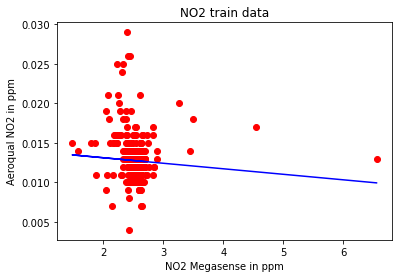

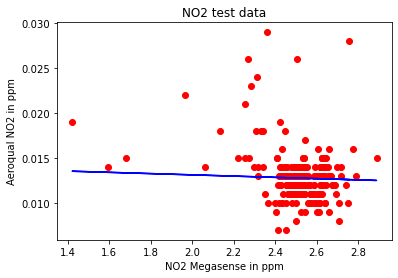

Random Forest MAE: 0.0017803311558659354
Random Forest MSE: 8.228816496862444e-06
Random Forest RMSE: 0.0028685913785100946
Random Forest R-2 score: 0.0151
Random Forest Spearman correlation: 0.223


<ipython-input-5-c7a99e718078>:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  regressor.fit(train_x, train_y)


In [5]:
msk = (np.random.rand(len(N)) < 0.7)
train = N[msk]
test = N[~msk]
regr = linear_model.LinearRegression()

train_x = np.asanyarray(train[['NO2_mega_ppm']])
train_y = np.asanyarray(train[[' NO2(ppm)']])
regr.fit (train_x, train_y)
# The coefficients
print ('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)

test_x = np.asanyarray(test[['NO2_mega_ppm']])
test_y = np.asanyarray(test[[' NO2(ppm)']])

# predicting values
test_y_hat = regr.predict(test_x)

ssr = np.sum((test_y_hat - test_y)**2)
ssr
ssr1 = np.sum((train_y - train_x)**2)
#  total sum of squares
sst = np.sum((test_y - np.mean(test_y))**2)
sst
sst1 = np.sum((train_y - np.mean(train_x))**2)

# R2 score
r2 = 1 - (ssr/sst)
r2_training = 1 -(ssr1/sst1)
print("R2: ", r2)
print("R2 training: ", r2_training)

# MAE
print("MAE: ", metrics.mean_absolute_error(test_y,test_y_hat))
print("MAE training: ", metrics.mean_absolute_error(train_x, train_y))

#MSE
print("MSE: ", mean_squared_error(test_y, test_y_hat))
print("MSE training: ", mean_squared_error(train_x, train_y))
#RMSE
print("RMSE: ", np.sqrt(mean_squared_error(test_y, test_y_hat)))
print("RMSE training: ", np.sqrt(mean_squared_error(train_x, train_y)))
#Variance
print("variance score: ", metrics.explained_variance_score(test_y, test_y_hat)) 
print("variance score training: ", metrics.explained_variance_score(train_x, train_y)) 

spearman = spearmanr(test_y, test_y_hat)
spearman1 = spearmanr(train_x, train_y)
print(f'Test data Spearman correlation: {spearman[0]:.3}')
print(f'Train data Spearman correlation: {spearman1[0]:.3}')
#pearson = pearsonr(test_y, test_y_hat)
#print(f'Test data Pearson correlation: {pearson[0]:.3}')

plt.scatter(train_x,train_y ,color = 'red')
plt.plot(train_x, regr.predict(train_x), color = 'blue')
plt.xlabel('NO2 Megasense in ppm')
plt.ylabel('Aeroqual NO2 in ppm')
plt.title("NO2 train data")
plt.show()

plt.scatter(test_x,test_y ,color = 'red')
plt.plot(test_x, regr.predict(test_x), color = 'blue')
plt.xlabel('NO2 Megasense in ppm')
plt.ylabel('Aeroqual NO2 in ppm')
plt.title("NO2 test data")
plt.show()

from sklearn.metrics import r2_score
regressor = RandomForestRegressor(n_estimators = 10, random_state = 0) 
  
# fit the regressor with x and y data 
regressor.fit(train_x, train_y) 
y_pred = regressor.predict(test_x)

print('Random Forest MAE:', metrics.mean_absolute_error(test_y, y_pred))
print('Random Forest MSE:', metrics.mean_squared_error(test_y, y_pred))
print('Random Forest RMSE:', np.sqrt(metrics.mean_squared_error(test_y, y_pred)))


test_score = r2_score(test_y, y_pred)
spearman = spearmanr(test_y, y_pred)
#pearson = pearsonr(test_y, predicted_test)

#print(f'Out-of-bag R-2 score estimate: {regressor.oob_score_:>5.3}')
print(f'Random Forest R-2 score: {test_score:>5.3}')
print(f'Random Forest Spearman correlation: {spearman[0]:.3}')
#print(f'Random Forest Pearson correlation: {pearson[0]:.3}')


Polynomial linear regression MAE: 0.001754227056803925
Polynomial linear regression MSE: 7.901385932153173e-06
Polynomial linear regression RMSE: 0.002810940399964605
Polynomial linear regression R-2 score: 0.0543
Polynomial linear regression Spearman correlation: 0.0754


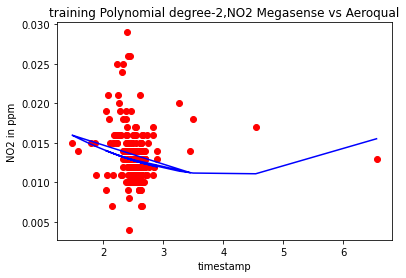

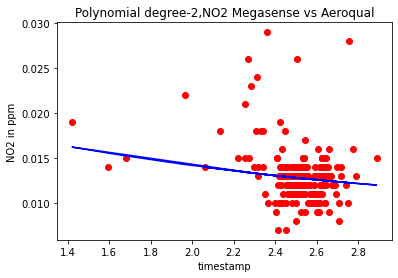

In [9]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=2)
X_poly = poly_reg.fit_transform(train_x)
pol_reg = LinearRegression()
pol_reg.fit(X_poly, train_y)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(test_x))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(test_y, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(test_y, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(test_y, pred_y)))



test_score = r2_score(test_y, pred_y)
spearman = spearmanr(test_y, pred_y)
#pearson = pearsonr(test_y, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
#print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

plt.scatter(train_x, train_y, color='red')
plt.plot(train_x, pol_reg.predict(poly_reg.fit_transform(train_x)), color='blue')
plt.title('training Polynomial degree-2,NO2 Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('NO2 in ppm')
plt.show()
plt.scatter(test_x, test_y, color='red')
plt.plot(test_x, pol_reg.predict(poly_reg.fit_transform(test_x)), color='blue')
plt.title('Polynomial degree-2,NO2 Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('NO2 in ppm')
plt.show()

Polynomial linear regression MAE: 0.0017541620329707976
Polynomial linear regression MSE: 7.844033355030482e-06
Polynomial linear regression RMSE: 0.0028007201493598895
Polynomial linear regression R-2 score: 0.0611
Polynomial linear regression Spearman correlation: 0.0755


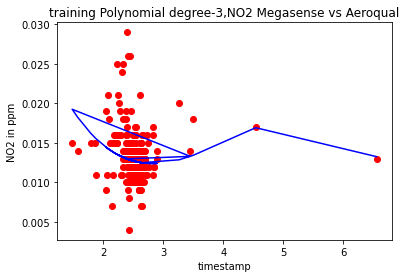

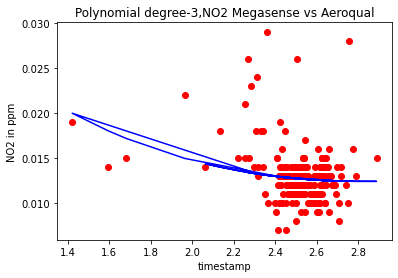

In [12]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=3)
X_poly = poly_reg.fit_transform(train_x)
pol_reg = LinearRegression()
pol_reg.fit(X_poly, train_y)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(test_x))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(test_y, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(test_y, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(test_y, pred_y)))



test_score = r2_score(test_y, pred_y)
spearman = spearmanr(test_y, pred_y)
#pearson = pearsonr(test_y, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
#print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

plt.scatter(train_x, train_y, color='red')
plt.plot(train_x, pol_reg.predict(poly_reg.fit_transform(train_x)), color='blue')
plt.title('training Polynomial degree-3,NO2 Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('NO2 in ppm')
plt.show()
plt.scatter(test_x, test_y, color='red')
plt.plot(test_x, pol_reg.predict(poly_reg.fit_transform(test_x)), color='blue')
plt.title('Polynomial degree-3,NO2 Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('NO2 in ppm')
plt.show()

Polynomial linear regression MAE: 0.001751869460358689
Polynomial linear regression MSE: 7.669855198379209e-06
Polynomial linear regression RMSE: 0.002769450342284405
Polynomial linear regression R-2 score: 0.082
Polynomial linear regression Spearman correlation: 0.0651


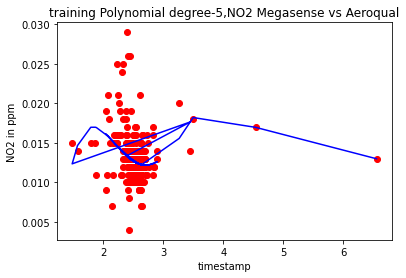

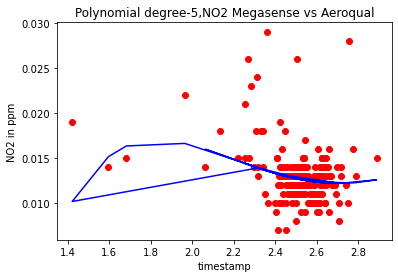

In [11]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=5)
X_poly = poly_reg.fit_transform(train_x)
pol_reg = LinearRegression()
pol_reg.fit(X_poly, train_y)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(test_x))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(test_y, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(test_y, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(test_y, pred_y)))



test_score = r2_score(test_y, pred_y)
spearman = spearmanr(test_y, pred_y)
#pearson = pearsonr(test_y, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
#print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

plt.scatter(train_x, train_y, color='red')
plt.plot(train_x, pol_reg.predict(poly_reg.fit_transform(train_x)), color='blue')
plt.title('training Polynomial degree-5,NO2 Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('NO2 in ppm')
plt.show()
plt.scatter(test_x, test_y, color='red')
plt.plot(test_x, pol_reg.predict(poly_reg.fit_transform(test_x)), color='blue')
plt.title('Polynomial degree-5,NO2 Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('NO2 in ppm')
plt.show()

Coefficients:  [[-0.78886331]]
Intercept:  [0.75475557]
R2:  -0.02735514426228769
R2 training:  -0.027186688621886113
MAE:  0.43764060170427815
MAE training:  0.71012
MSE:  0.4970534180048758
MSE training:  0.7372367633333332
RMSE:  0.7050201543253042
RMSE training:  0.8586249258746995
variance score:  -0.02718874094952839
variance score training:  -79.9915142073469
Test data Spearman correlation: -0.163
Train data Spearman correlation: -0.135


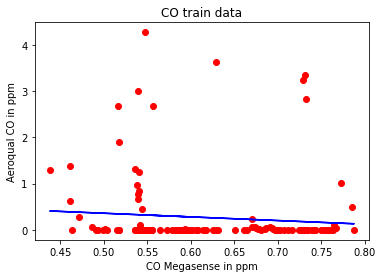

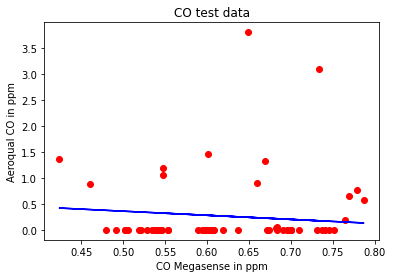

Random Forest MAE: 0.27202044595616015
Random Forest MSE: 0.41189346731211535
Random Forest RMSE: 0.6417892701752775
Random Forest R-2 score: 0.149
Random Forest Spearman correlation: 0.338


<ipython-input-13-460505978950>:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  regressor.fit(train_x, train_y)


In [13]:
msk = (np.random.rand(len(C)) < 0.7)
train = C[msk]
test = C[~msk]
regr = linear_model.LinearRegression()

train_x = np.asanyarray(train[['CO_mega_ppm']])
train_y = np.asanyarray(train[[' CO_ppm']])
regr.fit (train_x, train_y)
# The coefficients
print ('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)

test_x = np.asanyarray(test[['CO_mega_ppm']])
test_y = np.asanyarray(test[[' CO_ppm']])

# predicting values
test_y_hat = regr.predict(test_x)

ssr = np.sum((test_y_hat - test_y)**2)
ssr
ssr1 = np.sum((train_y - train_x)**2)
#  total sum of squares
sst = np.sum((test_y - np.mean(test_y))**2)
sst
sst1 = np.sum((train_y - np.mean(train_x))**2)

# R2 score
r2 = 1 - (ssr/sst)
r2_training = 1 -(ssr1/sst1)
print("R2: ", r2)
print("R2 training: ", r2_training)

# MAE
print("MAE: ", metrics.mean_absolute_error(test_y,test_y_hat))
print("MAE training: ", metrics.mean_absolute_error(train_x, train_y))

#MSE
print("MSE: ", mean_squared_error(test_y, test_y_hat))
print("MSE training: ", mean_squared_error(train_x, train_y))
#RMSE
print("RMSE: ", np.sqrt(mean_squared_error(test_y, test_y_hat)))
print("RMSE training: ", np.sqrt(mean_squared_error(train_x, train_y)))
#Variance
print("variance score: ", metrics.explained_variance_score(test_y, test_y_hat)) 
print("variance score training: ", metrics.explained_variance_score(train_x, train_y)) 

spearman = spearmanr(test_y, test_y_hat)
spearman1 = spearmanr(train_x, train_y)
print(f'Test data Spearman correlation: {spearman[0]:.3}')
print(f'Train data Spearman correlation: {spearman1[0]:.3}')
#pearson = pearsonr(test_y, test_y_hat)
#print(f'Test data Pearson correlation: {pearson[0]:.3}')

plt.scatter(train_x,train_y ,color = 'red')
plt.plot(train_x, regr.predict(train_x), color = 'blue')
plt.xlabel('CO Megasense in ppm')
plt.ylabel('Aeroqual CO in ppm')
plt.title("CO train data")
plt.show()

plt.scatter(test_x,test_y ,color = 'red')
plt.plot(test_x, regr.predict(test_x), color = 'blue')
plt.xlabel('CO Megasense in ppm')
plt.ylabel('Aeroqual CO in ppm')
plt.title("CO test data")
plt.show()

from sklearn.metrics import r2_score
regressor = RandomForestRegressor(n_estimators = 10, random_state = 0) 
  
# fit the regressor with x and y data 
regressor.fit(train_x, train_y) 
y_pred = regressor.predict(test_x)

print('Random Forest MAE:', metrics.mean_absolute_error(test_y, y_pred))
print('Random Forest MSE:', metrics.mean_squared_error(test_y, y_pred))
print('Random Forest RMSE:', np.sqrt(metrics.mean_squared_error(test_y, y_pred)))


test_score = r2_score(test_y, y_pred)
spearman = spearmanr(test_y, y_pred)
#pearson = pearsonr(test_y, predicted_test)

#print(f'Out-of-bag R-2 score estimate: {regressor.oob_score_:>5.3}')
print(f'Random Forest R-2 score: {test_score:>5.3}')
print(f'Random Forest Spearman correlation: {spearman[0]:.3}')
#print(f'Random Forest Pearson correlation: {pearson[0]:.3}')


Polynomial linear regression MAE: 0.40606935175009223
Polynomial linear regression MSE: 0.4951634211933876
Polynomial linear regression RMSE: 0.7036784927744968
Polynomial linear regression R-2 score: -0.0234
Polynomial linear regression Spearman correlation: 0.00513


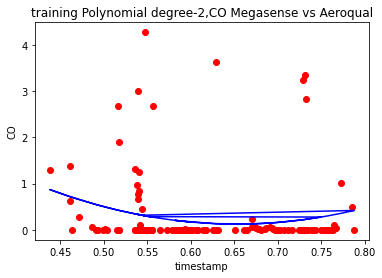

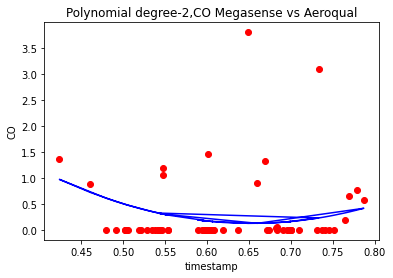

In [14]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=2)
X_poly = poly_reg.fit_transform(train_x)
pol_reg = LinearRegression()
pol_reg.fit(X_poly, train_y)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(test_x))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(test_y, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(test_y, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(test_y, pred_y)))



test_score = r2_score(test_y, pred_y)
spearman = spearmanr(test_y, pred_y)
#pearson = pearsonr(test_y, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
#print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

plt.scatter(train_x, train_y, color='red')
plt.plot(train_x, pol_reg.predict(poly_reg.fit_transform(train_x)), color='blue')
plt.title('training Polynomial degree-2,CO Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('CO')
plt.show()
plt.scatter(test_x, test_y, color='red')
plt.plot(test_x, pol_reg.predict(poly_reg.fit_transform(test_x)), color='blue')
plt.title('Polynomial degree-2,CO Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('CO')
plt.show()

Polynomial linear regression MAE: 0.4063742269624249
Polynomial linear regression MSE: 0.4943155158980212
Polynomial linear regression RMSE: 0.7030757540251414
Polynomial linear regression R-2 score: -0.0217
Polynomial linear regression Spearman correlation: -0.000498


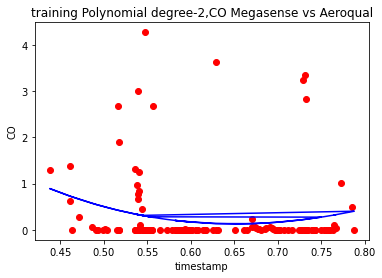

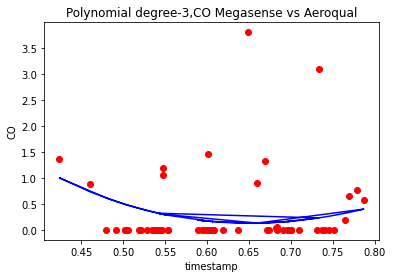

In [15]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=3)
X_poly = poly_reg.fit_transform(train_x)
pol_reg = LinearRegression()
pol_reg.fit(X_poly, train_y)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(test_x))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(test_y, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(test_y, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(test_y, pred_y)))



test_score = r2_score(test_y, pred_y)
spearman = spearmanr(test_y, pred_y)
#pearson = pearsonr(test_y, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
#print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

plt.scatter(train_x, train_y, color='red')
plt.plot(train_x, pol_reg.predict(poly_reg.fit_transform(train_x)), color='blue')
plt.title('training Polynomial degree-2,CO Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('CO')
plt.show()
plt.scatter(test_x, test_y, color='red')
plt.plot(test_x, pol_reg.predict(poly_reg.fit_transform(test_x)), color='blue')
plt.title('Polynomial degree-3,CO Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('CO')
plt.show()

Polynomial linear regression MAE: 0.4258485211188927
Polynomial linear regression MSE: 0.5182251670918157
Polynomial linear regression RMSE: 0.7198785780198045
Polynomial linear regression R-2 score: -0.0711
Polynomial linear regression Spearman correlation: -0.0508


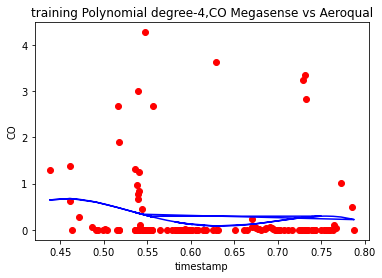

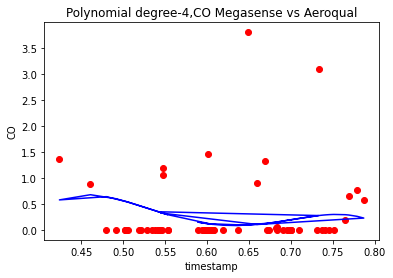

In [17]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=4)
X_poly = poly_reg.fit_transform(train_x)
pol_reg = LinearRegression()
pol_reg.fit(X_poly, train_y)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(test_x))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(test_y, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(test_y, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(test_y, pred_y)))



test_score = r2_score(test_y, pred_y)
spearman = spearmanr(test_y, pred_y)
#pearson = pearsonr(test_y, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
#print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

plt.scatter(train_x, train_y, color='red')
plt.plot(train_x, pol_reg.predict(poly_reg.fit_transform(train_x)), color='blue')
plt.title('training Polynomial degree-4,CO Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('CO')
plt.show()
plt.scatter(test_x, test_y, color='red')
plt.plot(test_x, pol_reg.predict(poly_reg.fit_transform(test_x)), color='blue')
plt.title('Polynomial degree-4,CO Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('CO')
plt.show()

In [20]:
list(P)

['Unnamed: 0',
 'Date Time',
 'Epoch date',
 'PM2.5_mega_ppb',
 'PM10_mega_ppb',
 ' PM10_ppm',
 ' PM2.5_ppm',
 'PM10_ppb',
 'PM2.5_ppb',
 'PM2.5_mega_ppm',
 'PM10_mega_ppm']

In [19]:
P['PM2.5_mega_ppm'] = P['PM2.5_mega_ppb']/1000
P['PM10_mega_ppm'] = P['PM10_mega_ppb']/1000

In [21]:
P.head(5)

,Unnamed: 0,Date Time,Epoch date,PM2.5_mega_ppb,PM10_mega_ppb,PM10_ppm,PM2.5_ppm,PM10_ppb,PM2.5_ppb,PM2.5_mega_ppm,PM10_mega_ppm
0,0,2021-07-09 11:36:00,1.625811e+09,3.77,3.77,0.009,0.005,9,5,0.00377,0.00377
1,1,2021-07-09 11:52:00,1.625812e+09,3.81,4.34,0.007,0.004,7,4,0.00381,0.00434
2,2,2021-07-09 11:54:00,1.625812e+09,3.78,3.92,0.007,0.005,7,5,0.00378,0.00392
3,3,2021-07-09 12:01:00,1.625812e+09,3.88,3.88,0.010,0.005,10,5,0.00388,0.00388
4,4,2021-07-09 12:11:00,1.625813e+09,3.45,3.45,0.007,0.005,7,5,0.00345,0.00345


Coefficients:  [[-0.00381272]]
Intercept:  [0.00471624]
R2:  -0.7340386734630509
R2 training:  -0.6548067393458865
MAE:  0.0008998729093589551
MAE training:  0.0006519999999999999
MSE:  1.1560257823087005e-06
MSE training:  6.678800000000001e-07
RMSE:  0.001075186394216696
RMSE training:  0.0008172392550532555
variance score:  0.0033118378033926144
variance score training:  -0.8082964770474317
Test data Spearman correlation: 0.5
Train data Spearman correlation: -0.038


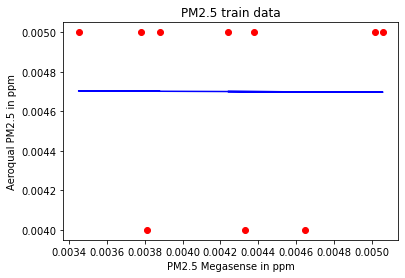

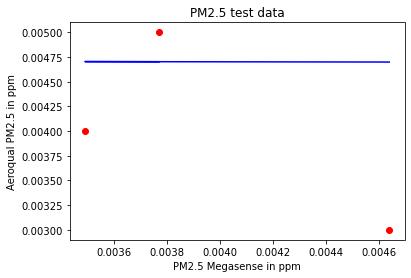

Random Forest MAE: 0.0008666666666666663
Random Forest MSE: 9.99999999999999e-07
Random Forest RMSE: 0.0009999999999999994
Random Forest R-2 score:  -0.5
Random Forest Spearman correlation: 0.5


<ipython-input-22-f3817408e451>:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  regressor.fit(train_x, train_y)


In [22]:
msk = (np.random.rand(len(P)) < 0.7)
train = P[msk]
test = P[~msk]
regr = linear_model.LinearRegression()

train_x = np.asanyarray(train[['PM2.5_mega_ppm']])
train_y = np.asanyarray(train[[' PM2.5_ppm']])
regr.fit (train_x, train_y)
# The coefficients
print ('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)

test_x = np.asanyarray(test[['PM2.5_mega_ppm']])
test_y = np.asanyarray(test[[' PM2.5_ppm']])

# predicting values
test_y_hat = regr.predict(test_x)

ssr = np.sum((test_y_hat - test_y)**2)
ssr
ssr1 = np.sum((train_y - train_x)**2)
#  total sum of squares
sst = np.sum((test_y - np.mean(test_y))**2)
sst
sst1 = np.sum((train_y - np.mean(train_x))**2)

# R2 score
r2 = 1 - (ssr/sst)
r2_training = 1 -(ssr1/sst1)
print("R2: ", r2)
print("R2 training: ", r2_training)

# MAE
print("MAE: ", metrics.mean_absolute_error(test_y,test_y_hat))
print("MAE training: ", metrics.mean_absolute_error(train_x, train_y))

#MSE
print("MSE: ", mean_squared_error(test_y, test_y_hat))
print("MSE training: ", mean_squared_error(train_x, train_y))
#RMSE
print("RMSE: ", np.sqrt(mean_squared_error(test_y, test_y_hat)))
print("RMSE training: ", np.sqrt(mean_squared_error(train_x, train_y)))
#Variance
print("variance score: ", metrics.explained_variance_score(test_y, test_y_hat)) 
print("variance score training: ", metrics.explained_variance_score(train_x, train_y)) 

spearman = spearmanr(test_y, test_y_hat)
spearman1 = spearmanr(train_x, train_y)
print(f'Test data Spearman correlation: {spearman[0]:.3}')
print(f'Train data Spearman correlation: {spearman1[0]:.3}')
#pearson = pearsonr(test_y, test_y_hat)
#print(f'Test data Pearson correlation: {pearson[0]:.3}')

plt.scatter(train_x,train_y ,color = 'red')
plt.plot(train_x, regr.predict(train_x), color = 'blue')
plt.xlabel('PM2.5 Megasense in ppm')
plt.ylabel('Aeroqual PM2.5 in ppm')
plt.title("PM2.5 train data")
plt.show()

plt.scatter(test_x,test_y ,color = 'red')
plt.plot(test_x, regr.predict(test_x), color = 'blue')
plt.xlabel('PM2.5 Megasense in ppm')
plt.ylabel('Aeroqual PM2.5 in ppm')
plt.title("PM2.5 test data")
plt.show()

from sklearn.metrics import r2_score
regressor = RandomForestRegressor(n_estimators = 10, random_state = 0) 
  
# fit the regressor with x and y data 
regressor.fit(train_x, train_y) 
y_pred = regressor.predict(test_x)

print('Random Forest MAE:', metrics.mean_absolute_error(test_y, y_pred))
print('Random Forest MSE:', metrics.mean_squared_error(test_y, y_pred))
print('Random Forest RMSE:', np.sqrt(metrics.mean_squared_error(test_y, y_pred)))


test_score = r2_score(test_y, y_pred)
spearman = spearmanr(test_y, y_pred)
#pearson = pearsonr(test_y, predicted_test)

#print(f'Out-of-bag R-2 score estimate: {regressor.oob_score_:>5.3}')
print(f'Random Forest R-2 score: {test_score:>5.3}')
print(f'Random Forest Spearman correlation: {spearman[0]:.3}')
#print(f'Random Forest Pearson correlation: {pearson[0]:.3}')


In [64]:
df = pd.read_csv("CO_20july.csv")


In [65]:
df

,Epoch date,GMT,CO_mega_ppb,Temperature,Humidity,Battery_Percentage
0,1624528097,24-06-2021 09:48,544,33.520000,43.998001,100
1,1624528100,24-06-2021 09:48,544,33.520000,43.998001,100
2,1624528377,24-06-2021 09:52,540,33.470001,44.150002,100
3,1624528380,24-06-2021 09:53,540,33.470001,44.150002,100
4,1624528625,24-06-2021 09:57,541,33.450001,44.245998,100
...,...,...,...,...,...,...
1583,1626745567,20-07-2021 01:46,514,31.629999,49.874001,100
1584,1626747906,20-07-2021 02:25,512,31.570000,49.529999,100
1585,1626748572,20-07-2021 02:36,514,31.559999,49.516998,100
1586,1626749129,20-07-2021 02:45,513,31.549999,49.515999,100


In [66]:
import time
t= []
epoch_time = df['Epoch date']
for i in range(len(df)):
    time_formatted = time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(epoch_time[i]))
    t.append(time_formatted)

In [67]:
df['Date Time']= t

In [68]:
df

,Epoch date,GMT,CO_mega_ppb,Temperature,Humidity,Battery_Percentage,Date Time
0,1624528097,24-06-2021 09:48,544,33.520000,43.998001,100,2021-06-24 15:18:17
1,1624528100,24-06-2021 09:48,544,33.520000,43.998001,100,2021-06-24 15:18:20
2,1624528377,24-06-2021 09:52,540,33.470001,44.150002,100,2021-06-24 15:22:57
3,1624528380,24-06-2021 09:53,540,33.470001,44.150002,100,2021-06-24 15:23:00
4,1624528625,24-06-2021 09:57,541,33.450001,44.245998,100,2021-06-24 15:27:05
...,...,...,...,...,...,...,...
1583,1626745567,20-07-2021 01:46,514,31.629999,49.874001,100,2021-07-20 07:16:07
1584,1626747906,20-07-2021 02:25,512,31.570000,49.529999,100,2021-07-20 07:55:06
1585,1626748572,20-07-2021 02:36,514,31.559999,49.516998,100,2021-07-20 08:06:12
1586,1626749129,20-07-2021 02:45,513,31.549999,49.515999,100,2021-07-20 08:15:29


In [69]:
df = df.drop(['GMT'], axis = 1)


In [72]:
df['Date Time'] = pd.to_datetime(df['Date Time'], dayfirst = True)
df.set_index("Date Time", inplace=True)
DF = df.resample("T").mean().round(2)


In [73]:
DF = DF.dropna()
DF

,Epoch date,CO_mega_ppb,Temperature,Humidity,Battery_Percentage
Date Time,,,,,
2021-06-24 15:18:00,1.624528e+09,544.0,33.52,44.00,100.0
2021-06-24 15:22:00,1.624528e+09,540.0,33.47,44.15,100.0
2021-06-24 15:23:00,1.624528e+09,540.0,33.47,44.15,100.0
2021-06-24 15:27:00,1.624529e+09,541.0,33.45,44.25,100.0
2021-06-24 15:30:00,1.624529e+09,539.0,33.44,44.21,100.0
...,...,...,...,...,...
2021-07-20 07:16:00,1.626746e+09,514.0,31.63,49.87,100.0
2021-07-20 07:55:00,1.626748e+09,512.0,31.57,49.53,100.0
2021-07-20 08:06:00,1.626749e+09,514.0,31.56,49.52,100.0


In [61]:
aero = pd.read_csv("C:\\Users\\spand\\Downloads\\Aeroqual_co_220721.csv")
aero['Date Time'] = pd.to_datetime(aero['Date Time'])

In [62]:
aero

,Date Time,Monitor ID,Location ID,CO(ppm)
0,2021-07-19 15:06:00,1,1,0.20
1,2021-07-19 15:07:00,1,1,0.00
2,2021-07-19 15:08:00,1,1,0.00
3,2021-07-19 15:09:00,1,1,0.00
4,2021-07-19 15:10:00,1,1,0.00
...,...,...,...,...
4049,2021-07-22 10:43:00,1,1,0.00
4050,2021-07-22 10:44:00,1,1,0.00
4051,2021-07-22 10:45:00,1,1,0.00
4052,2021-07-22 10:46:00,1,1,0.00


In [71]:
aero = aero.drop([' Monitor ID', ' Location ID'], axis = 1)

In [74]:
A = pd.merge(DF, aero, on = 'Date Time', how = 'inner')

In [77]:
A

,Date Time,Epoch date,CO_mega_ppb,Temperature,Humidity,Battery_Percentage,CO(ppm),CO_mega_ppm
0,2021-07-19 15:37:00,1.626689e+09,511.0,36.90,39.57,74.0,0.65,0.511
1,2021-07-19 15:39:00,1.626689e+09,652.0,36.99,39.38,75.0,0.73,0.652
2,2021-07-19 15:42:00,1.626690e+09,530.0,37.31,39.00,75.0,0.94,0.530
3,2021-07-19 15:52:00,1.626690e+09,535.0,38.20,37.48,79.0,1.36,0.535
4,2021-07-19 15:57:00,1.626690e+09,548.0,38.52,36.81,81.0,1.75,0.548
...,...,...,...,...,...,...,...,...
91,2021-07-20 07:16:00,1.626746e+09,514.0,31.63,49.87,100.0,0.00,0.514
92,2021-07-20 07:55:00,1.626748e+09,512.0,31.57,49.53,100.0,0.00,0.512
93,2021-07-20 08:06:00,1.626749e+09,514.0,31.56,49.52,100.0,0.00,0.514
94,2021-07-20 08:15:00,1.626749e+09,513.0,31.55,49.52,100.0,0.00,0.513


In [76]:
A['CO_mega_ppm'] = A['CO_mega_ppb']/1000

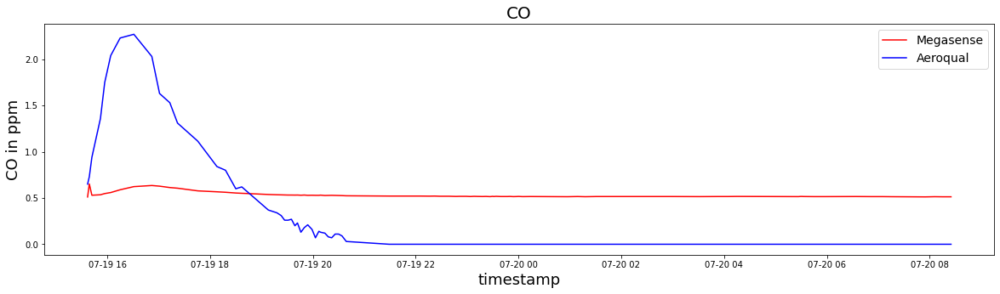

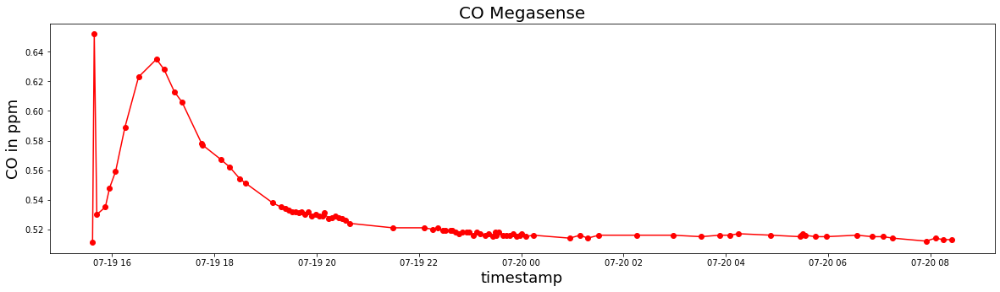

Text(0.5, 1.0, 'CO Aeroqual')

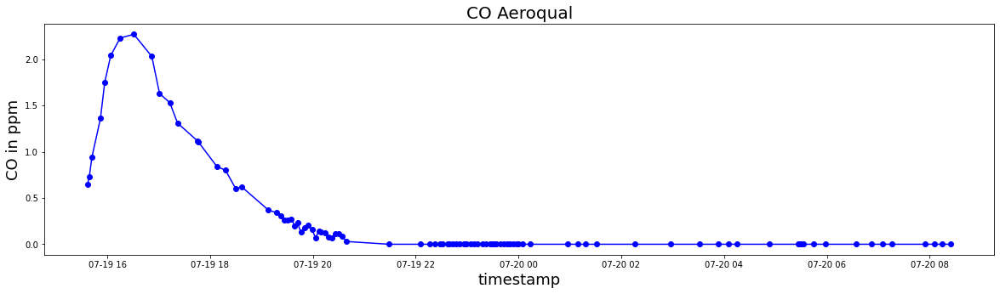

In [79]:
import matplotlib.pyplot as plt
x = A['Date Time']
y1 = A['CO_mega_ppm']
y2 = A[' CO(ppm)']
fig= plt.figure(figsize=(20,5))
plt.plot(x, y1, '-r') 
plt.plot(x, y2, 'b')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
plt.legend(["Megasense", "Aeroqual"], fontsize=14)
plt.title('CO', fontsize=20)
plt.show()
fig= plt.figure(figsize=(20,5))
# plotting points as a scatter plot
plt.plot(x, y1, '-or')
plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
#plt.legend(["Megasense", "Aeroqual"])
plt.title('CO Megasense', fontsize=20)
plt.show()

fig= plt.figure(figsize=(20,5))
plt.plot(x, y2, '-ob')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
#plt.legend(["Aeroqual"])
plt.title('CO Aeroqual', fontsize=20)

max correlation is at lag -1
max correlation is  0.873
Pearsons correlation: 0.830
MSE CO:  0.3416292109374999
MAE CO:  0.5193697916666666
RMSE CO:  0.58449055675648


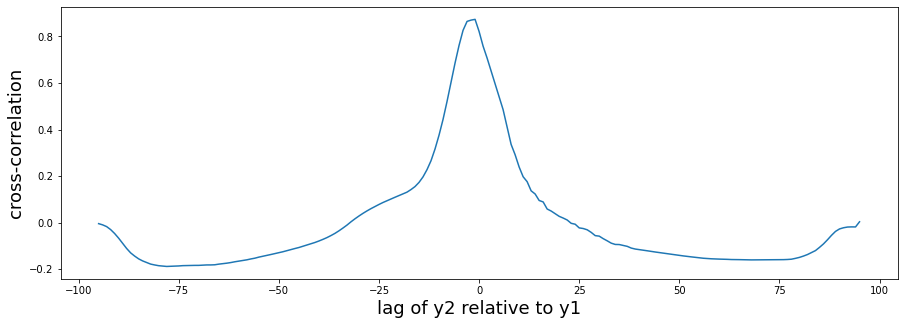

In [81]:
import numpy as np
from scipy.stats import pearsonr
from sklearn.metrics import r2_score
from sklearn import linear_model
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
npts = len(A)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(A['CO_mega_ppm'], A[' CO(ppm)'])
MAE = mean_absolute_error(A['CO_mega_ppm'],A[' CO(ppm)'])
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(A['CO_mega_ppm'], A[' CO(ppm)'])))

In [84]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
from sklearn.ensemble import RandomForestRegressor
msk = (np.random.rand(len(A)) < 0.7)
train = A[msk]
test = A[~msk]
regr = linear_model.LinearRegression()

train_x1 = np.asanyarray(train[['CO_mega_ppm', 'Temperature']])
train_y1 = np.asanyarray(train[[' CO(ppm)']])
regr.fit (train_x1, train_y1)
# The coefficients
print ('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)

test_x1 = np.asanyarray(test[['CO_mega_ppm', 'Temperature']])
test_y1 = np.asanyarray(test[[' CO(ppm)']])

# predicting values
test_y_hat = regr.predict(test_x1)

ssr = np.sum((test_y_hat - test_y1)**2)
ssr

#  total sum of squares
sst = np.sum((test_y1 - np.mean(test_y1))**2)
sst

# R2 score
r2_score = 1 - (ssr/sst)
print("R2 ", r2_score)

# MAE
print("MAE ", metrics.mean_absolute_error(test_y1,test_y_hat))

#MSE
print("MSE ", mean_squared_error(test_y1, test_y_hat))

#RMSE
print("RMSE ", np.sqrt(mean_squared_error(test_y1, test_y_hat)))

#Variance
print("variance score =", metrics.explained_variance_score(test_y1, test_y_hat)) 

#Spearman
spearman = spearmanr(test_y1, test_y_hat)
print(f'Test data Spearman correlation: {spearman[0]:.3}')

from sklearn.metrics import r2_score
regressor = RandomForestRegressor(n_estimators = 10, random_state = 0) 
  
# fit the regressor with x and y data 
regressor.fit(train_x1, train_y1) 
y_pred = regressor.predict(test_x1)


print('Mean Absolute Error Random Forest:', metrics.mean_absolute_error(test_y1, y_pred))
print('Mean Squared Error Random Forest:', metrics.mean_squared_error(test_y1, y_pred))
print('Root Mean Squared Error Random Forest:', np.sqrt(metrics.mean_squared_error(test_y1, y_pred)))

predicted_train = regressor.predict(train_x1)
predicted_test = regressor.predict(test_x1)
test_score = r2_score(test_y1, predicted_test)
spearman = spearmanr(test_y1, predicted_test)
#pearson = pearsonr(test_y, predicted_test)
#print(f'Out-of-bag R-2 score estimate: {regressor.oob_score_:>5.3}')
print(f'Test data R-2 score Random Forest: {test_score:>5.3}')
print(f'Test data Spearman correlation Random Forest: {spearman[0]:.3}')
#print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')

Coefficients:  [[4.39380318 0.21935832]]
Intercept:  [-9.22800597]
R2  0.9207542625153406
MAE  0.09154925710222765
MSE  0.020431848699614622
RMSE  0.14294001783830385
variance score = 0.9232026006407543
Test data Spearman correlation: 0.93
Mean Absolute Error Random Forest: 0.06783333333333334
Mean Squared Error Random Forest: 0.021888999999999995
Root Mean Squared Error Random Forest: 0.14794931564559533
Test data R-2 score Random Forest: 0.915
Test data Spearman correlation Random Forest: 0.978


<ipython-input-84-7ddf2149ee59>:55: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  regressor.fit(train_x1, train_y1)


In [85]:
msk = (np.random.rand(len(A)) < 0.7)
train = A[msk]
test = A[~msk]
regr = linear_model.LinearRegression()

train_x1 = np.asanyarray(train[['CO_mega_ppm', 'Humidity']])
train_y1 = np.asanyarray(train[[' CO(ppm)']])
regr.fit (train_x1, train_y1)
# The coefficients
print ('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)

test_x1 = np.asanyarray(test[['CO_mega_ppm', 'Humidity']])
test_y1 = np.asanyarray(test[[' CO(ppm)']])

# predicting values
test_y_hat = regr.predict(test_x1)

ssr = np.sum((test_y_hat - test_y1)**2)
ssr

#  total sum of squares
sst = np.sum((test_y1 - np.mean(test_y1))**2)
sst

# R2 score
r2_score = 1 - (ssr/sst)
print("R2 ", r2_score)

# MAE
print("MAE ", metrics.mean_absolute_error(test_y1,test_y_hat))

#MSE
print("MSE ", mean_squared_error(test_y1, test_y_hat))

#RMSE
print("RMSE ", np.sqrt(mean_squared_error(test_y1, test_y_hat)))

#Variance
print("variance score =", metrics.explained_variance_score(test_y1, test_y_hat)) 

#Spearman
spearman = spearmanr(test_y1, test_y_hat)
print(f'Test data Spearman correlation: {spearman[0]:.3}')

from sklearn.metrics import r2_score
regressor = RandomForestRegressor(n_estimators = 10, random_state = 0) 
  
# fit the regressor with x and y data 
regressor.fit(train_x1, train_y1) 
y_pred = regressor.predict(test_x1)


print('Mean Absolute Error Random Forest:', metrics.mean_absolute_error(test_y1, y_pred))
print('Mean Squared Error Random Forest:', metrics.mean_squared_error(test_y1, y_pred))
print('Root Mean Squared Error Random Forest:', np.sqrt(metrics.mean_squared_error(test_y1, y_pred)))

predicted_train = regressor.predict(train_x1)
predicted_test = regressor.predict(test_x1)
test_score = r2_score(test_y1, predicted_test)
spearman = spearmanr(test_y1, predicted_test)
#pearson = pearsonr(test_y, predicted_test)
#print(f'Out-of-bag R-2 score estimate: {regressor.oob_score_:>5.3}')
print(f'Test data R-2 score Random Forest: {test_score:>5.3}')
print(f'Test data Spearman correlation Random Forest: {spearman[0]:.3}')
#print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')

Coefficients:  [[ 6.77363992 -0.10005243]]
Intercept:  [1.56297254]
R2  0.6535094440948157
MAE  0.10622151137499154
MSE  0.06411753597876076
RMSE  0.25321440713111243
variance score = 0.6597397266019921
Test data Spearman correlation: 0.946
Mean Absolute Error Random Forest: 0.0990625
Mean Squared Error Random Forest: 0.0401708125
Root Mean Squared Error Random Forest: 0.20042657633158334
Test data R-2 score Random Forest: 0.783
Test data Spearman correlation Random Forest: 0.985


<ipython-input-85-522472082d81>:50: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  regressor.fit(train_x1, train_y1)


In [86]:
msk = (np.random.rand(len(A)) < 0.7)
train = A[msk]
test = A[~msk]
regr = linear_model.LinearRegression()

train_x1 = np.asanyarray(train[['CO_mega_ppm', 'Temperature', 'Humidity']])
train_y1 = np.asanyarray(train[[' CO(ppm)']])
regr.fit (train_x1, train_y1)
# The coefficients
print ('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)

test_x1 = np.asanyarray(test[['CO_mega_ppm', 'Temperature', 'Humidity']])
test_y1 = np.asanyarray(test[[' CO(ppm)']])

# predicting values
test_y_hat = regr.predict(test_x1)

ssr = np.sum((test_y_hat - test_y1)**2)
ssr

#  total sum of squares
sst = np.sum((test_y1 - np.mean(test_y1))**2)
sst

# R2 score
r2_score = 1 - (ssr/sst)
print("R2 ", r2_score)

# MAE
print("MAE ", metrics.mean_absolute_error(test_y1,test_y_hat))

#MSE
print("MSE ", mean_squared_error(test_y1, test_y_hat))

#RMSE
print("RMSE ", np.sqrt(mean_squared_error(test_y1, test_y_hat)))

#Variance
print("variance score =", metrics.explained_variance_score(test_y1, test_y_hat)) 

#Spearman
spearman = spearmanr(test_y1, test_y_hat)
print(f'Test data Spearman correlation: {spearman[0]:.3}')

from sklearn.metrics import r2_score
regressor = RandomForestRegressor(n_estimators = 10, random_state = 0) 
  
# fit the regressor with x and y data 
regressor.fit(train_x1, train_y1) 
y_pred = regressor.predict(test_x1)


print('Mean Absolute Error Random Forest:', metrics.mean_absolute_error(test_y1, y_pred))
print('Mean Squared Error Random Forest:', metrics.mean_squared_error(test_y1, y_pred))
print('Root Mean Squared Error Random Forest:', np.sqrt(metrics.mean_squared_error(test_y1, y_pred)))

predicted_train = regressor.predict(train_x1)
predicted_test = regressor.predict(test_x1)
test_score = r2_score(test_y1, predicted_test)
spearman = spearmanr(test_y1, predicted_test)
#pearson = pearsonr(test_y, predicted_test)
#print(f'Out-of-bag R-2 score estimate: {regressor.oob_score_:>5.3}')
print(f'Test data R-2 score Random Forest: {test_score:>5.3}')
print(f'Test data Spearman correlation Random Forest: {spearman[0]:.3}')
#print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')

Coefficients:  [[ 3.98791753  0.11723783 -0.05023803]]
Intercept:  [-3.22335249]
R2  0.9321354522538987
MAE  0.06633561255239609
MSE  0.011344370807373527
RMSE  0.10650995637673281
variance score = 0.9321556520558453
Test data Spearman correlation: 0.859
Mean Absolute Error Random Forest: 0.030083333333333337
Mean Squared Error Random Forest: 0.006075472222222222
Root Mean Squared Error Random Forest: 0.07794531558870117
Test data R-2 score Random Forest: 0.964
Test data Spearman correlation Random Forest: 0.978


<ipython-input-86-b837fd541436>:50: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  regressor.fit(train_x1, train_y1)


# CO Mobile Data

In [6]:
# Importing Libraries

from datetime import datetime
from pytz import timezone
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
from sklearn.metrics import r2_score
from sklearn import linear_model
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import time

In [9]:
d1 = pd.read_csv("Megasense_device76//Mobile_27july.csv")
d2 = pd.read_csv("Megasense_device61//Mobile_27july_61.csv")
aero= pd.read_csv("Aeroqual_data//aeroqualco_270721.csv")

In [10]:
print(d1.head(5))
print(d2.head(5))
print(aero.head(5))

   Epoch date               GMT  Temperature   Humidity  Pressure_hpa  \
0  1627372186  27-07-2021 07:49    27.389999  64.291000    936.599121   
1  1627372217  27-07-2021 07:50    27.570000  63.790001    936.641296   
2  1627372278  27-07-2021 07:51    28.309999  63.787998    936.623474   
3  1627372320  27-07-2021 07:52    28.559999  61.963001    936.565918   
4  1627372350  27-07-2021 07:52    28.719999  61.264999    936.544922   

   CO_mega_ppb  CO_mega_ppm  NO2_mega_ppb  NO2_mega_ppm  Ozone_ppm   Latitude  \
0          401        0.401          4375         4.375          0  17.445420   
1          408        0.408          3807         3.807          0  17.445428   
2          419        0.419          3450         3.450          0  17.445422   
3          425        0.425          3157         3.157          0  17.445425   
4          431        0.431          3017         3.017          0  17.445419   

   Longitude  
0  78.349824  
1  78.349811  
2  78.349820  
3  78.349820  

In [11]:
import time
# Converting Epoch date to localtime

# Device1 Megasense_76
t1= []
epoch_time1 = d1['Epoch date']
for i in range(len(d1)):
    time_formatted1 = time.strftime("%d-%m-%Y %H:%M:%S", time.localtime(epoch_time1[i]))
    t1.append(time_formatted1)
# Device2 Megasense_61    
t2= []
epoch_time2 = d2['Epoch date']
for i in range(len(d2)):
    time_formatted2 = time.strftime("%d-%m-%Y %H:%M:%S", time.localtime(epoch_time2[i]))
    t2.append(time_formatted2)

# Creating a Column in the dataframe
d1['Date Time']= t1
d2['Date Time']= t2

# Device1 averaging the values to 1 min
d1['Date Time'] = pd.to_datetime(d1['Date Time'], dayfirst = True)
d1.set_index("Date Time", inplace=True)
D1 = d1.resample("T").mean().round(2)

# Device1 averaging the values to 1 min
d2['Date Time'] = pd.to_datetime(d2['Date Time'], dayfirst = True)
d2.set_index("Date Time", inplace=True)
D2 = d2.resample("T").mean().round(2)


# Dropping the columns in Aeroqual file
aero = aero.drop([' Monitor ID', ' Location ID'], axis = 1)
# Converting object type to datetime
aero['Date Time'] = pd.to_datetime(aero['Date Time'], dayfirst = True)

In [12]:

t = D1['Date Time']
s1 = D1['Temperature']
s2 = D1['Humidity']
s3 = D1['Pressure_hpa']
fig, axs = plt.subplots(3, 1, sharex=True)
# Remove horizontal space between axes
fig.subplots_adjust(hspace=0)

# Plot each graph, and manually set the y tick values
axs[0].plot(t, s1)
#axs[0].set_yticks(np.arange(-0.9, 1.0, 0.4))
#axs[0].set_ylim(-1, 1)

axs[1].plot(t, s2)
#axs[1].set_yticks(np.arange(0.1, 1.0, 0.2))
#axs[1].set_ylim(0, 1)

axs[2].plot(t, s3)
#axs[2].set_yticks(np.arange(-0.9, 1.0, 0.4))
#axs[2].set_ylim(-1, 1)

plt.show()

KeyError: 'Date Time'

In [13]:
# Merging Aeroqual and device1 files
A1 = pd.merge(aero, D1, on = 'Date Time', how = 'inner')
# Dropping the NA values
A1 = A1.dropna()

#Mderging Aeroqual and device2 files
A2 = pd.merge(aero, D2, on = 'Date Time', how = 'inner')
# Dropping the NA values
A2 = A2.dropna()

# Printing the A1 and A2 dataframes
print(A1.head(5))
print(A2.head(5))

             Date Time   CO_ppm    Epoch date  Temperature  Humidity  \
49 2021-07-27 14:18:00      0.0  1.627376e+09        37.48     38.55   
50 2021-07-27 14:19:00      0.0  1.627376e+09        37.80     38.44   
51 2021-07-27 14:20:00      0.0  1.627376e+09        38.31     38.35   
52 2021-07-27 14:21:00      0.0  1.627376e+09        38.80     34.65   
53 2021-07-27 14:22:00      0.0  1.627376e+09        38.53     35.22   

    Pressure_hpa  CO_mega_ppb  CO_mega_ppm  NO2_mega_ppb  NO2_mega_ppm  \
49        939.70        574.0         0.57        2529.5          2.53   
50        939.64        573.5         0.57        2526.5          2.53   
51        939.72        605.0         0.60        2582.0          2.58   
52        939.98        613.0         0.61        2478.0          2.48   
53        940.70        623.5         0.62        2560.5          2.56   

    Ozone_ppm  Latitude  Longitude  
49      128.0     17.49      78.41  
50      119.0     17.49      78.41  
51       31

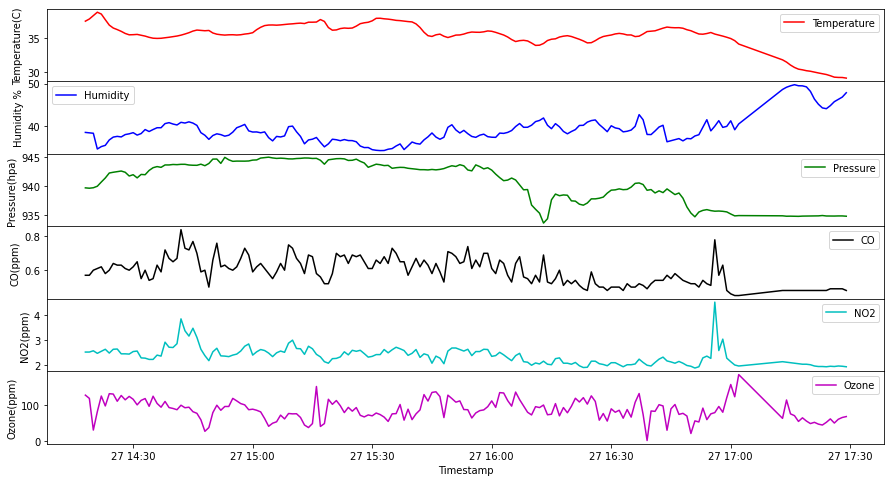

In [37]:
t = A1['Date Time']
s1 = A1['Temperature']
s2 = A1['Humidity']
s3 = A1['Pressure_hpa']
s4 = A1['CO_mega_ppm']
s5 = A1['NO2_mega_ppm']
s6 = A1['Ozone_ppm']
fig, axs = plt.subplots(6, 1,figsize=(15,8), sharex=True)
# Remove horizontal space between axes
fig.subplots_adjust(hspace=0)

# Plot each graph, and manually set the y tick values
axs[0].plot(t, s1,'r', label = 'Temperature')
axs[0].legend()
axs[0].set_ylabel('Temperature(C)')

axs[1].plot(t, s2, 'b', label = 'Humidity')
axs[1].legend()
axs[1].set_ylabel('Humidity %')

axs[2].plot(t, s3,'g', label = 'Pressure')
axs[2].legend()
axs[2].set_ylabel('Pressure(hpa)')

axs[3].plot(t, s4,'k', label = 'CO')
axs[3].legend()
axs[3].set_ylabel('CO(ppm)')

axs[4].plot(t, s5,'c', label = 'NO2')
axs[4].legend()
axs[4].set_ylabel('NO2(ppm)')

axs[5].plot(t, s6,'m', label = 'Ozone')
axs[5].legend()
axs[5].set_ylabel('Ozone(ppm)')
axs[5].set_xlabel('Timestamp')

plt.show()

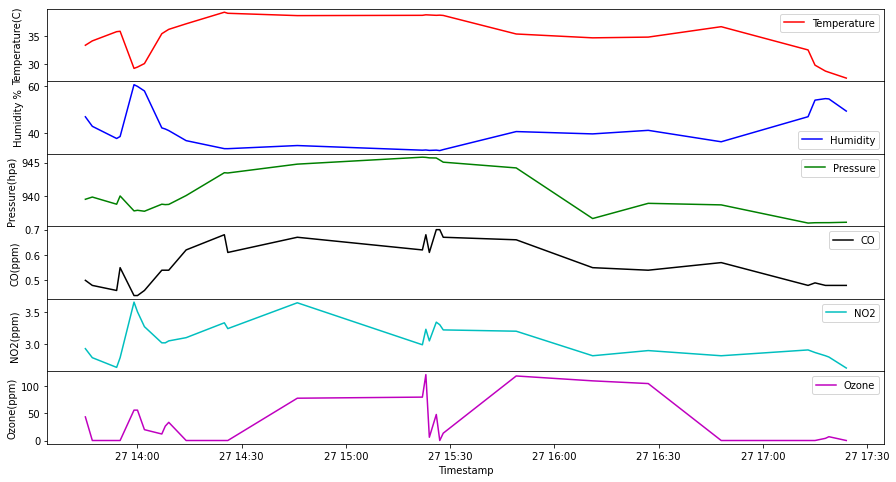

In [38]:
t = A2['Date Time']
s1 = A2['Temperature']
s2 = A2['Humidity']
s3 = A2['Pressure_hpa']
s4 = A2['CO_mega_ppm']
s5 = A2['NO2_mega_ppm']
s6 = A2['Ozone_ppm']
fig, axs = plt.subplots(6, 1,figsize=(15,8), sharex=True)
# Remove horizontal space between axes
fig.subplots_adjust(hspace=0)

# Plot each graph, and manually set the y tick values
axs[0].plot(t, s1,'r', label = 'Temperature')
axs[0].legend()
axs[0].set_ylabel('Temperature(C)')

axs[1].plot(t, s2, 'b', label = 'Humidity')
axs[1].legend()
axs[1].set_ylabel('Humidity %')

axs[2].plot(t, s3,'g', label = 'Pressure')
axs[2].legend()
axs[2].set_ylabel('Pressure(hpa)')

axs[3].plot(t, s4,'k', label = 'CO')
axs[3].legend()
axs[3].set_ylabel('CO(ppm)')

axs[4].plot(t, s5,'c', label = 'NO2')
axs[4].legend()
axs[4].set_ylabel('NO2(ppm)')

axs[5].plot(t, s6,'m', label = 'Ozone')
axs[5].legend()
axs[5].set_ylabel('Ozone(ppm)')
axs[5].set_xlabel('Timestamp')

plt.show()

In [ ]:
# Comparing the reading between Aeroqual and Device1

x = A1['Date Time']
y1 = A1['CO_mega_ppm']
y2 = A1[' CO_ppm']
fig= plt.figure(figsize=(20,5))
plt.plot(x, y1, '-r') 
plt.plot(x, y2, 'b')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
plt.legend(["Megasense", "Aeroqual"], fontsize=14)
plt.title('CO', fontsize=20)
plt.show()
fig= plt.figure(figsize=(20,5))
# plotting points as a scatter plot
plt.plot(x, y1, '-or')
plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
#plt.legend(["Megasense", "Aeroqual"])
plt.title('CO Megasense', fontsize=20)
plt.show()

fig= plt.figure(figsize=(20,5))
plt.plot(x, y2, '-ob')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
#plt.legend(["Aeroqual"])
plt.title('CO Aeroqual', fontsize=20)



max correlation is at lag -15
max correlation is  0.42
Pearsons correlation: 0.112
MSE CO:  24.648716483516488
MAE CO:  3.4843956043956044
RMSE CO:  4.964747373584731


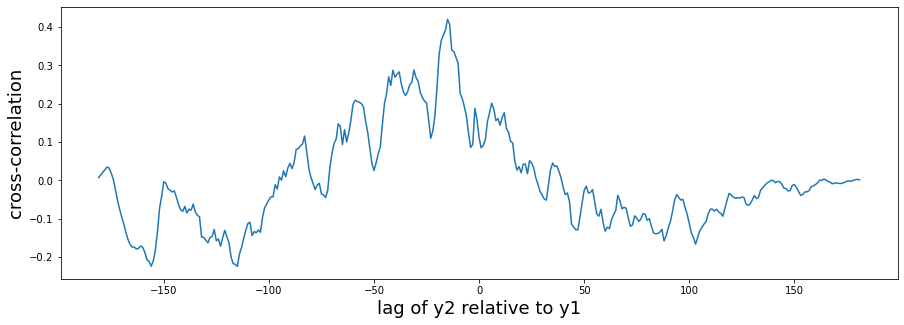

In [7]:
# Finding Correlation and Lag
npts = len(A1)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error( y1, y2)
MAE = mean_absolute_error(y1,y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

In [8]:
print(A1.head(5))
A1['CO_mega_ppm_shift'] = A1['CO_mega_ppm'].shift(-15)
print(A1.head(5))
#print(b8.tail(5))


             Date Time   CO_ppm    Epoch date  Temperature  Humidity  \
49 2021-07-27 14:18:00      0.0  1.627376e+09        37.48     38.55   
50 2021-07-27 14:19:00      0.0  1.627376e+09        37.80     38.44   
51 2021-07-27 14:20:00      0.0  1.627376e+09        38.31     38.35   
52 2021-07-27 14:21:00      0.0  1.627376e+09        38.80     34.65   
53 2021-07-27 14:22:00      0.0  1.627376e+09        38.53     35.22   

    CO_mega_ppb  CO_mega_ppm  NO2_mega_ppb  NO2_mega_ppm  Latitude  Longitude  
49        574.0         0.57        2529.5          2.53     17.49      78.41  
50        573.5         0.57        2526.5          2.53     17.49      78.41  
51        605.0         0.60        2582.0          2.58     17.49      78.41  
52        613.0         0.61        2478.0          2.48     17.49      78.41  
53        623.5         0.62        2560.5          2.56     17.48      78.41  
             Date Time   CO_ppm    Epoch date  Temperature  Humidity  \
49 2021-07-27 1

167


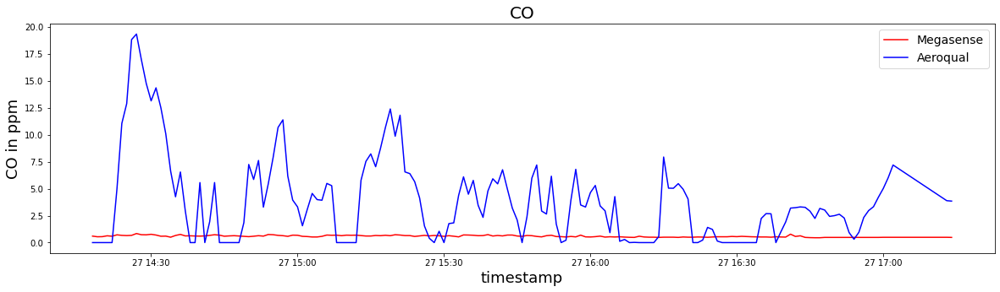

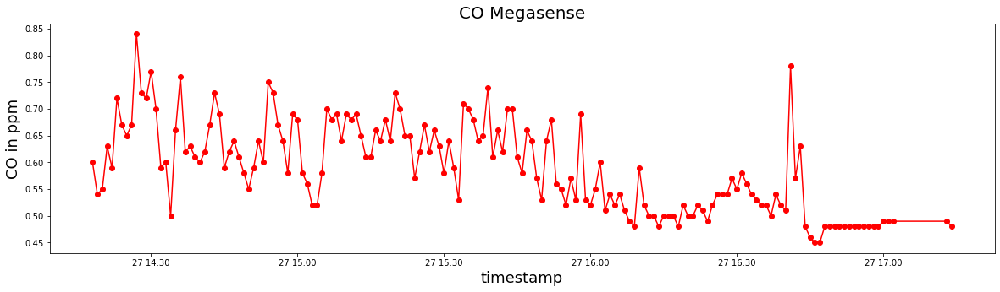

Text(0.5, 1.0, 'CO Aeroqual')

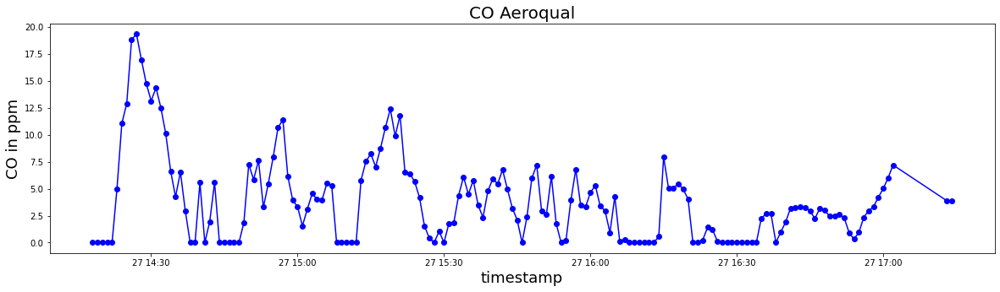

In [9]:
# Comparing the reading between Aeroqual and Device1
A1_1 = A1.dropna()
print(len(A1_1))
x = A1_1['Date Time']
y1 = A1_1['CO_mega_ppm_shift']
y2 = A1_1[' CO_ppm']
fig= plt.figure(figsize=(20,5))
plt.plot(x, y1, '-r') 
plt.plot(x, y2, 'b')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
plt.legend(["Megasense", "Aeroqual"], fontsize=14)
plt.title('CO', fontsize=20)
plt.show()
fig= plt.figure(figsize=(20,5))
# plotting points as a scatter plot
plt.plot(x, y1, '-or')
plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
#plt.legend(["Megasense", "Aeroqual"])
plt.title('CO Megasense', fontsize=20)
plt.show()

fig= plt.figure(figsize=(20,5))
plt.plot(x, y2, '-ob')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
#plt.legend(["Aeroqual"])
plt.title('CO Aeroqual', fontsize=20)



In [10]:
len(A1)

182

max correlation is at lag 0
max correlation is  0.427
Pearsons correlation: 0.429
MSE CO:  26.0719502994012
MAE CO:  3.578982035928144
RMSE CO:  5.106069946583301


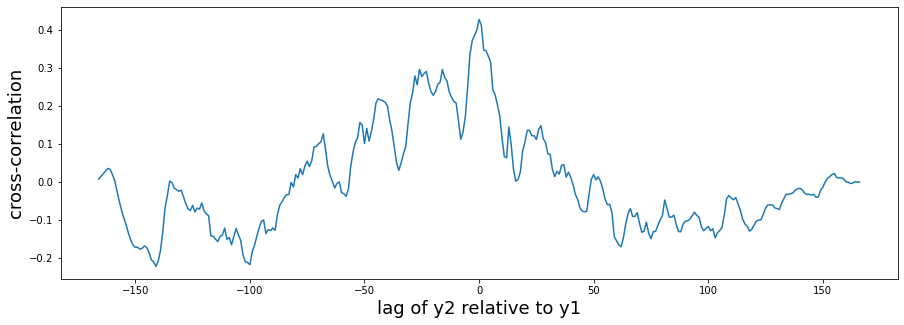

In [11]:

# Finding Correlation and Lag
npts = len(A1_1)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error( y1, y2)
MAE = mean_absolute_error(y1,y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

In [12]:
A1_2 = A1_1[A1_1[' CO_ppm'] != 0]
len(A1_2)

129

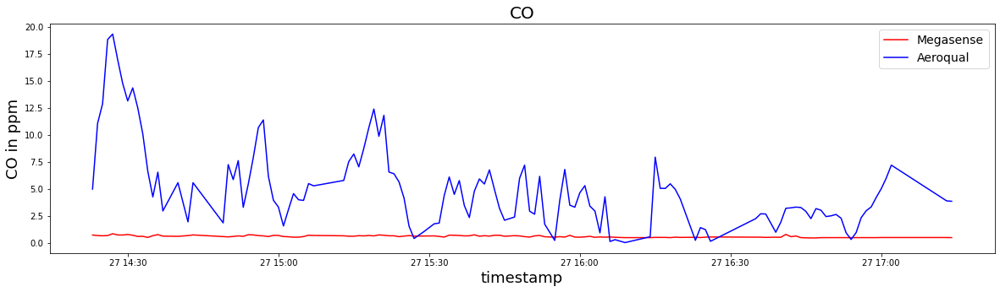

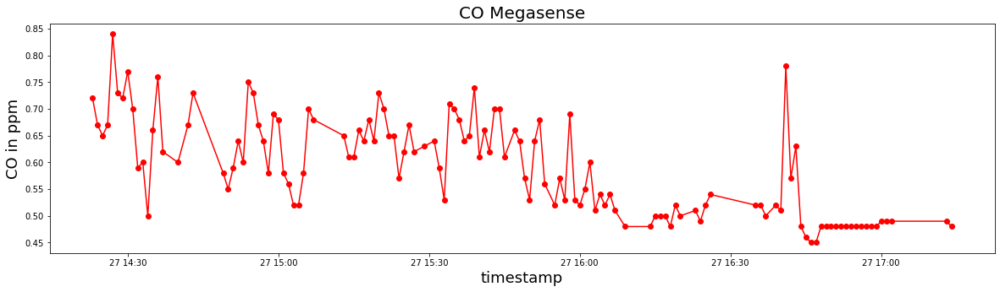

Text(0.5, 1.0, 'CO Aeroqual')

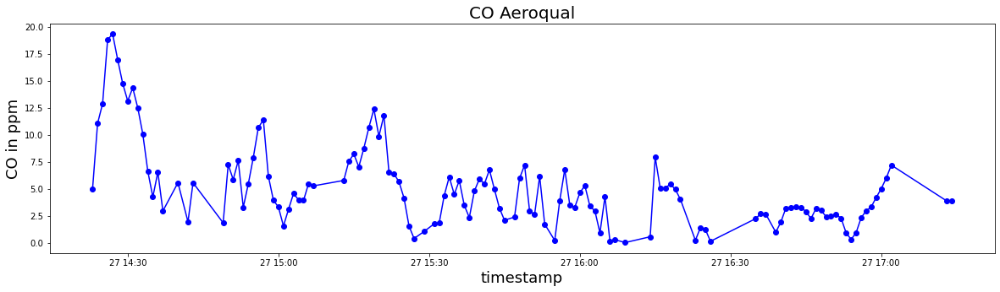

In [13]:
# Comparing the reading between Aeroqual and Device1

x = A1_2['Date Time']
y1 = A1_2['CO_mega_ppm_shift']
y2 = A1_2[' CO_ppm']
fig= plt.figure(figsize=(20,5))
plt.plot(x, y1, '-r') 
plt.plot(x, y2, 'b')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
plt.legend(["Megasense", "Aeroqual"], fontsize=14)
plt.title('CO', fontsize=20)
plt.show()
fig= plt.figure(figsize=(20,5))
# plotting points as a scatter plot
plt.plot(x, y1, '-or')
plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
#plt.legend(["Megasense", "Aeroqual"])
plt.title('CO Megasense', fontsize=20)
plt.show()

fig= plt.figure(figsize=(20,5))
plt.plot(x, y2, '-ob')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
#plt.legend(["Aeroqual"])
plt.title('CO Aeroqual', fontsize=20)



max correlation is at lag 0
max correlation is  0.518
Pearsons correlation: 0.522
MSE CO:  33.65006201550388
MAE CO:  4.460775193798449
RMSE CO:  5.800867350276498


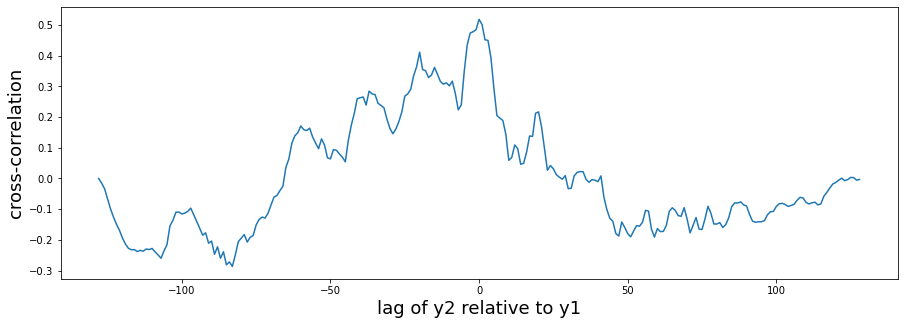

In [14]:
# Finding Correlation and Lag
npts = len(A1_2)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error( y1, y2)
MAE = mean_absolute_error(y1,y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

In [15]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr


X = A1['CO_mega_ppm']
y = A1[' CO_ppm']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,1))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
    

Coefficients:  [4.51722735]
Intercept:  0.8991070280541851
R2  -0.035157072866838224
MAE of simple linear regression of  3.06398539743724
MSE of simple linear regression 18.648934022954847
RMSE of simple linear regression 4.318441156592833
Test data Pearson correlation Random Forest: 0.209
Test data Spearman correlation of simple linear regression: 0.21


In [16]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr


X = A1_1['CO_mega_ppm_shift']
y = A1_1[' CO_ppm']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,1))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
    

Coefficients:  [20.76790166]
Intercept:  -8.384818220563675
R2  0.15521268603316407
MAE of simple linear regression of  2.7475041862093557
MSE of simple linear regression 13.799104424562067
RMSE of simple linear regression 3.71471458184368
Test data Spearman correlation of simple linear regression: 0.271
Test data Pearson correlation Random Forest: 0.397


In [25]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr


X = A1_2['CO_mega_ppm_shift']
y = A1_2[' CO_ppm']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,1))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
    

Coefficients:  [21.9155114]
Intercept:  -8.022072901954992
R2  0.22295998496029457
MAE of simple linear regression of  2.896253137363319
MSE of simple linear regression 12.39329178487961
RMSE of simple linear regression 3.520410740933451
Test data Spearman correlation of simple linear regression: 0.406
Test data Pearson correlation Random Forest: 0.487


Coefficients:  [[21.52237224]]
Intercept:  [-7.6659379]
Polynomial linear regression MAE: 2.7610681069698493
Polynomial linear regression MSE: 12.984179593391577
Polynomial linear regression RMSE: 3.6033567119273076
Polynomial linear regression R-2 score: 0.309
Polynomial linear regression Spearman correlation: 0.502


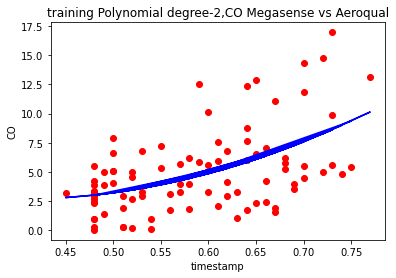

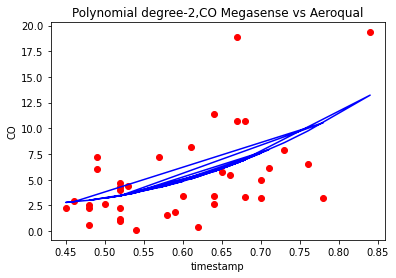

In [32]:
msk = (np.random.rand(len(A1_2)) < 0.7)
train = A1_2[msk]
test = A1_2[~msk]
regr = linear_model.LinearRegression()

train_x = np.asanyarray(train[['CO_mega_ppm_shift']])
train_y = np.asanyarray(train[[' CO_ppm']])
regr.fit (train_x, train_y)
# The coefficients
print ('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)

test_x = np.asanyarray(test[['CO_mega_ppm_shift']])
test_y = np.asanyarray(test[[' CO_ppm']])


from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=2)
X_poly = poly_reg.fit_transform(train_x)
pol_reg = LinearRegression()
pol_reg.fit(X_poly, train_y)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(test_x))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(test_y, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(test_y, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(test_y, pred_y)))



test_score = r2_score(test_y, pred_y)
spearman = spearmanr(test_y, pred_y)
#pearson = pearsonr(test_y, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
#print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

plt.scatter(train_x, train_y, color='red')
plt.plot(train_x, pol_reg.predict(poly_reg.fit_transform(train_x)), color='blue')
plt.title('training Polynomial degree-2,CO Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('CO')
plt.show()
plt.scatter(test_x, test_y, color='red')
plt.plot(test_x, pol_reg.predict(poly_reg.fit_transform(test_x)), color='blue')
plt.title('Polynomial degree-2,CO Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('CO')
plt.show()

Polynomial linear regression MAE: 2.694106408276609
Polynomial linear regression MSE: 12.923966048200379
Polynomial linear regression RMSE: 3.5949918008530117
Polynomial linear regression R-2 score: 0.312
Polynomial linear regression Spearman correlation: 0.502


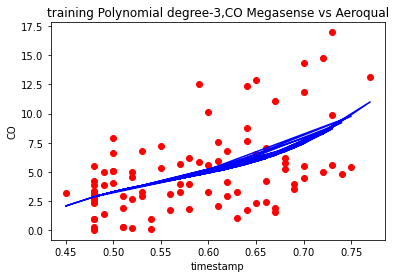

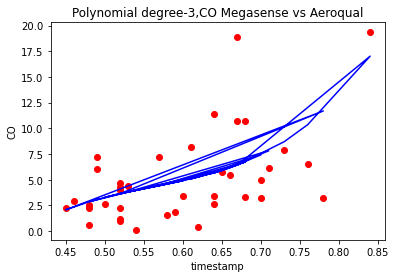

In [33]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=3)
X_poly = poly_reg.fit_transform(train_x)
pol_reg = LinearRegression()
pol_reg.fit(X_poly, train_y)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(test_x))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(test_y, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(test_y, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(test_y, pred_y)))



test_score = r2_score(test_y, pred_y)
spearman = spearmanr(test_y, pred_y)
#pearson = pearsonr(test_y, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
#print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

plt.scatter(train_x, train_y, color='red')
plt.plot(train_x, pol_reg.predict(poly_reg.fit_transform(train_x)), color='blue')
plt.title('training Polynomial degree-3,CO Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('CO')
plt.show()
plt.scatter(test_x, test_y, color='red')
plt.plot(test_x, pol_reg.predict(poly_reg.fit_transform(test_x)), color='blue')
plt.title('Polynomial degree-3,CO Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('CO')
plt.show()

Polynomial linear regression MAE: 2.8016415763742812
Polynomial linear regression MSE: 14.072117135400202
Polynomial linear regression RMSE: 3.75128206556108
Polynomial linear regression R-2 score: 0.251
Polynomial linear regression Spearman correlation: 0.5


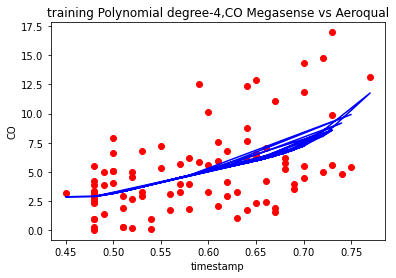

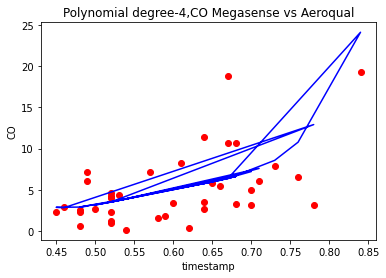

In [37]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=4)
X_poly = poly_reg.fit_transform(train_x)
pol_reg = LinearRegression()
pol_reg.fit(X_poly, train_y)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(test_x))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(test_y, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(test_y, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(test_y, pred_y)))



test_score = r2_score(test_y, pred_y)
spearman = spearmanr(test_y, pred_y)
#pearson = pearsonr(test_y, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
#print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

plt.scatter(train_x, train_y, color='red')
plt.plot(train_x, pol_reg.predict(poly_reg.fit_transform(train_x)), color='blue')
plt.title('training Polynomial degree-4,CO Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('CO')
plt.show()
plt.scatter(test_x, test_y, color='red')
plt.plot(test_x, pol_reg.predict(poly_reg.fit_transform(test_x)), color='blue')
plt.title('Polynomial degree-4,CO Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('CO')
plt.show()

In [18]:
X = A1_2[['CO_mega_ppm_shift', 'Temperature']]
y = A1_2[' CO_ppm']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

Coefficients:  [22.35515637 -0.09617113]
Intercept:  -4.832011838263648
R2  0.23755829864787792
MAE of simple linear regression of  2.8886177013054115
MSE of simple linear regression 12.160458008503014
RMSE of simple linear regression 3.4871848256871925
Test data Spearman correlation of simple linear regression: 0.413
Test data Pearson correlation Random Forest: 0.502


In [19]:
X = A1_2[['CO_mega_ppm_shift', 'Humidity']]
y = A1_2[' CO_ppm']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

Coefficients:  [21.58174763 -0.03520162]
Intercept:  -6.4773127697108706
R2  0.2121190174790868
MAE of simple linear regression of  2.9051531549333443
MSE of simple linear regression 12.566198289853018
RMSE of simple linear regression 3.544883395804863
Test data Spearman correlation of simple linear regression: 0.385
Test data Pearson correlation Random Forest: 0.475


In [20]:
X = A1_2[['CO_mega_ppm_shift', 'Temperature', 'Humidity']]
y = A1_2[' CO_ppm']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,3), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,3))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

Coefficients:  [22.07859557 -0.67970775 -0.3105198 ]
Intercept:  28.150898567998155
R2  0.22720425514603293
MAE of simple linear regression of  2.920796898416192
MSE of simple linear regression 12.325598387103907
RMSE of simple linear regression 3.510783158656186
Test data Spearman correlation of simple linear regression: 0.396
Test data Pearson correlation Random Forest: 0.492


In [21]:
X = A1_2[['CO_mega_ppm_shift', 'NO2_mega_ppm']]
y = A1_2[' CO_ppm']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

Coefficients:  [22.81342577 -0.79142869]
Intercept:  -6.646924227603332
R2  0.22527984309335203
MAE of simple linear regression of  2.9150012047554013
MSE of simple linear regression 12.35629152982706
RMSE of simple linear regression 3.515151707939084
Test data Spearman correlation of simple linear regression: 0.384
Test data Pearson correlation Random Forest: 0.489


In [22]:
X = A1_2[['CO_mega_ppm_shift', 'Temperature', 'NO2_mega_ppm']]
y = A1_2[' CO_ppm']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,3), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,3))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

Coefficients:  [23.11619534 -0.07135755 -0.77076807]
Intercept:  -4.31584517874918
R2  0.23577191249859752
MAE of simple linear regression of  2.9088463974306675
MSE of simple linear regression 12.18894972625241
RMSE of simple linear regression 3.491267638874512
Test data Spearman correlation of simple linear regression: 0.404
Test data Pearson correlation Random Forest: 0.5


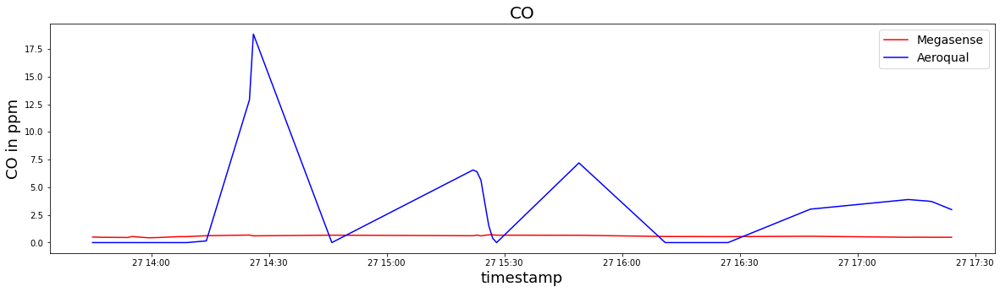

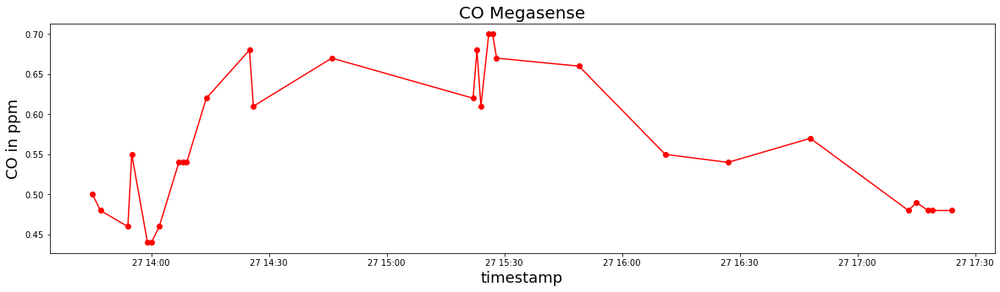

Text(0.5, 1.0, 'CO Aeroqual')

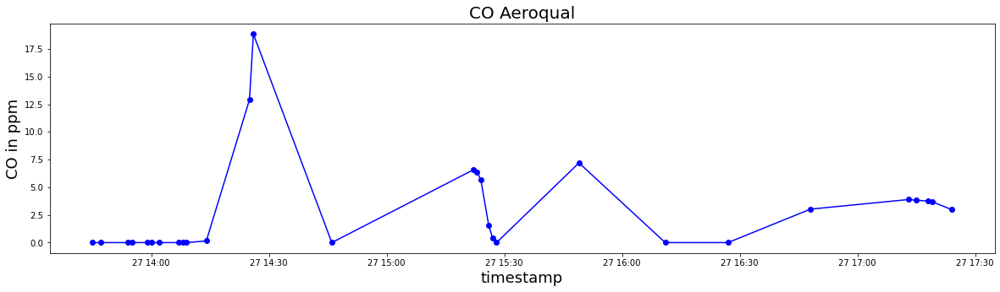

In [14]:
# Comparing the reading between Aeroqual and Device2

x = A2['Date Time']
y1 = A2['CO_mega_ppm']
y2 = A2[' CO_ppm']
fig= plt.figure(figsize=(20,5))
plt.plot(x, y1, '-r') 
plt.plot(x, y2, 'b')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
plt.legend(["Megasense", "Aeroqual"], fontsize=14)
plt.title('CO', fontsize=20)
plt.show()
fig= plt.figure(figsize=(20,5))
# plotting points as a scatter plot
plt.plot(x, y1, '-or')
plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
#plt.legend(["Megasense", "Aeroqual"])
plt.title('CO Megasense', fontsize=20)
plt.show()

fig= plt.figure(figsize=(20,5))
plt.plot(x, y2, '-ob')

plt.xlabel('timestamp', fontsize=18)
plt.ylabel('CO in ppm', fontsize=18)
#plt.legend(["Aeroqual"])
plt.title('CO Aeroqual', fontsize=20)



max correlation is at lag 1
max correlation is  0.402
Pearsons correlation: 0.336
MSE CO:  23.410706896551726
MAE CO:  2.7886206896551724
RMSE CO:  4.838461211640714


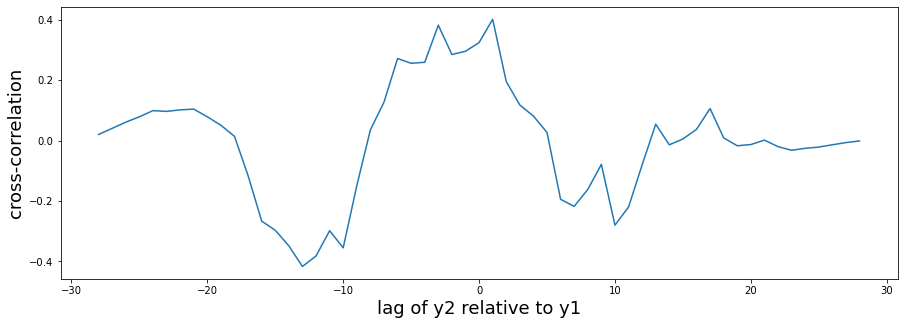

In [15]:
# Finding Correlation and Lag
npts = len(A2)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error( y1, y2)
MAE = mean_absolute_error(y1,y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

In [17]:
A2['CO_mega_ppm_shift'] = A2['CO_mega_ppm'].shift(-15)
# Comparing the reading between Aeroqual and Device1
A2_1 = A2.dropna()
print(len(A2_1))
A2_2 = A2_1[A2_1[' CO_ppm'] != 0]
print(len(A2_2))
x = A2_2['Date Time']
y1 = A2_2['CO_mega_ppm_shift']
y2 = A2_2[' CO_ppm']

14
3


In [18]:
import os 
import folium
from folium import plugins

In [14]:
m = folium.Map(location = [17.4449, 78.3498], zoom_start=13.5)
locations = A1[['Latitude', 'Longitude']]
locationlist = locations.values.tolist()

for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point]).add_to(m)
m

In [18]:
len(D2.dropna())

30

In [19]:
len(d2)

40

# Spec CO 

In [1]:
# Importing Libraries

from datetime import datetime
from pytz import timezone
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
from sklearn.metrics import r2_score
from sklearn import linear_model
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import time

In [7]:
df = pd.read_csv("C:\\Users\\spand\\OneDrive\\Desktop\\MS_Thesis\\Raw_data\\spec_co_1.csv")
aero= pd.read_csv("C:\\Users\\spand\\OneDrive\\Desktop\\MS_Thesis\\Aeroqual_data\\aeroqual(17aug).csv")

In [8]:
print(df.head())
print(aero.head())

                created_at  entry_id field1  latitude  longitude  elevation  \
0  2021-08-11 14:16:01 IST         1      5       NaN        NaN        NaN   
1  2021-08-11 14:16:15 IST         2      5       NaN        NaN        NaN   
2  2021-08-11 14:16:17 IST         3      6       NaN        NaN        NaN   
3  2021-08-11 14:16:20 IST         4      6       NaN        NaN        NaN   
4  2021-08-11 14:16:23 IST         5      5       NaN        NaN        NaN   

   status  
0     NaN  
1     NaN  
2     NaN  
3     NaN  
4     NaN  
           Date Time   Monitor ID   Location ID   CO(ppm)
0  11 Aug 2021 16:31            1             1     23.37
1  11 Aug 2021 16:32            1             1     23.20
2  11 Aug 2021 16:33            1             1     22.94
3  11 Aug 2021 16:34            1             1     22.76
4  11 Aug 2021 16:35            1             1     22.62


In [10]:
df = df.drop(['entry_id', 'latitude', 'longitude', 'elevation', 'status'], axis = 1)
df = df.rename(columns = {'created_at': 'Date Time', 'field1': 'Spec_CO_ppm'})
df.head()


,Date Time,Spec_CO_ppm
0,2021-08-11 14:16:01 IST,5
1,2021-08-11 14:16:15 IST,5
2,2021-08-11 14:16:17 IST,6
3,2021-08-11 14:16:20 IST,6
4,2021-08-11 14:16:23 IST,5


In [15]:
df['Spec_CO_ppm'] = df['Spec_CO_ppm'].astype(float)

ValueError: could not convert string to float: '[30, 32, 21]'

In [12]:
df['Date Time'] = pd.to_datetime(df['Date Time'], yearfirst = True)
df.set_index("Date Time", inplace=True)
DF = df.resample("10S").mean().round(2)


DataError: No numeric types to aggregate

# Mobile Readings

In [6]:
# Importing Libraries

from datetime import datetime
from pytz import timezone
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
from sklearn.metrics import r2_score
from sklearn import linear_model
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import time

In [14]:
df = pd.read_csv('Mobile_CO_gases.csv', parse_dates= ['created_at'])

In [16]:
df

,Unnamed: 0,created_at,Monitor ID,Location ID,CO(ppm),NO2,O3,CO,SO2,Temperature,RH,Pressure
0,0,2021-10-22 14:16:00,1,1,0.00,17.778,-0.889,8.667,22.222,29.583,47.586,943.805
1,1,2021-10-22 14:17:00,1,1,0.00,0.000,0.000,8.227,22.045,29.580,47.361,943.779
2,32,2021-10-22 14:48:00,1,1,0.00,0.000,0.000,8.556,25.111,30.374,39.396,944.097
3,33,2021-10-22 14:49:00,1,1,0.00,0.000,0.000,8.368,25.316,30.433,39.678,944.091
4,34,2021-10-22 14:50:00,1,1,0.29,0.000,0.000,8.474,26.316,30.556,40.103,944.273
...,...,...,...,...,...,...,...,...,...,...,...,...
208,238,2021-10-22 18:14:00,1,1,1.15,0.000,0.000,22.278,47.833,29.419,43.674,945.486
209,239,2021-10-22 18:15:00,1,1,1.00,0.000,0.000,15.579,39.632,29.389,44.068,945.408
210,240,2021-10-22 18:16:00,1,1,0.60,0.000,0.000,12.211,36.632,29.152,45.717,945.273
211,241,2021-10-22 18:17:00,1,1,0.48,0.000,0.000,10.737,36.895,29.043,46.402,945.300


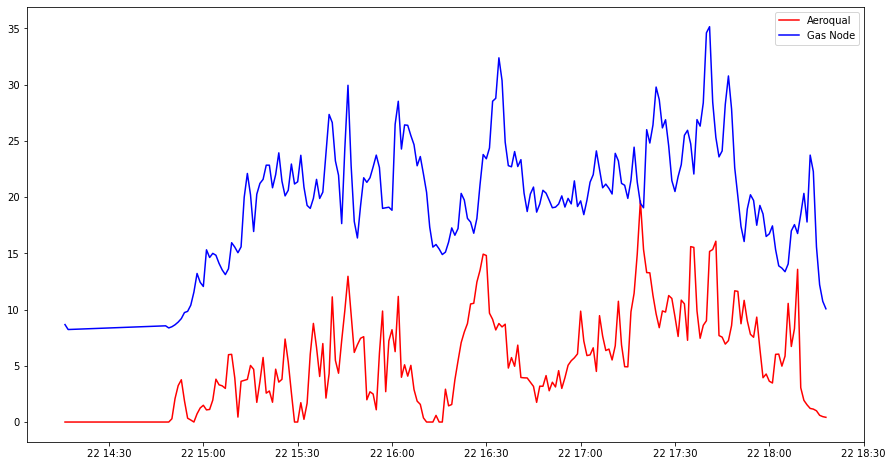

In [31]:
x = df['created_at']
y1 = df[' CO(ppm)']
y2 = df['CO']

plt.figure(figsize = (15, 8))
plt.plot(x, y1,'r', label = 'Aeroqual')
#plt.show()
plt.plot(x, y2, 'b', label = 'Gas Node')
plt.legend()
plt.show()

max correlation is at lag 5
max correlation is  0.687
Pearsons correlation: 0.490
MSE CO:  228.17131822065727
MAE CO:  14.361516431924883
RMSE CO:  15.105340718456413


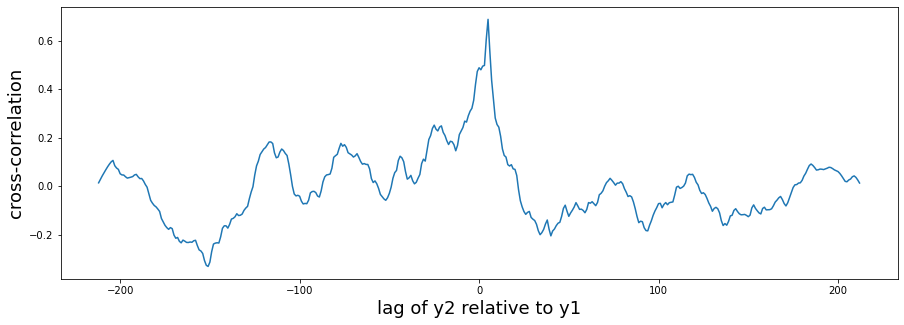

In [32]:
npts = len(df)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error( y1, y2)
MAE = mean_absolute_error(y1,y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

In [2]:
df1 = pd.read_csv('Mobile_CO_gases_1.csv', parse_dates= ['created_at'])

In [3]:
df1['CO'] = df1['CO'].shift(-4)

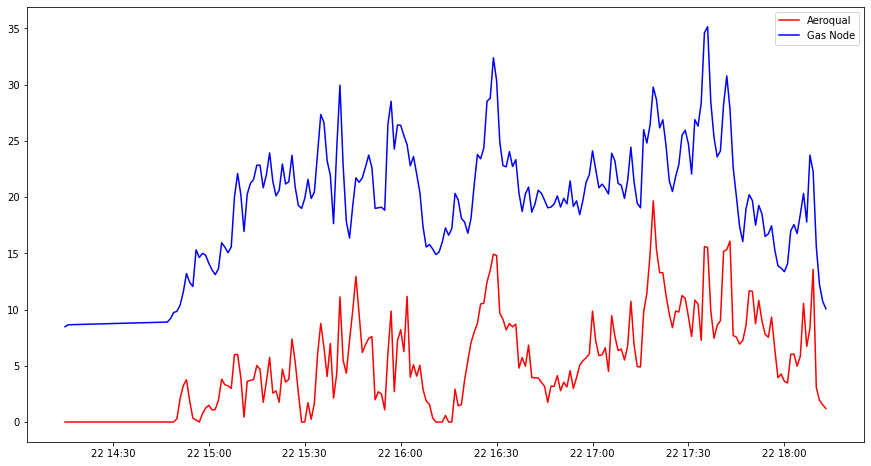

In [4]:

df1 = df1.dropna()
x = df1['created_at']
y1 = df1[' CO(ppm)']
y2 = df1['CO']

plt.figure(figsize = (15, 8))
plt.plot(x, y1,'r', label = 'Aeroqual')
#plt.show()
plt.plot(x, y2, 'b', label = 'Gas Node')
plt.legend()
plt.show()

max correlation is at lag 0
max correlation is  0.751
Pearsons correlation: 0.755
MSE CO:  220.16889274162676
MAE CO:  14.489870813397129
RMSE CO:  14.83808925507684


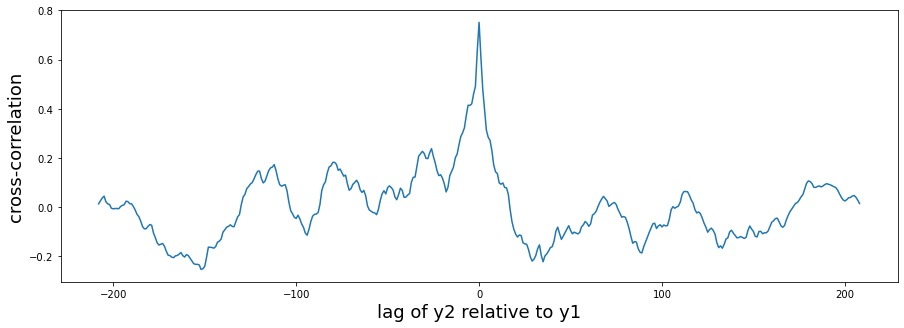

In [7]:

npts = len(df1)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error( y1, y2)
MAE = mean_absolute_error(y1,y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

Coefficients:  [0.62599546]
Intercept:  -6.840133701434338
R2  0.5518168571299744
MAE of simple linear regression of  2.322870258020004
MSE of simple linear regression 8.356508600441968
RMSE of simple linear regression 2.890762633016064
Test data Pearson correlation Random Forest: 0.743
Test data Spearman correlation of simple linear regression: 0.712


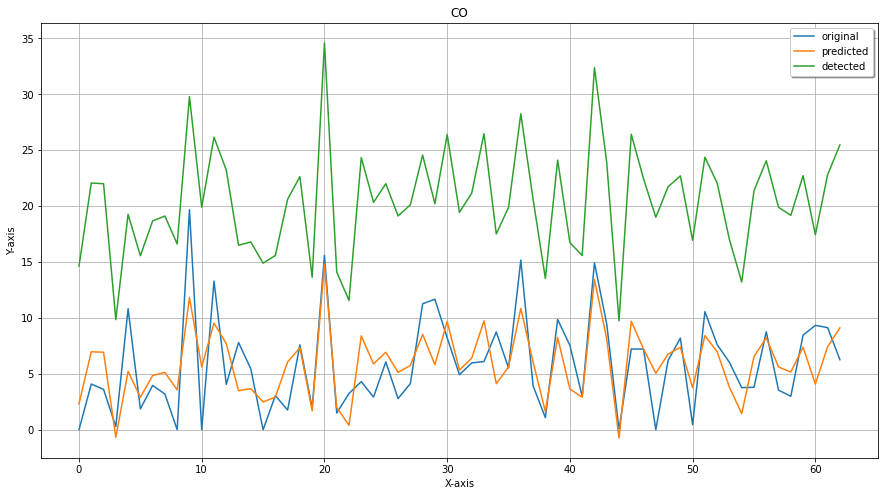

In [9]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr



X = df1['CO']
y = df1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,1))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
    

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()
    

In [10]:
from sklearn.linear_model import SGDRegressor
X = df1['CO']
y = df1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)


Coefficients:  [0.62599546]
Intercept:  -6.840133701434338
R2  0.5518168571299744
MAE of simple linear regression of  2.322870258020004
MSE of simple linear regression 8.356508600441968
RMSE of simple linear regression 2.890762633016064
Test data Pearson correlation Random Forest: 0.743
Test data Spearman correlation of simple linear regression: 0.712


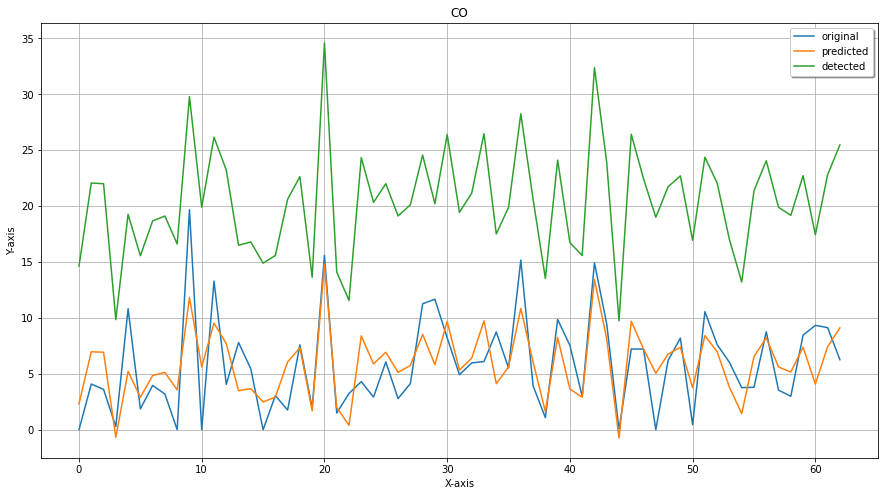

In [12]:
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,1))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
    

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()
    

Coefficients:  [0.35978758]
Intercept:  [-1.1987936]
R-squared: 0.471876996430342
MSE:  10.472612746110435
RMSE:  3.2361416449392997


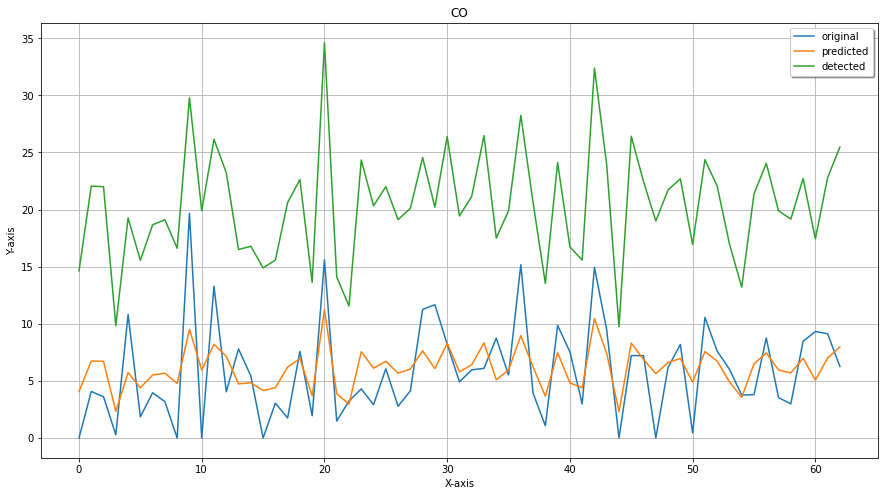

In [13]:
sgdr = SGDRegressor(loss ='epsilon_insensitive' ,learning_rate= 'adaptive', max_iter = 10000)
sgdr.fit(X_train.values.reshape(-1,1), y_train)
print ('Coefficients: ', sgdr.coef_)
print ('Intercept: ',sgdr.intercept_)
score = sgdr.score(X_train.values.reshape(-1,1), y_train)
print("R-squared:", score)

# cv_score = cross_val_score(lsvr, x, y, cv=5)
# print("CV mean score: ", cv_score.mean())

y_pred = sgdr.predict(X_test.values.reshape(-1,1))

mse = mean_squared_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, y_pred, label="predicted")
plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Coefficients:  [0.62599546]
Intercept:  -6.840133701434338
R-squared: 0.4284101819888658
MSE:  11.250165154957859
RMSE:  3.354126586006834


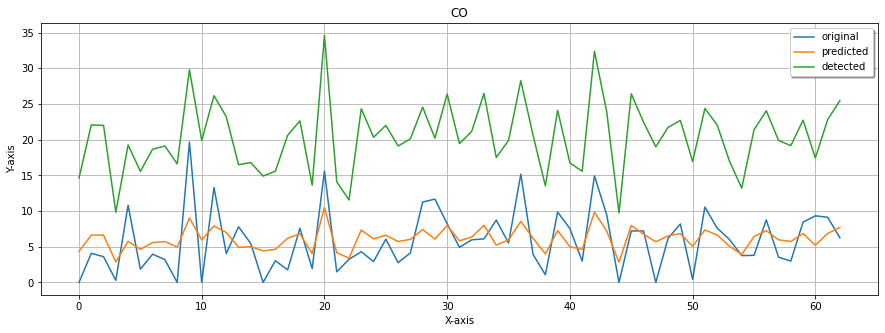

In [14]:
sgdr = SGDRegressor(loss ='huber' ,learning_rate= 'adaptive', max_iter = 1000)
sgdr.fit(X_train.values.reshape(-1,1), y_train)
print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
score = sgdr.score(X_train.values.reshape(-1,1), y_train)
print("R-squared:", score)

# cv_score = cross_val_score(lsvr, x, y, cv=5)
# print("CV mean score: ", cv_score.mean())

y_pred = sgdr.predict(X_test.values.reshape(-1,1))

mse = mean_squared_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))

x_ax = range(len(y_test))
plt.figure(figsize= (15, 5))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, y_pred, label="predicted")
plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Coefficients:  [0.62599546]
Intercept:  -6.840133701434338
R-squared: 0.4361732928526465
MSE:  11.111402777186806
RMSE:  3.333377082957583


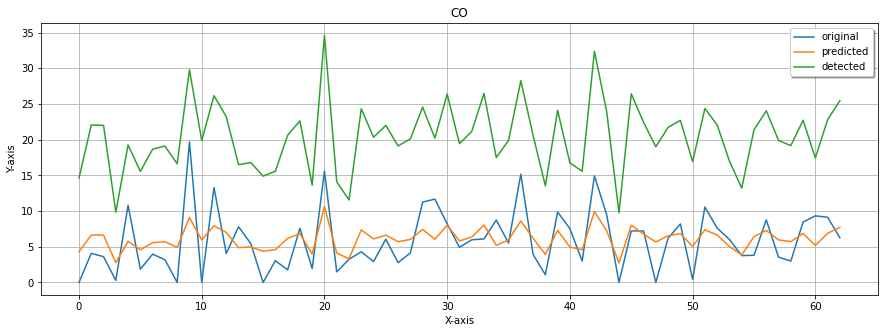

In [15]:
sgdr = SGDRegressor(loss ='huber' ,learning_rate= 'adaptive', max_iter = 5000)
sgdr.fit(X_train.values.reshape(-1,1), y_train)
print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
score = sgdr.score(X_train.values.reshape(-1,1), y_train)
print("R-squared:", score)

# cv_score = cross_val_score(lsvr, x, y, cv=5)
# print("CV mean score: ", cv_score.mean())

y_pred = sgdr.predict(X_test.values.reshape(-1,1))

mse = mean_squared_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))

x_ax = range(len(y_test))
plt.figure(figsize= (15, 5))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, y_pred, label="predicted")
plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [3]:
df1 = pd.read_csv('Device76&Aeroqual.csv', parse_dates= ['Date Time'])


In [4]:
df1

,Unnamed: 0,Date Time,Monitor ID,Location ID,CO(ppm),Unnamed: 0.1,data.temp_c,data.hum_prcnt,data.press_hpa,data.eq_db,...,data.leds_on,data.code_version,data.gps_avg_snr,data.cell_strength_dbm,data.wifi_strength_dbm,data.wifi_strength_asl,data.location.lat,data.location.lon,data.location.acc,data.timestamp
0,10,2021-10-22 14:20:00,1,1,0.00,10204.0,28.830,43.221,943.257,49.045,...,1.0,1.0,20.400,-106.0,-58.0,3.0,17.446,78.350,4.70,1.634893e+12
1,11,2021-10-22 14:21:00,1,1,0.00,10205.5,29.040,42.884,943.264,47.472,...,1.0,1.0,18.907,-108.0,-56.5,3.0,17.446,78.350,4.85,1.634893e+12
2,12,2021-10-22 14:22:00,1,1,0.00,10207.5,29.345,42.485,943.252,53.536,...,1.0,1.0,20.235,-104.5,-57.0,3.0,17.446,78.350,5.25,1.634893e+12
3,13,2021-10-22 14:23:00,1,1,0.00,10209.5,29.640,42.017,943.191,63.833,...,1.0,1.0,19.943,-104.5,-57.0,3.0,17.446,78.350,4.60,1.634893e+12
4,14,2021-10-22 14:24:00,1,1,0.00,10211.5,30.050,41.346,943.200,65.623,...,1.0,1.0,20.484,-105.5,-57.0,3.0,17.446,78.350,4.90,1.634893e+12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,242,2021-10-22 18:12:00,1,1,1.53,10560.5,31.525,34.664,944.842,71.928,...,1.0,1.0,18.931,-88.0,-65.5,2.5,17.445,78.353,5.35,1.634906e+12
192,243,2021-10-22 18:13:00,1,1,1.21,10562.5,31.785,35.903,944.891,70.549,...,1.0,1.0,20.581,-90.5,-61.0,3.0,17.445,78.353,3.35,1.634907e+12
193,244,2021-10-22 18:14:00,1,1,1.15,10564.5,32.025,34.818,944.922,73.049,...,1.0,1.0,20.563,-97.0,-61.0,3.0,17.446,78.351,4.15,1.634907e+12
194,245,2021-10-22 18:15:00,1,1,1.00,10566.5,32.255,35.080,944.878,62.133,...,1.0,1.0,17.578,-94.0,-61.0,3.0,17.446,78.351,3.15,1.634907e+12


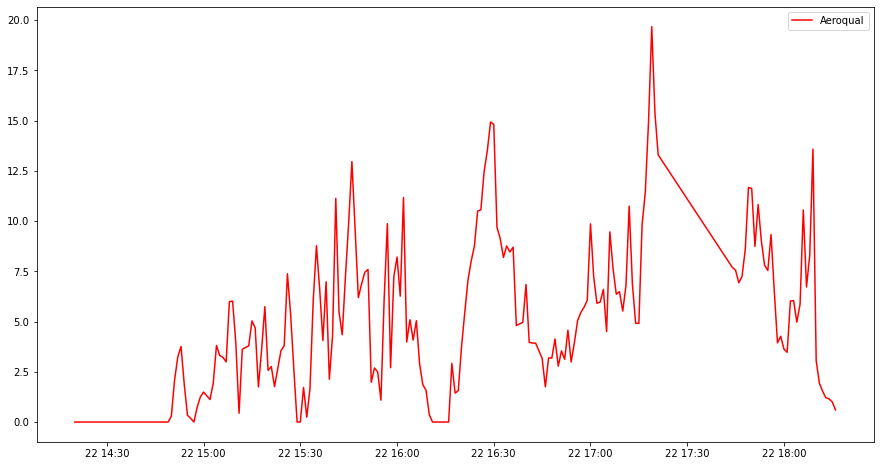

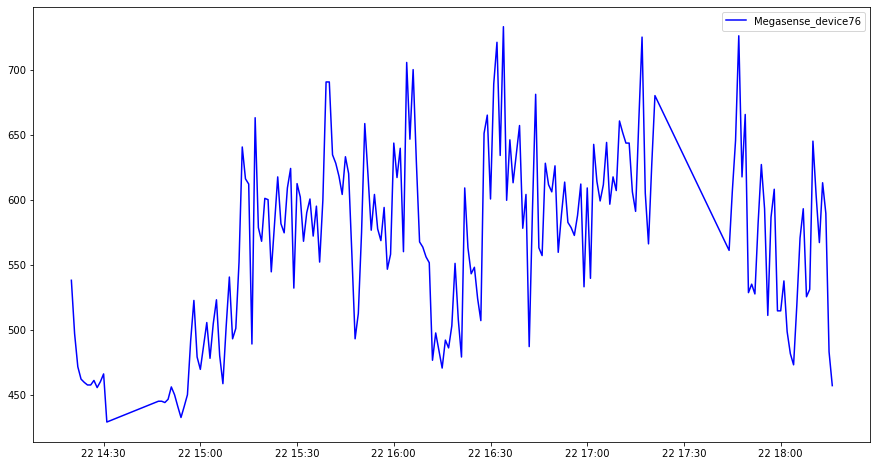

In [5]:
df1 = df1.dropna()
x = df1['Date Time']
y1 = df1[' CO(ppm)']
y2 = df1['data.co_ppm']

plt.figure(figsize = (15, 8))
plt.plot(x, y1,'r', label = 'Aeroqual')
plt.legend()
plt.show()
plt.figure(figsize = (15, 8))
plt.plot(x, y2, 'b', label = 'Megasense_device76')
plt.legend()
plt.show()

max correlation is at lag 5
max correlation is  0.6
Pearsons correlation: 0.468
MSE CO:  321704.34574677044
MAE CO:  563.0705765306122
RMSE CO:  567.1898674577768


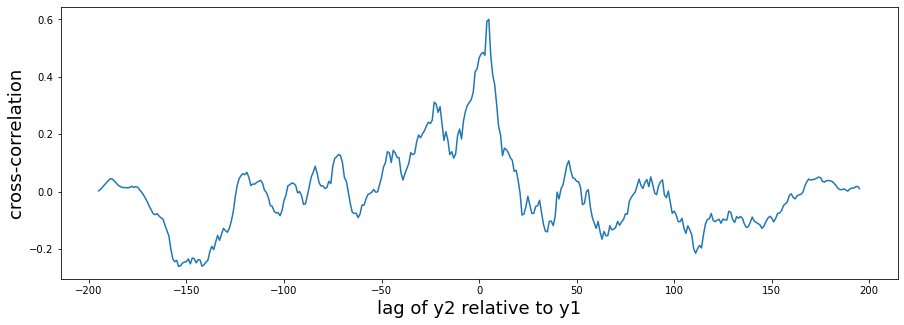

In [6]:
npts = len(df1)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error( y1, y2)
MAE = mean_absolute_error(y1,y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

In [7]:
df1['data.co_ppm'] = df1['data.co_ppm'].shift(-5)

Coefficients:  [0.03438279]
Intercept:  -14.625848114374092
R2  0.3625062191426194
MAE of simple linear regression of  2.471804223930044
MSE of simple linear regression 10.516864220805413
RMSE of simple linear regression 3.2429715109456962
Test data Pearson correlation Random Forest: 0.616
Test data Spearman correlation of simple linear regression: 0.603


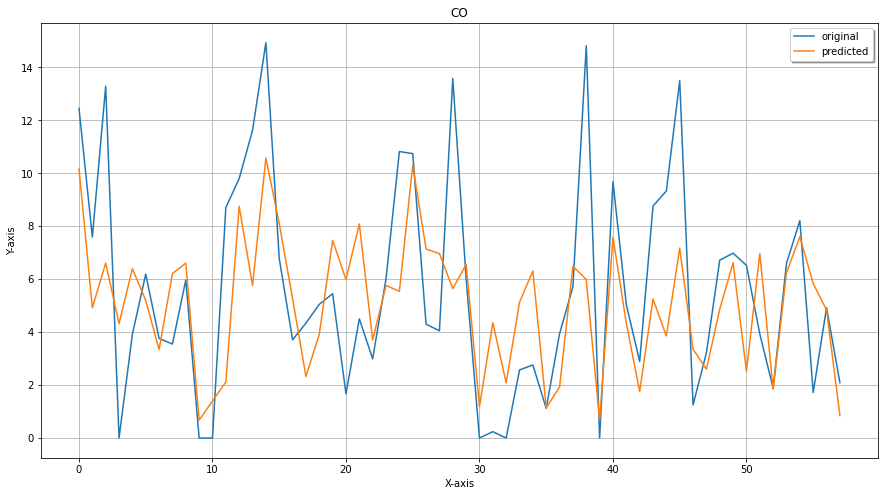

In [9]:
df1 = df1.dropna()
X = df1['data.co_ppm']
y = df1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,1))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
    

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()
    

Coefficients:  [ 0.03683198 -0.32329288]
Intercept:  -5.233736638119417
R2  0.4199506067154172
MAE of simple linear regression of  2.4358879830295717
MSE of simple linear regression 9.569192506207788
RMSE of simple linear regression 3.0934111440621317
Test data Pearson correlation Random Forest: 0.66
Test data Spearman correlation of simple linear regression: 0.645


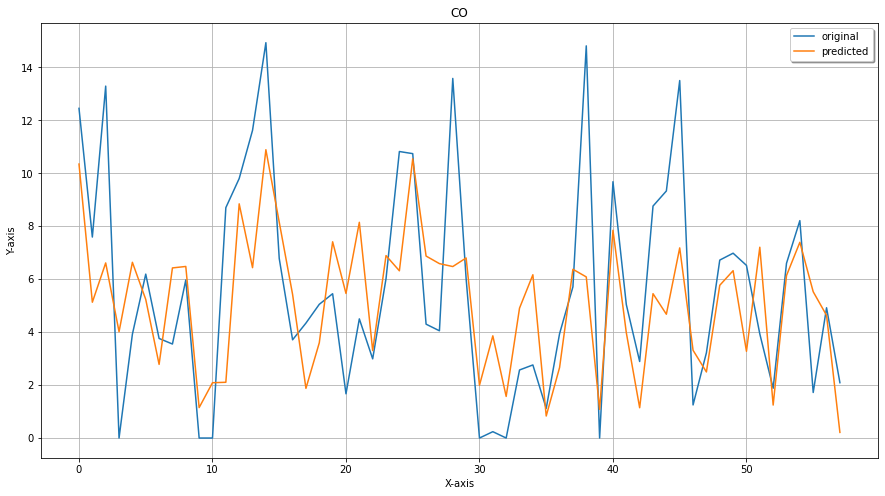

In [12]:
df1 = df1.dropna()
X = df1[['data.co_ppm', 'data.temp_c']]
y = df1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
    

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()
    

Coefficients:  [0.03758103 0.15026177]
Intercept:  -20.97605252776424
R2  0.4056137120361064
MAE of simple linear regression of  2.4832560974048796
MSE of simple linear regression 9.805711166025162
RMSE of simple linear regression 3.1314072181728716
Test data Pearson correlation Random Forest: 0.648
Test data Spearman correlation of simple linear regression: 0.626


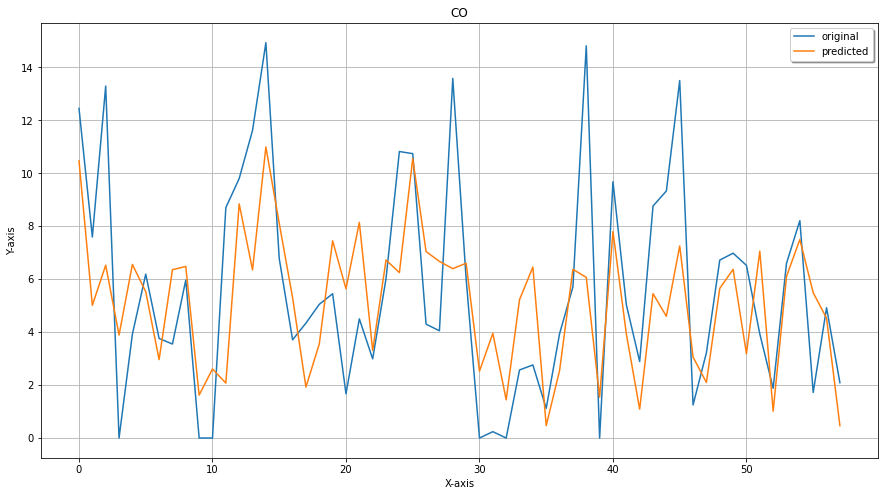

In [13]:
df1 = df1.dropna()
X = df1[['data.co_ppm', 'data.hum_prcnt']]
y = df1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
    

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()
    

Coefficients:  [ 0.03734764 -0.09568888]
Intercept:  74.56011081454923
R2  0.37100819535455487
MAE of simple linear regression of  2.4804023123010492
MSE of simple linear regression 10.376605394579393
RMSE of simple linear regression 3.22127387761106
Test data Pearson correlation Random Forest: 0.623
Test data Spearman correlation of simple linear regression: 0.61


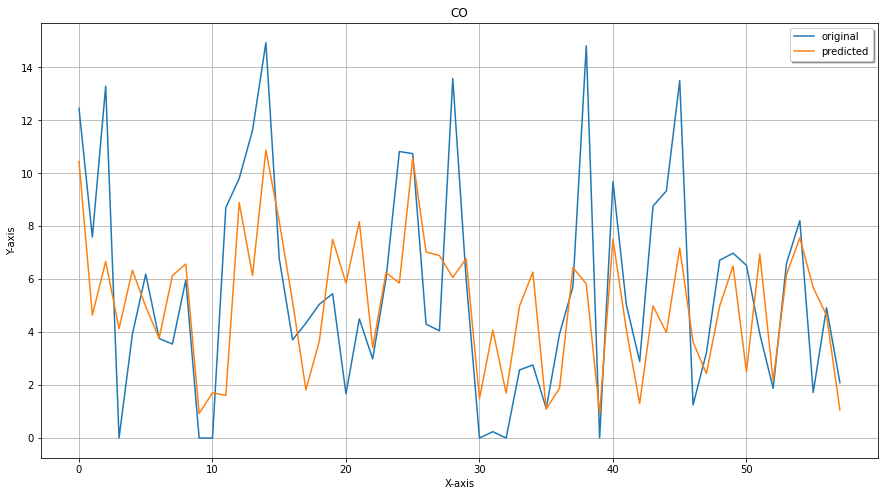

In [15]:

df1 = df1.dropna()
X = df1[['data.co_ppm', 'data.press_hpa']]
y = df1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
    

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()
    

Coefficients:  [ 0.03750566 -0.07159037  0.1212394 ]
Intercept:  -17.66973944186403
R2  0.40999926899611827
MAE of simple linear regression of  2.4733597106182734
MSE of simple linear regression 9.733361743229192
RMSE of simple linear regression 3.1198336082600933
Test data Pearson correlation Random Forest: 0.651
Test data Spearman correlation of simple linear regression: 0.631


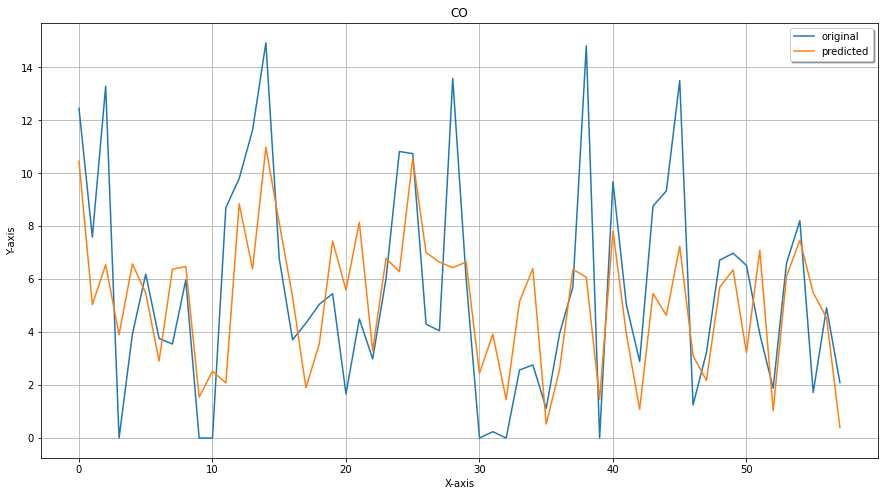

In [14]:
df1 = df1.dropna()
X = df1[['data.co_ppm', 'data.temp_c','data.hum_prcnt']]
y = df1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,3), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,3))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,3), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
    

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()
    

In [137]:
df1 = pd.read_csv('DeviceC5&Aeroqual.csv', parse_dates= ['Date Time'])

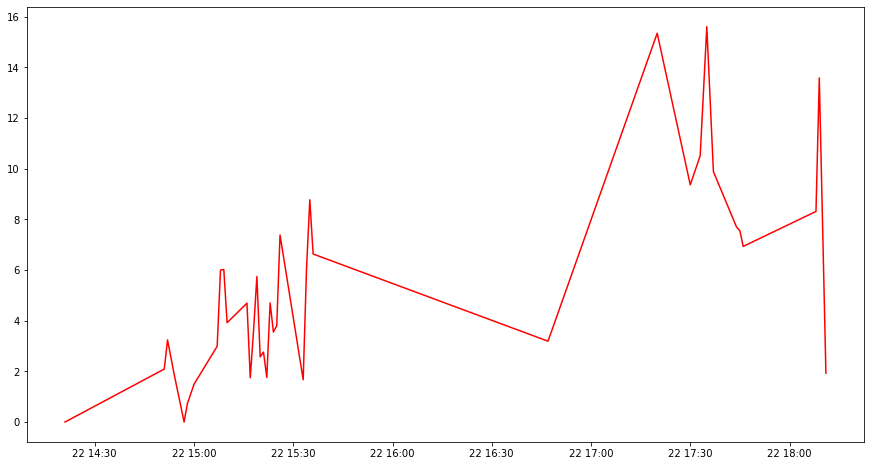

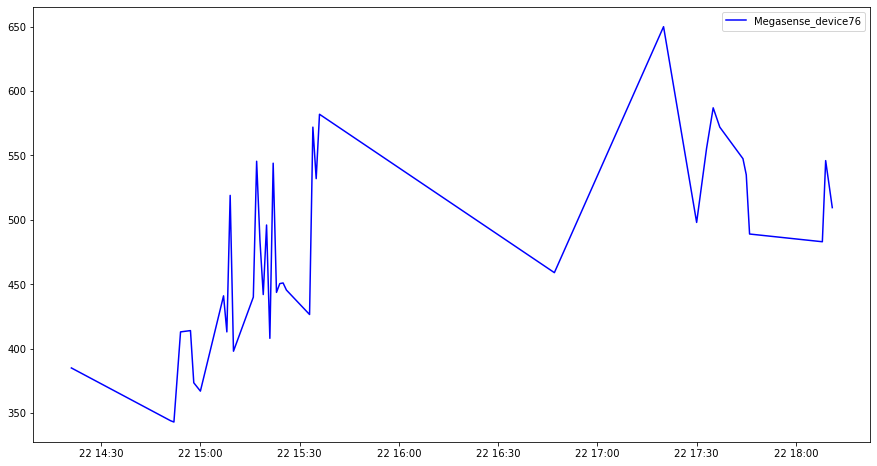

In [142]:
df1 = df1.dropna()
x = df1['Date Time']
y1 = df1[' CO(ppm)']
y2 = df1['data.co_ppm']

plt.figure(figsize = (15, 8))
plt.plot(x, y1,'r', label = 'Aeroqual')
plt.show()
plt.figure(figsize = (15, 8))
plt.plot(x, y2, 'b', label = 'Megasense_device76')
plt.legend()
plt.show()

max correlation is at lag 0
max correlation is  0.683
Pearsons correlation: 0.702
MSE CO:  226966.22259971054
MAE CO:  471.0799210526315
RMSE CO:  476.4097213530708


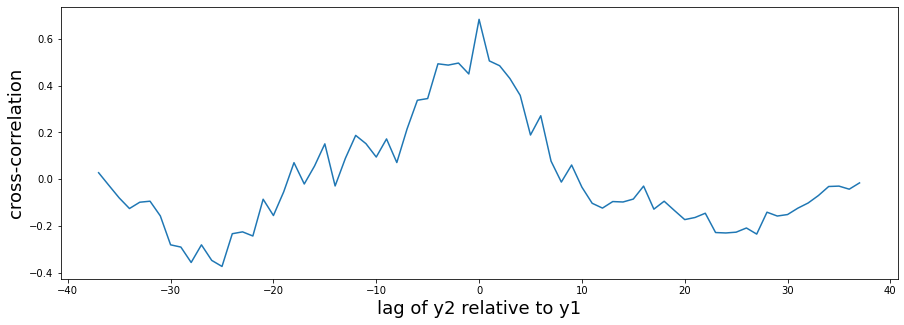

In [143]:
npts = len(df1)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error( y1, y2)
MAE = mean_absolute_error(y1,y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

In [140]:
df1['data.co_ppm'] = df1['data.co_ppm'].shift(-1)

Coefficients:  [0.04057562]
Intercept:  -13.903330934089032
R2  0.5105445127748733
MAE of simple linear regression of  1.5870099218878744
MSE of simple linear regression 3.8506887359508686
RMSE of simple linear regression 1.9623171853578791
Test data Pearson correlation Random Forest: 0.772
Test data Spearman correlation of simple linear regression: 0.587


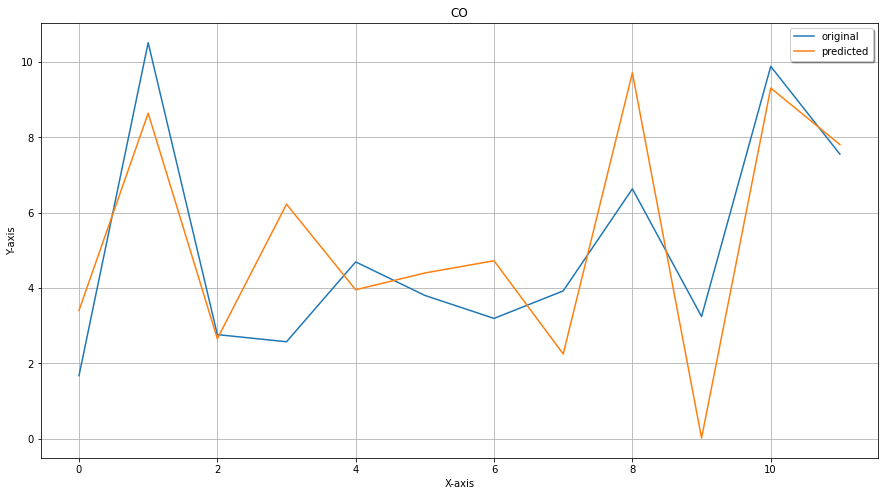

In [144]:

X = df1['data.co_ppm']
y = df1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,1))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
    

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()
    

In [17]:
df = pd.read_csv('Mobile_SO2_gases_23oct.csv', parse_dates= ['created_at'])

In [18]:
df

,Unnamed: 0,created_at,Monitor ID,Location ID,SO2(ppm),NO2,O3,CO,SO2,Temperature,RH,Pressure
0,0,2021-10-23 11:44:00,1,1,0.0,0.0,0.0,8.333,21.333,29.877,38.093,946.564
1,1,2021-10-23 11:45:00,1,1,0.1,0.0,0.0,8.556,21.611,29.969,38.092,946.585
2,2,2021-10-23 11:46:00,1,1,0.0,0.0,0.0,8.611,21.889,30.056,38.082,946.563
3,3,2021-10-23 11:47:00,1,1,0.0,0.0,0.0,8.474,21.947,30.150,38.417,946.540
4,4,2021-10-23 11:48:00,1,1,0.0,0.0,0.0,8.700,22.100,30.254,38.267,946.507
...,...,...,...,...,...,...,...,...,...,...,...,...
278,281,2021-10-23 16:25:00,1,1,0.0,0.0,0.0,8.667,40.500,32.722,34.142,944.158
279,282,2021-10-23 16:26:00,1,1,0.1,0.0,0.0,8.947,40.263,32.738,34.234,943.969
280,283,2021-10-23 16:27:00,1,1,0.1,0.0,0.0,9.611,46.500,32.787,35.075,943.928
281,284,2021-10-23 16:28:00,1,1,0.1,0.0,0.0,9.211,42.158,32.787,35.482,943.992


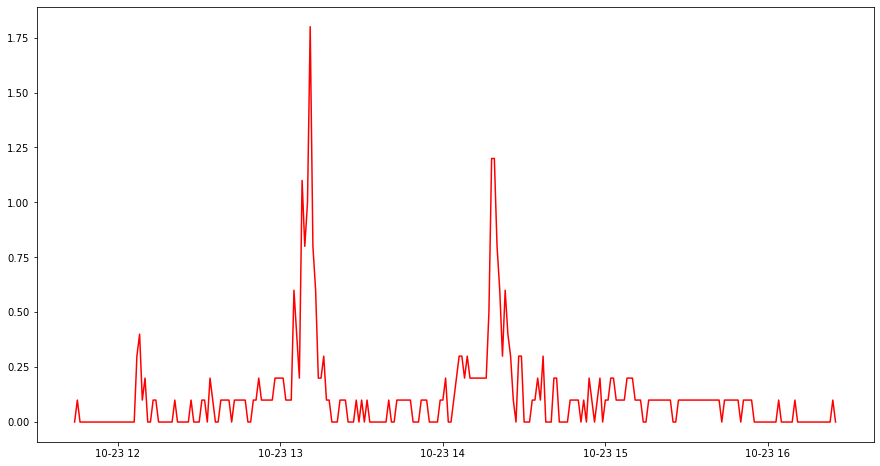

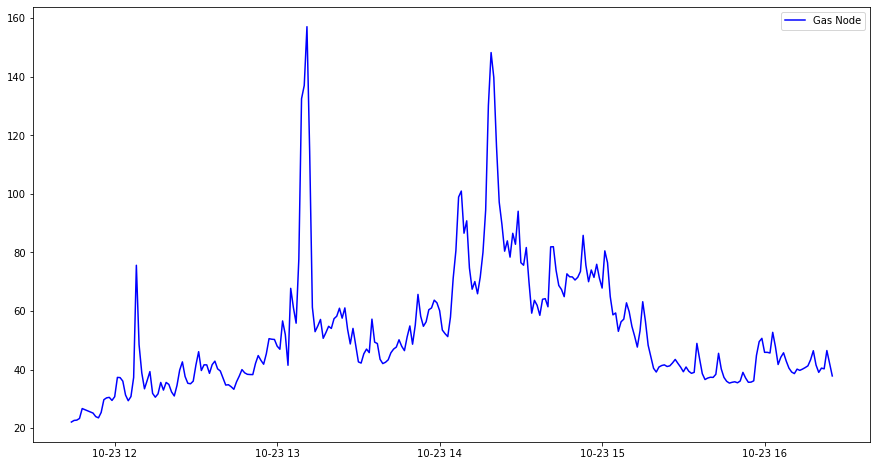

In [23]:
df = df.dropna()
x = df['created_at']
y1 = df[' SO2(ppm)']
y2 = df['SO2']

plt.figure(figsize = (15, 8))
plt.plot(x, y1,'r', label = 'Aeroqual')
plt.show()
plt.figure(figsize = (15, 8))
plt.plot(x, y2, 'b', label = 'Gas Node')
plt.legend()
plt.show()

In [24]:
df[' SO2(ppm)'].max()

1.8

max correlation is at lag 0
max correlation is  0.725
Pearsons correlation: 0.728
MSE SO2:  3224.3087804587813
MAE SO2:  52.65768458781361
RMSE SO2:  56.78299728315494


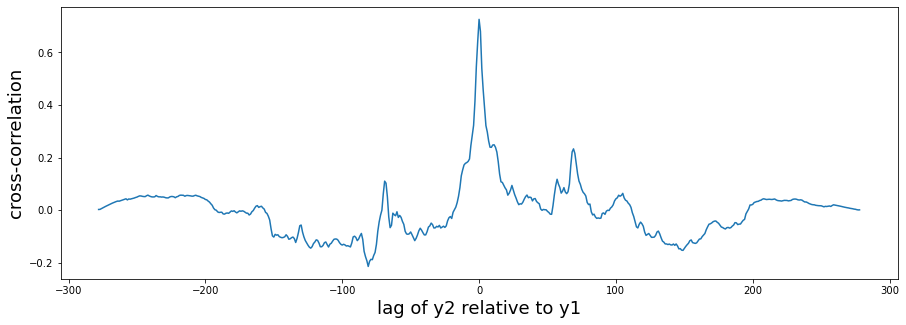

In [25]:
import numpy as np
from scipy.stats import pearsonr
from sklearn.metrics import r2_score
from sklearn import linear_model
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

npts = len(df)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error( y1, y2)
MAE = mean_absolute_error(y1,y2)
print("MSE SO2: ", MSE)
print("MAE SO2: ", MAE)
print("RMSE SO2: ", np.sqrt(mean_squared_error(y1, y2)))

In [22]:
df['SO2'] = df['SO2'].shift(-4)

Coefficients:  [0.00743708]
Intercept:  -0.2765262352442085
R2  0.3839191522489057
MAE of simple linear regression of  0.0959461744218354
MSE of simple linear regression 0.019972859116080332
RMSE of simple linear regression 0.14132536614521943
Test data Pearson correlation linear regression: 0.647
Test data Spearman correlation of simple linear regression: 0.372


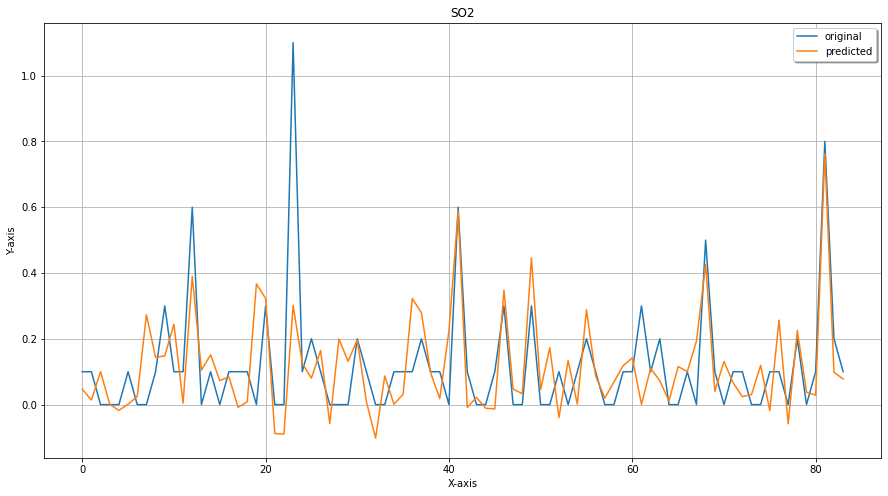

In [26]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr


X = df['SO2']
y = df[' SO2(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,1))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation linear regression: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
    

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax,test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("SO2")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()
    

# Megasense

In [16]:
df1 = pd.read_csv('Device61&Aeroqual_23oct.csv', parse_dates= ['Date Time'])
df2 = pd.read_csv('Device76&Aeroqual_23oct.csv', parse_dates= ['Date Time'])
df3 = pd.read_csv('DeviceC5&Aeroqual_23oct.csv', parse_dates= ['Date Time'])

In [12]:
list(df1)

['Unnamed: 0',
 'Date Time',
 ' Monitor ID',
 ' Location ID',
 ' SO2(ppm)',
 'data.temp_c',
 'data.hum_prcnt',
 'data.press_hpa',
 'data.co_ppm',
 'data.no2_ppb',
 'data.co_mv',
 'data.no2_mv',
 'data.ozone_ppm',
 'data.ozone_volt_mv',
 'data.tvoc_ppb',
 'data.batt_prcnt',
 'data.location.lat',
 'data.location.lon',
 'data.location.acc',
 'data.timestamp']

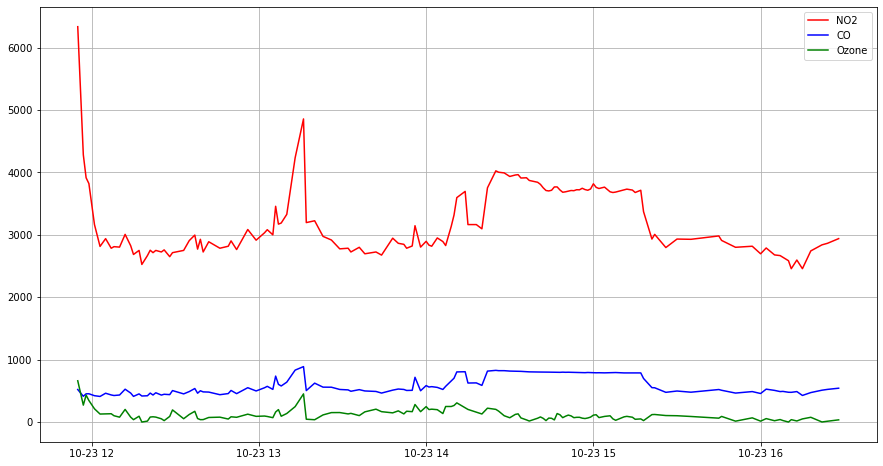

In [27]:
df1 = df1.dropna()
x = df1['Date Time']
y1 = df1['data.no2_ppb']
y2 = df1['data.co_ppm']
y3 = df1['data.ozone_ppm']
plt.figure(figsize = (15, 8))
plt.plot(x, y1,'r', label = 'NO2')
#plt.show()
#plt.figure(figsize = (15, 8))
plt.plot(x, y2, 'b', label = 'CO')
plt.plot(x, y3, 'g', label = 'Ozone')

plt.grid(True)
plt.legend()
plt.show()

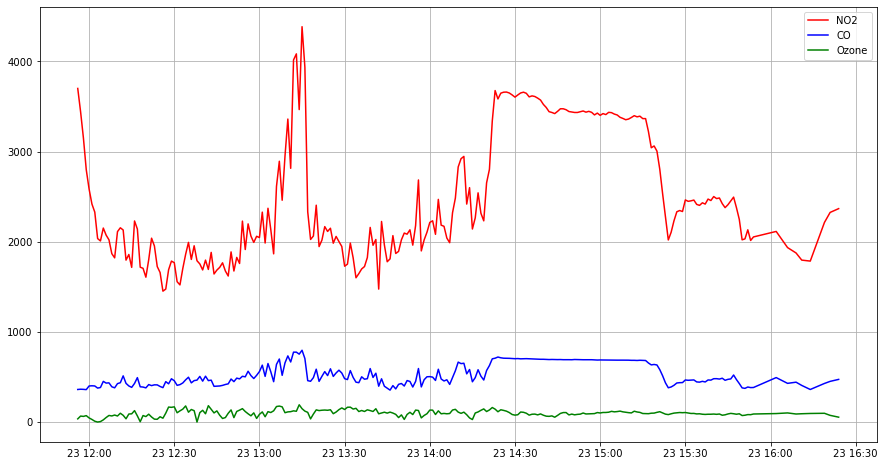

In [28]:
#df1 = df1.dropna()
x = df2['Date Time']
y1 = df2['data.no2_ppb']
y2 = df2['data.co_ppm']
y3 = df2['data.ozone_ppm']
plt.figure(figsize = (15, 8))
plt.plot(x, y1,'r', label = 'NO2')
#plt.show()
#plt.figure(figsize = (15, 8))
plt.plot(x, y2, 'b', label = 'CO')
plt.plot(x, y3, 'g', label = 'Ozone')
plt.grid(True)


plt.legend()
plt.show()

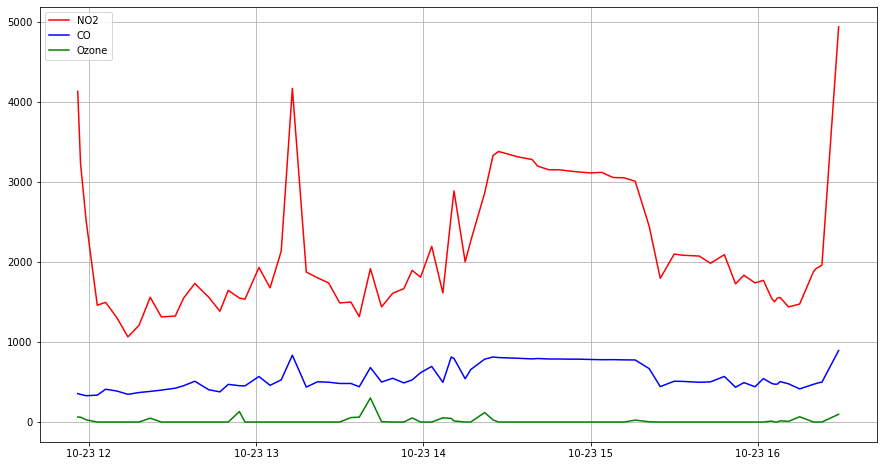

In [29]:
x = df3['Date Time']
y1 = df3['data.no2_ppb']
y2 = df3['data.co_ppm']
y3 = df3['data.ozone_ppm']
plt.figure(figsize = (15, 8))
plt.plot(x, y1,'r', label = 'NO2')
#plt.show()
#plt.figure(figsize = (15, 8))
plt.plot(x, y2, 'b', label = 'CO')
plt.plot(x, y3, 'g', label = 'Ozone')
plt.grid(True)


plt.legend()
plt.show()

In [16]:
print(len(df1))
print(len(df2))
print(len(df3))

141
247
77


In [3]:
gas = pd.read_csv('Mobile data//Aero_gases_1-6nov.csv', parse_dates = ['created_at'])
len(gas)

1241

In [4]:
list(gas)

['created_at',
 ' Monitor ID',
 ' Location ID',
 ' CO(ppm)',
 ' PM10(ppm)',
 ' PM2.5(ppm)',
 ' SO2(ppm)',
 'CO_1',
 'SO2_1',
 'CO_2',
 'SO2_2',
 'Temperature',
 'RH',
 'Pressure',
 'time',
 'latitude',
 'longitude',
 'altitude']

In [5]:
g1 = gas[gas[' CO(ppm)'].notna()]



In [6]:
len(g1)

479

In [7]:
import plotly.graph_objects as go

fig = go.Figure(go.Scattermapbox(
    mode = "markers",
    lon = g1['longitude'],
    lat = g1['latitude'],
    marker = {'size': 10}))

#fig.add_trace(go.Scattermapbox(
#    mode = "markers+lines",
#    lon = [-50, -60,40],
#    lat = [30, 10, -20],
  #  marker = {'size': 10}))

fig.update_layout(
    margin ={'l':0,'t':0,'b':0,'r':0},
    mapbox = {
        'center': {'lon': 10, 'lat': 10},
        'style': "stamen-terrain",
        'center': {'lon': 78.4867 , 'lat': 17.3850},
        'zoom': 1})

fig.show()

#fig.write_html("Sept_1Week_pm10.html")

In [21]:
min(g1[' CO(ppm)'])

0.0

In [30]:

def SetColor(x):
    if(0 < x <= 1):
        return "green"
    elif(1 < x <= 2):
        return "lightgreen"
    elif(2 < x <= 5):
        return "yellow"
    elif(5 < x <= 10):
        return "orange"
    elif(10 < x <= 15):
        return "red"
    elif(x > 15 ):
        return "darkred"
    


import plotly.io as pio
pio.renderers.default = 'browser'

fig = px.scatter_mapbox(g1, lat="latitude", lon="longitude", color=list(map(SetColor, g1[' CO(ppm)'])),
                 color_discrete_sequence=["green", "lightgreen", "yellow", "orange", "darkred", "red"],zoom=10, height=600,
                 size = ' Monitor ID', size_max = 12 ,hover_data=[" CO(ppm)",'CO_1','CO_2','Temperature','RH','time'])
#fig.update_layout(mapbox_style="dark", mapbox_accesstoken=token)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()



KeyError: (nan, '')

In [ ]:
g1

In [29]:
g1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 479 entries, 103 to 1222
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   created_at    479 non-null    datetime64[ns]
 1    Monitor ID   479 non-null    int64         
 2    Location ID  479 non-null    int64         
 3    CO(ppm)      479 non-null    float64       
 4    PM10(ppm)    0 non-null      float64       
 5    PM2.5(ppm)   0 non-null      float64       
 6    SO2(ppm)     0 non-null      float64       
 7   CO_1          479 non-null    float64       
 8   SO2_1         479 non-null    float64       
 9   CO_2          479 non-null    float64       
 10  SO2_2         479 non-null    float64       
 11  Temperature   479 non-null    float64       
 12  RH            479 non-null    float64       
 13  Pressure      479 non-null    float64       
 14  time          479 non-null    object        
 15  latitude      479 non-null    float64

# Device 76

In [32]:
m1 = pd.read_csv('Mobile data//Aero_device76_1-7nov.csv', parse_dates = ['Date Time'])


In [33]:
m1[' PM10(ppm)'] = pd.to_numeric(m1[' PM10(ppm)'], errors='coerce')
m1[' PM2.5(ppm)'] = pd.to_numeric(m1[' PM2.5(ppm)'], errors='coerce')
m1[' CO(ppm)'] = pd.to_numeric(m1[' CO(ppm)'], errors='coerce')

In [34]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=m1['Date Time'], y=m1['co_ppm'], name="Megasense Device76 CO"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=m1['Date Time'], y=m1[' CO(ppm)'], name="Aeroqual CO"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Megasense device76 vs Aeroqual CO data"
)

# Set x-axis title
fig.update_xaxes(title_text="xaxis title")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Megasense Device76 CO(ppm)</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Aeroqual CO(ppm)</b> ", secondary_y=True)

fig.show()
fig.write_html("co_device76_1-7nov.html")

411
max correlation is at lag -4
max correlation is  0.222
Pearsons correlation: 0.114
MSE CO:  222839.45048492702
MAE CO:  456.2806399026764
RMSE CO:  472.0587362658666


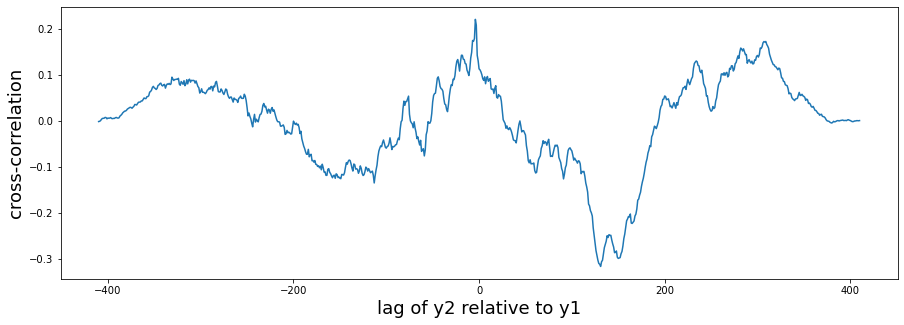

In [89]:
import numpy as np
d11 = m1[m1[' CO(ppm)'].notna()]
print(len(d11))
d11 = m1[m1[' CO(ppm)'].notna()]
y1 = d11['co_ppm']
y2 = d11[' CO(ppm)']
npts = len(d11)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(y1, y2)
MAE = mean_absolute_error(y1, y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

Text(0.5, 1.0, 'correlation of data')

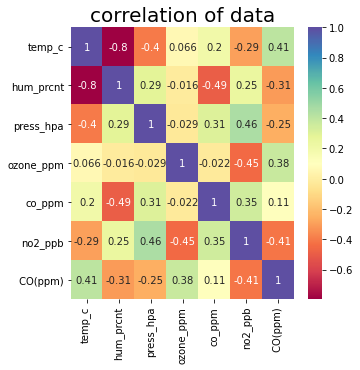

In [90]:
mask = np.triu(np.ones_like(d11, dtype=bool))
plt.rcParams['figure.figsize'] = (5, 5)
hm = sns.heatmap(d11[['temp_c','hum_prcnt','press_hpa','ozone_ppm','co_ppm', 'no2_ppb',' CO(ppm)']].corr(), annot = True, cmap = 'Spectral')
hm.set_title(label = "correlation of data", fontsize = 20)

In [91]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=d11['Date Time'], y=d11['co_ppm'], name="Megasense Device76 CO"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=d11['Date Time'], y=d11[' CO(ppm)'], name="Aeroqual CO"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Megasense device76 vs Aeroqual CO data"
)

# Set x-axis title
fig.update_xaxes(title_text="xaxis title")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Megasense Device76 CO(ppm)</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Aeroqual CO(ppm)</b> ", secondary_y=True)

fig.show()
#fig.write_html("co_device76_1-7nov.html")

# Device 61

In [92]:
m1 = pd.read_csv('Mobile data//Aero_device61_1-7nov.csv', parse_dates = ['Date Time'])


In [93]:
m1[' PM10(ppm)'] = pd.to_numeric(m1[' PM10(ppm)'], errors='coerce')
m1[' PM2.5(ppm)'] = pd.to_numeric(m1[' PM2.5(ppm)'], errors='coerce')
m1[' CO(ppm)'] = pd.to_numeric(m1[' CO(ppm)'], errors='coerce')

In [94]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=m1['Date Time'], y=m1['co_ppm'], name="Megasense Device61 CO"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=m1['Date Time'], y=m1[' CO(ppm)'], name="Aeroqual CO"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Megasense device61 vs Aeroqual CO data"
)

# Set x-axis title
fig.update_xaxes(title_text="xaxis title")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Megasense Device61 CO(ppm)</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Aeroqual CO(ppm)</b> ", secondary_y=True)

fig.show()

366
max correlation is at lag -4
max correlation is  0.355
Pearsons correlation: 0.178
MSE CO:  215145.68145313932
MAE CO:  457.07952732240443
RMSE CO:  463.8379905237812


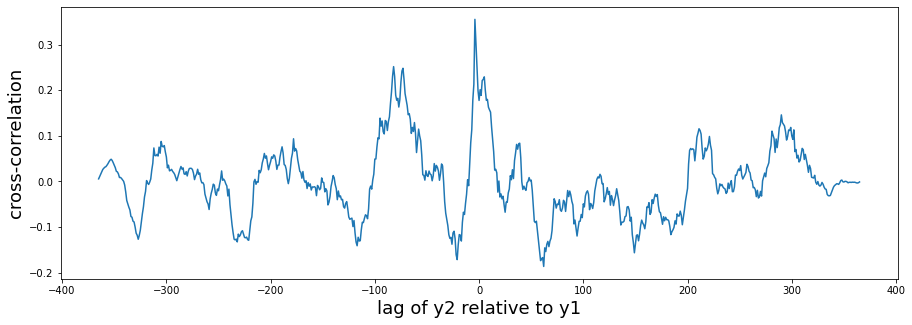

In [95]:
import numpy as np
d11 = m1[m1[' CO(ppm)'].notna()]
print(len(d11))
d11 = m1[m1[' CO(ppm)'].notna()]
y1 = d11['co_ppm']
y2 = d11[' CO(ppm)']
npts = len(d11)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(y1, y2)
MAE = mean_absolute_error(y1, y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

Text(0.5, 1.0, 'correlation of data')

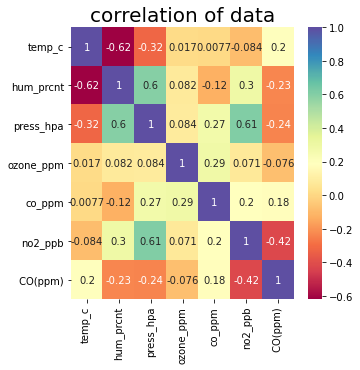

In [96]:
mask = np.triu(np.ones_like(d11, dtype=bool))
plt.rcParams['figure.figsize'] = (5, 5)
hm = sns.heatmap(d11[['temp_c','hum_prcnt','press_hpa','ozone_ppm','co_ppm', 'no2_ppb',' CO(ppm)']].corr(), annot = True, cmap = 'Spectral')
hm.set_title(label = "correlation of data", fontsize = 20)

In [97]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=d11['Date Time'], y=d11['co_ppm'], name="Megasense Device61 CO"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=d11['Date Time'], y=d11[' CO(ppm)'], name="Aeroqual CO"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Megasense device61 vs Aeroqual CO data"
)

# Set x-axis title
fig.update_xaxes(title_text="xaxis title")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Megasense Device61 CO(ppm)</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Aeroqual CO(ppm)</b> ", secondary_y=True)

fig.show()
fig.write_html("co_device61_1-7nov.html")

# Device C5

In [98]:
m1 = pd.read_csv('Mobile data//Aero_devicec5_1-7nov.csv', parse_dates = ['Date Time'])
m1[' PM10(ppm)'] = pd.to_numeric(m1[' PM10(ppm)'], errors='coerce')
m1[' PM2.5(ppm)'] = pd.to_numeric(m1[' PM2.5(ppm)'], errors='coerce')
m1[' CO(ppm)'] = pd.to_numeric(m1[' CO(ppm)'], errors='coerce')

In [99]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=m1['Date Time'], y=m1['co_ppm'], name="Megasense DeviceC5 CO"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=m1['Date Time'], y=m1[' CO(ppm)'], name="Aeroqual CO"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Megasense deviceC5 vs Aeroqual CO data"
)

# Set x-axis title
fig.update_xaxes(title_text="xaxis title")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Megasense Device76 CO(ppm)</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Aeroqual CO(ppm)</b> ", secondary_y=True)

fig.show()
fig.write_html("co_devicec5_1-7nov.html")

131
max correlation is at lag -2
max correlation is  0.309
Pearsons correlation: 0.285
MSE CO:  301432.960448771
MAE CO:  539.413106870229
RMSE CO:  549.0291071052345


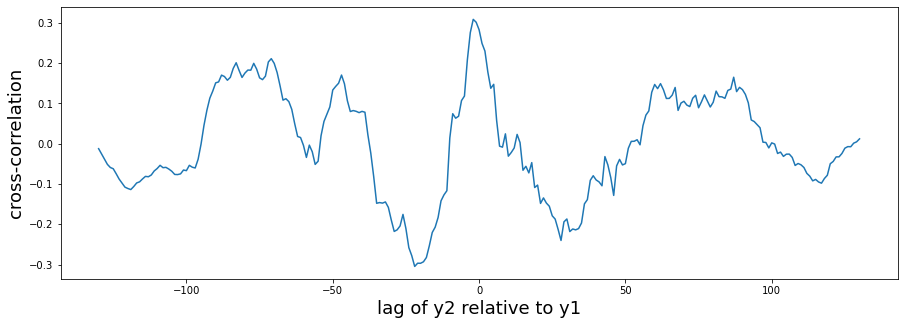

In [100]:
import numpy as np
d11 = m1[m1[' CO(ppm)'].notna()]
print(len(d11))
d11 = m1[m1[' CO(ppm)'].notna()]
y1 = d11['co_ppm']
y2 = d11[' CO(ppm)']
npts = len(d11)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(y1, y2)
MAE = mean_absolute_error(y1, y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

Text(0.5, 1.0, 'correlation of data')

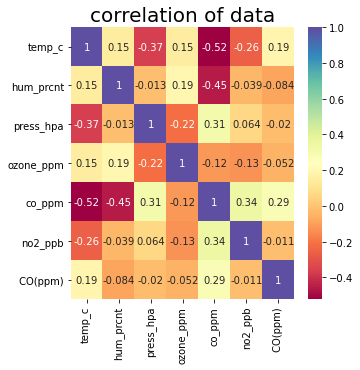

In [101]:
mask = np.triu(np.ones_like(d11, dtype=bool))
plt.rcParams['figure.figsize'] = (5, 5)
hm = sns.heatmap(d11[['temp_c','hum_prcnt','press_hpa','ozone_ppm','co_ppm', 'no2_ppb',' CO(ppm)']].corr(), annot = True, cmap = 'Spectral')
hm.set_title(label = "correlation of data", fontsize = 20)

In [102]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=d11['Date Time'], y=d11['co_ppm'], name="Megasense DeviceC5 CO"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=d11['Date Time'], y=d11[' CO(ppm)'], name="Aeroqual CO"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Megasense deviceC5 vs Aeroqual CO data"
)

# Set x-axis title
fig.update_xaxes(title_text="xaxis title")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Megasense DeviceC5 CO(ppm)</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Aeroqual CO(ppm)</b> ", secondary_y=True)

fig.show()

In [103]:
dc5 = pd.read_csv('Mobile data//Aero_devicec5_1-7nov.csv', parse_dates= ['Date Time'])
dc5['date'] = pd.to_datetime(dc5['Date Time']).dt.date
list(dc5)

['Date Time',
 ' Monitor ID',
 ' Location ID',
 ' CO(ppm)',
 ' PM10(ppm)',
 ' PM2.5(ppm)',
 ' SO2(ppm)',
 'Unnamed: 0',
 'Unnamed: 0.1',
 'Unnamed: 0.1.1',
 'timestamp',
 'temp_c',
 'hum_prcnt',
 'press_hpa',
 'ozone_ppm',
 'ozone_volt_mv',
 'co_ppm',
 'co_mv',
 'no2_ppb',
 'no2_mv',
 'tvoc_ppb',
 'mc2p5_ugpm3',
 'mc1p0_ugpm3',
 'mc4p0_ugpm3',
 'mc10p0_ugpm3',
 'nc0p5_npcm3',
 'nc1p0_npcm3',
 'nc2p5_npcm3',
 'nc4p0_npcm3',
 'nc10p0_npcm3',
 'typ_pm_um',
 'x_g',
 'y_g',
 'z_g',
 'x_raw',
 'y_raw',
 'z_raw',
 'eq_db',
 'onesmin_db',
 'onesmax_db',
 'lux_lx',
 'uv_mwpm2',
 'batt_volt',
 'batt_prcnt',
 'si1133_int',
 'lis3dh_int',
 'sgpc3_int',
 'batt_int',
 'speco3_int',
 'sps30_int',
 'sps30pre_int',
 'mic4514_int',
 'mic4514pre_int',
 'mic_int',
 'bme280_int',
 'leds_on',
 'code_version',
 'receivedTimestamp',
 'lat',
 'lon',
 'acc',
 'co-ug',
 'no2-ug',
 'o3-ug',
 'co-mg',
 'bc-proxy',
 'ldsa-proxy',
 'newaqi',
 'dosage-male-walking-low',
 'dosage-male-walking-high',
 'dosage-female-wa

In [112]:
import plotly.graph_objects as go

fig = go.Figure(go.Scattermapbox(
    mode = "markers+lines",
    lon = dc5['lon'],
    lat = dc5['lat'],
    marker = {'size': 10}, color = dc5['date']))

#fig.add_trace(go.Scattermapbox(
#    mode = "markers+lines",
#    lon = [-50, -60,40],
#    lat = [30, 10, -20],
  #  marker = {'size': 10}))

fig.update_layout(
    margin ={'l':0,'t':0,'b':0,'r':0},
    mapbox = {
        'center': {'lon': 10, 'lat': 10},
        'style': "open-street-map",
        'center': {'lon': 78.4867 , 'lat': 17.3850},
        'zoom': 1})

fig.show()

fig = px.scatter_mapbox(us_cities, lat="lat", lon="lon", hover_data=["State", "Population"],
                        color = 'date', zoom=3, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


ValueError: Invalid property specified for object of type plotly.graph_objs.Scattermapbox: 'color'

Did you mean "below"?

    Valid properties:
        below
            Determines if this scattermapbox trace's layers are to
            be inserted before the layer with the specified ID. By
            default, scattermapbox layers are inserted above all
            the base layers. To place the scattermapbox layers
            above every other layer, set `below` to "''".
        connectgaps
            Determines whether or not gaps (i.e. {nan} or missing
            values) in the provided data arrays are connected.
        customdata
            Assigns extra data each datum. This may be useful when
            listening to hover, click and selection events. Note
            that, "scatter" traces also appends customdata items in
            the markers DOM elements
        customdatasrc
            Sets the source reference on Chart Studio Cloud for
            customdata .
        fill
            Sets the area to fill with a solid color. Use with
            `fillcolor` if not "none". "toself" connects the
            endpoints of the trace (or each segment of the trace if
            it has gaps) into a closed shape.
        fillcolor
            Sets the fill color. Defaults to a half-transparent
            variant of the line color, marker color, or marker line
            color, whichever is available.
        hoverinfo
            Determines which trace information appear on hover. If
            `none` or `skip` are set, no information is displayed
            upon hovering. But, if `none` is set, click and hover
            events are still fired.
        hoverinfosrc
            Sets the source reference on Chart Studio Cloud for
            hoverinfo .
        hoverlabel
            :class:`plotly.graph_objects.scattermapbox.Hoverlabel`
            instance or dict with compatible properties
        hovertemplate
            Template string used for rendering the information that
            appear on hover box. Note that this will override
            `hoverinfo`. Variables are inserted using %{variable},
            for example "y: %{y}" as well as %{xother}, {%_xother},
            {%_xother_}, {%xother_}. When showing info for several
            points, "xother" will be added to those with different
            x positions from the first point. An underscore before
            or after "(x|y)other" will add a space on that side,
            only when this field is shown. Numbers are formatted
            using d3-format's syntax %{variable:d3-format}, for
            example "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. The variables available in
            `hovertemplate` are the ones emitted as event data
            described at this link
            https://plotly.com/javascript/plotlyjs-events/#event-
            data. Additionally, every attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available.  Anything contained in tag `<extra>` is
            displayed in the secondary box, for example
            "<extra>{fullData.name}</extra>". To hide the secondary
            box completely, use an empty tag `<extra></extra>`.
        hovertemplatesrc
            Sets the source reference on Chart Studio Cloud for
            hovertemplate .
        hovertext
            Sets hover text elements associated with each (lon,lat)
            pair If a single string, the same string appears over
            all the data points. If an array of string, the items
            are mapped in order to the this trace's (lon,lat)
            coordinates. To be seen, trace `hoverinfo` must contain
            a "text" flag.
        hovertextsrc
            Sets the source reference on Chart Studio Cloud for
            hovertext .
        ids
            Assigns id labels to each datum. These ids for object
            constancy of data points during animation. Should be an
            array of strings, not numbers or any other type.
        idssrc
            Sets the source reference on Chart Studio Cloud for
            ids .
        lat
            Sets the latitude coordinates (in degrees North).
        latsrc
            Sets the source reference on Chart Studio Cloud for
            lat .
        legendgroup
            Sets the legend group for this trace. Traces part of
            the same legend group hide/show at the same time when
            toggling legend items.
        legendgrouptitle
            :class:`plotly.graph_objects.scattermapbox.Legendgroupt
            itle` instance or dict with compatible properties
        legendrank
            Sets the legend rank for this trace. Items and groups
            with smaller ranks are presented on top/left side while
            with `*reversed* `legend.traceorder` they are on
            bottom/right side. The default legendrank is 1000, so
            that you can use ranks less than 1000 to place certain
            items before all unranked items, and ranks greater than
            1000 to go after all unranked items.
        line
            :class:`plotly.graph_objects.scattermapbox.Line`
            instance or dict with compatible properties
        lon
            Sets the longitude coordinates (in degrees East).
        lonsrc
            Sets the source reference on Chart Studio Cloud for
            lon .
        marker
            :class:`plotly.graph_objects.scattermapbox.Marker`
            instance or dict with compatible properties
        meta
            Assigns extra meta information associated with this
            trace that can be used in various text attributes.
            Attributes such as trace `name`, graph, axis and
            colorbar `title.text`, annotation `text`
            `rangeselector`, `updatemenues` and `sliders` `label`
            text all support `meta`. To access the trace `meta`
            values in an attribute in the same trace, simply use
            `%{meta[i]}` where `i` is the index or key of the
            `meta` item in question. To access trace `meta` in
            layout attributes, use `%{data[n[.meta[i]}` where `i`
            is the index or key of the `meta` and `n` is the trace
            index.
        metasrc
            Sets the source reference on Chart Studio Cloud for
            meta .
        mode
            Determines the drawing mode for this scatter trace. If
            the provided `mode` includes "text" then the `text`
            elements appear at the coordinates. Otherwise, the
            `text` elements appear on hover.
        name
            Sets the trace name. The trace name appear as the
            legend item and on hover.
        opacity
            Sets the opacity of the trace.
        selected
            :class:`plotly.graph_objects.scattermapbox.Selected`
            instance or dict with compatible properties
        selectedpoints
            Array containing integer indices of selected points.
            Has an effect only for traces that support selections.
            Note that an empty array means an empty selection where
            the `unselected` are turned on for all points, whereas,
            any other non-array values means no selection all where
            the `selected` and `unselected` styles have no effect.
        showlegend
            Determines whether or not an item corresponding to this
            trace is shown in the legend.
        stream
            :class:`plotly.graph_objects.scattermapbox.Stream`
            instance or dict with compatible properties
        subplot
            Sets a reference between this trace's data coordinates
            and a mapbox subplot. If "mapbox" (the default value),
            the data refer to `layout.mapbox`. If "mapbox2", the
            data refer to `layout.mapbox2`, and so on.
        text
            Sets text elements associated with each (lon,lat) pair
            If a single string, the same string appears over all
            the data points. If an array of string, the items are
            mapped in order to the this trace's (lon,lat)
            coordinates. If trace `hoverinfo` contains a "text"
            flag and "hovertext" is not set, these elements will be
            seen in the hover labels.
        textfont
            Sets the icon text font (color=mapbox.layer.paint.text-
            color, size=mapbox.layer.layout.text-size). Has an
            effect only when `type` is set to "symbol".
        textposition
            Sets the positions of the `text` elements with respects
            to the (x,y) coordinates.
        textsrc
            Sets the source reference on Chart Studio Cloud for
            text .
        texttemplate
            Template string used for rendering the information text
            that appear on points. Note that this will override
            `textinfo`. Variables are inserted using %{variable},
            for example "y: %{y}". Numbers are formatted using
            d3-format's syntax %{variable:d3-format}, for example
            "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. Every attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available. variables `lat`, `lon` and `text`.
        texttemplatesrc
            Sets the source reference on Chart Studio Cloud for
            texttemplate .
        uid
            Assign an id to this trace, Use this to provide object
            constancy between traces during animations and
            transitions.
        uirevision
            Controls persistence of some user-driven changes to the
            trace: `constraintrange` in `parcoords` traces, as well
            as some `editable: true` modifications such as `name`
            and `colorbar.title`. Defaults to `layout.uirevision`.
            Note that other user-driven trace attribute changes are
            controlled by `layout` attributes: `trace.visible` is
            controlled by `layout.legend.uirevision`,
            `selectedpoints` is controlled by
            `layout.selectionrevision`, and `colorbar.(x|y)`
            (accessible with `config: {editable: true}`) is
            controlled by `layout.editrevision`. Trace changes are
            tracked by `uid`, which only falls back on trace index
            if no `uid` is provided. So if your app can add/remove
            traces before the end of the `data` array, such that
            the same trace has a different index, you can still
            preserve user-driven changes if you give each trace a
            `uid` that stays with it as it moves.
        unselected
            :class:`plotly.graph_objects.scattermapbox.Unselected`
            instance or dict with compatible properties
        visible
            Determines whether or not this trace is visible. If
            "legendonly", the trace is not drawn, but can appear as
            a legend item (provided that the legend itself is
            visible).
        
Did you mean "below"?

Bad property path:
color
^^^^^

# Prana Air

In [8]:
p = pd.read_csv('Mobile data//Prana_data.csv')
a1 = pd.read_csv('Aeroqual_data//Aeroqual_mobile(1-7nov).csv', parse_dates = ['Date Time'])

In [9]:
p['Time'] = pd.to_datetime(p['Time'], dayfirst = True)
p

,Time,AQI-IN,PM25,PM10,Temp(cel),Hum,CO(ppm),SO2(ppm),NO2(ppm),O3(ppm)
0,2021-11-01 10:44:00,11.0,7.0,7.0,32.1,37.3,23.20,16.751,-0.187,2.247
1,2021-11-01 10:44:00,11.0,7.0,7.0,32.0,37.4,17.76,16.751,-0.193,1.977
2,2021-11-01 10:45:00,8.0,5.0,5.0,32.0,37.9,15.05,16.751,-0.193,1.788
3,2021-11-01 10:45:00,10.0,6.0,6.0,32.0,37.8,13.47,16.751,-0.196,1.605
4,2021-11-01 10:46:00,10.0,6.0,6.0,32.0,38.2,12.07,16.751,-0.202,1.447
...,...,...,...,...,...,...,...,...,...,...
2614,2021-11-08 11:39:00,6.0,4.0,4.0,30.6,37.9,14.52,17.287,-0.069,1.822
2615,2021-11-08 11:40:00,11.0,7.0,8.0,29.3,38.9,12.10,17.287,-0.035,1.667
2616,2021-11-08 11:40:00,25.0,15.0,17.0,29.1,39.6,11.12,17.287,-0.012,1.440
2617,2021-11-08 11:41:00,35.0,21.0,23.0,28.2,41.8,9.62,17.287,0.018,1.313


In [10]:
p = p.rename(columns = {'Time': 'Date Time'})

In [11]:
print(p.dtypes)
print(a1.dtypes)

Date Time    datetime64[ns]
AQI-IN              float64
PM25                float64
PM10                float64
Temp(cel)           float64
Hum                 float64
CO(ppm)             float64
SO2(ppm)            float64
NO2(ppm)            float64
O3(ppm)             float64
dtype: object
Unnamed: 0               int64
Date Time       datetime64[ns]
 Monitor ID              int64
 Location ID             int64
 CO(ppm)                object
 PM10(ppm)              object
 PM2.5(ppm)             object
 SO2(ppm)               object
dtype: object


In [12]:
p.set_index("Date Time", inplace = True)
p = p.resample('T').mean().round(3)
p = p[p['AQI-IN'].notna()]

In [13]:
p1 = pd.merge(a1, p, on = 'Date Time', how = 'inner')

In [14]:
p1

,Unnamed: 0,Date Time,Monitor ID,Location ID,CO(ppm),PM10(ppm),PM2.5(ppm),SO2(ppm),AQI-IN,PM25,PM10,Temp(cel),Hum,CO(ppm),SO2(ppm),NO2(ppm),O3(ppm)
0,11346,2021-11-01 11:05:00,1,1,,0.079,0.059,,7.0,4.5,4.5,34.40,34.85,4.515,1.062,-0.238,0.452
1,11347,2021-11-01 11:06:00,1,1,,0.079,0.061,,9.0,5.5,5.5,34.50,35.00,4.285,0.975,-0.239,0.450
2,11348,2021-11-01 11:07:00,1,1,,0.080,0.062,,9.0,5.5,5.5,34.50,34.95,4.235,0.831,-0.238,0.449
3,11349,2021-11-01 11:08:00,1,1,,0.080,0.064,,8.0,5.0,5.0,34.50,34.90,4.180,0.808,-0.239,0.441
4,11350,2021-11-01 11:09:00,1,1,,0.081,0.061,,7.0,4.5,4.5,34.55,34.85,4.045,0.782,-0.238,0.435
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1359,13317,2021-11-06 20:38:00,1,1,,0.100,0.086,NaN,24.5,15.0,16.5,25.00,62.95,4.705,2.948,0.104,0.284
1360,13318,2021-11-06 20:39:00,1,1,,0.123,0.095,NaN,35.5,21.5,24.5,25.00,62.65,4.760,2.954,0.094,0.290
1361,13319,2021-11-06 20:40:00,1,1,,0.139,0.102,NaN,65.0,39.0,44.0,25.00,61.90,4.620,2.857,0.105,0.292
1362,13320,2021-11-06 20:41:00,1,1,,0.137,0.109,NaN,66.0,40.0,45.0,24.80,62.70,4.590,2.827,0.107,0.287


In [15]:
list(p1)

['Unnamed: 0',
 'Date Time',
 ' Monitor ID',
 ' Location ID',
 ' CO(ppm)',
 ' PM10(ppm)',
 ' PM2.5(ppm)',
 ' SO2(ppm)',
 'AQI-IN',
 'PM25',
 'PM10',
 'Temp(cel)',
 'Hum',
 'CO(ppm)',
 'SO2(ppm)',
 'NO2(ppm)',
 'O3(ppm)']

In [17]:

fig = make_subplots(rows=9, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0)
fig.add_trace(go.Scatter(x=p1['Date Time'], y=p1['AQI-IN'], name = 'AQI', xaxis="x9",yaxis = 'y9'),
              row=9, col=1)

fig.add_trace(go.Scatter(x=p1['Date Time'], y=p1['PM25'], name = 'PM2.5 Prana',  xaxis="x8",yaxis = 'y8'),
              row=8, col=1)

fig.add_trace(go.Scatter(x=p1['Date Time'], y=p1[' PM2.5(ppm)'], name = 'PM2.5 Aeroqual',  xaxis="x8",yaxis = 'y8'),
              row=8, col=1)

fig.add_trace(go.Scatter(x=p1['Date Time'], y=p1['PM10'], name = 'PM10 Prana',  xaxis="x7",yaxis = 'y7'),
              row=7, col=1)

fig.add_trace(go.Scatter(x=p1['Date Time'], y=p1[' PM10(ppm)'], name = 'PM10 Aeroqual',  xaxis="x7",yaxis = 'y7'),
              row=7, col=1)

fig.add_trace(go.Scatter(x=p1['Date Time'], y=p1['Temp(cel)'], name = 'Temperature', xaxis="x6",yaxis = 'y6'),
              row=6, col=1)

fig.add_trace(go.Scatter(x=p1['Date Time'], y=p1['Hum'], name = 'Humidity',  xaxis="x5",yaxis = 'y5'),
              row=5, col=1)

fig.add_trace(go.Scatter(x=p1['Date Time'], y=p1['CO(ppm)'], name = 'CO(ppm) Prana',  xaxis="x4",yaxis = 'y4'),
              row=4, col=1)

fig.add_trace(go.Scatter(x=p1['Date Time'], y=p1[' CO(ppm)'], name = 'CO(ppm) Aeroqual',  xaxis="x4",yaxis = 'y4'),
              row=4, col=1)

fig.add_trace(go.Scatter(x=p1['Date Time'], y=p1['SO2(ppm)'], name = 'SO2(ppm) Prana',  xaxis="x3",yaxis = 'y3'),
              row=3, col=1)

fig.add_trace(go.Scatter(x=p1['Date Time'], y=p1[' SO2(ppm)'], name = 'SO2(ppm) Aeroqual',  xaxis="x3",yaxis = 'y3'),
              row=3, col=1)

fig.add_trace(go.Scatter(x=p1['Date Time'], y=p1['NO2(ppm)'], name = 'NO2(ppm) Prana',  xaxis="x2",yaxis = 'y2'),
              row=2, col=1)

fig.add_trace(go.Scatter(x=p1['Date Time'], y=p1['O3(ppm)'], name = 'O3(ppm) Prana',  xaxis="x1",yaxis = 'y1'),
              row=1, col=1)

fig.update_layout(height=600, width=1000,
                  title_text="Stacked Subplots with Shared X-Axes")



# Create axis objects
fig.update_layout(
    xaxis9=dict(title ="Timestamp",domain=[0.8, 0.7]),
    yaxis=dict(title="Ozone"),
    yaxis2=dict(title="NO2"),
    yaxis3=dict(title="SO2"),
    yaxis4=dict(title="CO"),
    yaxis5=dict(title="Humidity"),
    yaxis6=dict(title="Temperature"),
    yaxis7=dict(title="PM10"),
    yaxis8=dict(title="PM2.5"),
    yaxis9=dict(title="AQI")
        
   
)

# Update layout properties
fig.update_layout(
    title_text="multiple y-axes example",
    width=800,
)


fig.show()
fig.write_html("prana_vs_aeroqual.html")

In [18]:

d11 = p1[p1[' CO(ppm)'].notna()]
print(len(d11))

d11[' PM10(ppm)'] = pd.to_numeric(d11[' PM10(ppm)'], errors='coerce')
d11[' PM2.5(ppm)'] = pd.to_numeric(d11[' PM2.5(ppm)'], errors='coerce')
d11[' CO(ppm)'] = pd.to_numeric(d11[' CO(ppm)'], errors='coerce')
d11[' SO2(ppm)'] = pd.to_numeric(d11[' SO2(ppm)'], errors='coerce')


1364


In [19]:
d11 = d11.rename(columns = {' CO(ppm)': 'CO_Aeroqual', ' SO2(ppm)': 'SO2_Aeroqual', ' PM10(ppm)':'PM10_Aeroqual',
                          ' PM2.5(ppm)': 'PM2.5_Aeroqual'}) 
d11

,Unnamed: 0,Date Time,Monitor ID,Location ID,CO_Aeroqual,PM10_Aeroqual,PM2.5_Aeroqual,SO2_Aeroqual,AQI-IN,PM25,PM10,Temp(cel),Hum,CO(ppm),SO2(ppm),NO2(ppm),O3(ppm)
0,11346,2021-11-01 11:05:00,1,1,NaN,0.079,0.059,NaN,7.0,4.5,4.5,34.40,34.85,4.515,1.062,-0.238,0.452
1,11347,2021-11-01 11:06:00,1,1,NaN,0.079,0.061,NaN,9.0,5.5,5.5,34.50,35.00,4.285,0.975,-0.239,0.450
2,11348,2021-11-01 11:07:00,1,1,NaN,0.080,0.062,NaN,9.0,5.5,5.5,34.50,34.95,4.235,0.831,-0.238,0.449
3,11349,2021-11-01 11:08:00,1,1,NaN,0.080,0.064,NaN,8.0,5.0,5.0,34.50,34.90,4.180,0.808,-0.239,0.441
4,11350,2021-11-01 11:09:00,1,1,NaN,0.081,0.061,NaN,7.0,4.5,4.5,34.55,34.85,4.045,0.782,-0.238,0.435
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1359,13317,2021-11-06 20:38:00,1,1,NaN,0.100,0.086,NaN,24.5,15.0,16.5,25.00,62.95,4.705,2.948,0.104,0.284
1360,13318,2021-11-06 20:39:00,1,1,NaN,0.123,0.095,NaN,35.5,21.5,24.5,25.00,62.65,4.760,2.954,0.094,0.290
1361,13319,2021-11-06 20:40:00,1,1,NaN,0.139,0.102,NaN,65.0,39.0,44.0,25.00,61.90,4.620,2.857,0.105,0.292
1362,13320,2021-11-06 20:41:00,1,1,NaN,0.137,0.109,NaN,66.0,40.0,45.0,24.80,62.70,4.590,2.827,0.107,0.287


max correlation is at lag -4
max correlation is  0.43
Pearsons correlation: 0.390
MSE CO:  18.4093222892562
MAE CO:  3.4323553719008264
RMSE CO:  4.2906086152498455


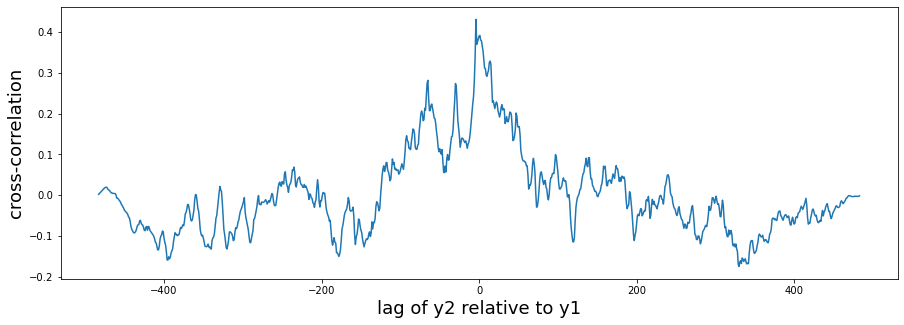

In [20]:
import numpy as np
d11 = d11[d11['CO_Aeroqual'].notna()]
y1 = d11['CO(ppm)']
y2 = d11['CO_Aeroqual']
npts = len(d11)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(y1, y2)
MAE = mean_absolute_error(y1, y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

Text(0.5, 1.0, 'correlation of data')

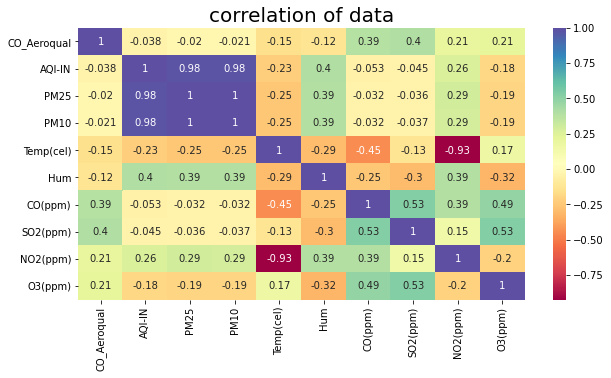

In [21]:
plt.rcParams['figure.figsize'] = (10, 5)
hm = sns.heatmap(d11[['CO_Aeroqual',
 'AQI-IN',
 'PM25',
 'PM10',
 'Temp(cel)',
 'Hum',
 'CO(ppm)',
 'SO2(ppm)',
 'NO2(ppm)',
 'O3(ppm)']].corr(), annot = True, cmap = 'Spectral')
hm.set_title(label = "correlation of data", fontsize = 20)

In [22]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=d11['Date Time'], y=d11['CO(ppm)'], name="Prana Air CO"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=d11['Date Time'], y=d11['CO_Aeroqual'], name="Aeroqual CO"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Prana Air vs Aeroqual CO data"
)

# Set x-axis title
fig.update_xaxes(title_text="xaxis title")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Prana Air CO(ppm)</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Aeroqual CO(ppm)</b> ", secondary_y=True)

fig.show()
fig.write_html("prana_aeroqual_co.html")

In [23]:
d11 = p1[p1[' SO2(ppm)'].notna()]
print(len(d11))

d11[' PM10(ppm)'] = pd.to_numeric(d11[' PM10(ppm)'], errors='coerce')
d11[' PM2.5(ppm)'] = pd.to_numeric(d11[' PM2.5(ppm)'], errors='coerce')
d11[' CO(ppm)'] = pd.to_numeric(d11[' CO(ppm)'], errors='coerce')
d11[' SO2(ppm)'] = pd.to_numeric(d11[' SO2(ppm)'], errors='coerce')

947


<ipython-input-23-04a22f925bb6>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-23-04a22f925bb6>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-23-04a22f925bb6>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-23-04a22f9

max correlation is at lag -23
max correlation is  0.484
Pearsons correlation: 0.107
MSE SO2:  7.098019624535316
MAE SO2:  2.0757583643122675
RMSE SO2:  2.6642108821441512


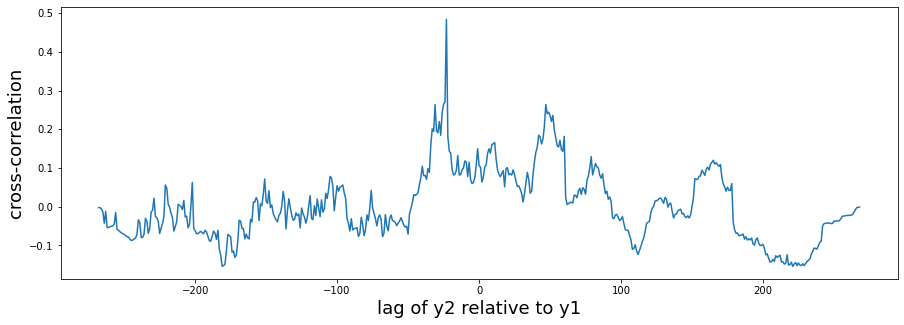

In [57]:
d11 = d11.rename(columns = {' CO(ppm)': 'CO_Aeroqual', ' SO2(ppm)': 'SO2_Aeroqual', ' PM10(ppm)':'PM10_Aeroqual',
                          ' PM2.5(ppm)': 'PM2.5_Aeroqual'}) 
d11 = d11[d11['SO2_Aeroqual'].notna()]
y1 = d11['SO2(ppm)']
y2 = d11['SO2_Aeroqual']
npts = len(d11)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(y1, y2)
MAE = mean_absolute_error(y1, y2)
print("MSE SO2: ", MSE)
print("MAE SO2: ", MAE)
print("RMSE SO2: ", np.sqrt(mean_squared_error(y1, y2)))

Text(0.5, 1.0, 'correlation of data')

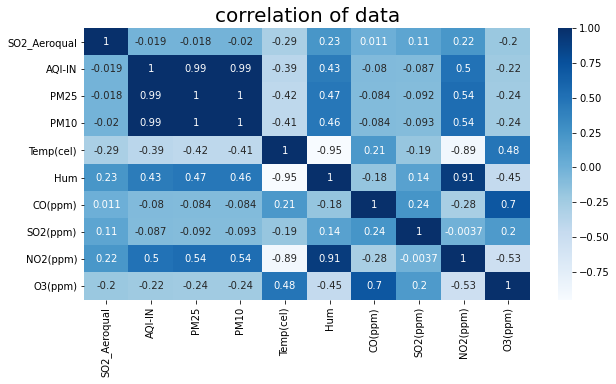

In [60]:
plt.rcParams['figure.figsize'] = (10, 5)
hm = sns.heatmap(d11[['SO2_Aeroqual','AQI-IN',
 'PM25',
 'PM10',
 'Temp(cel)',
 'Hum',
 'CO(ppm)',
 'SO2(ppm)',
 'NO2(ppm)',
 'O3(ppm)']].corr(), annot = True, cmap = 'Blues')
hm.set_title(label = "correlation of data", fontsize = 20)

In [61]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=d11['Date Time'], y=d11['SO2(ppm)'], name="Prana Air SO2"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=d11['Date Time'], y=d11['SO2_Aeroqual'], name="Aeroqual SO2"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Prana Air vs Aeroqual SO2 data"
)

# Set x-axis title
fig.update_xaxes(title_text="xaxis title")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Prana Air SO2(ppm)</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Aeroqual SO2(ppm)</b> ", secondary_y=True)

fig.show()

# Gases

In [24]:
df1 = pd.read_csv('Mobile data//Gases_data.csv', parse_dates = ['created_at'])
a = pd.read_csv('Aeroqual_data//Aeroqual_mobile(1-7nov).csv', parse_dates = ['Date Time'])

In [25]:
a = a.rename(columns= {'Date Time': 'created_at'})
a[' PM10(ppm)'] = pd.to_numeric(a[' PM10(ppm)'], errors='coerce')
a[' PM2.5(ppm)'] = pd.to_numeric(a[' PM2.5(ppm)'], errors='coerce')
a[' CO(ppm)'] = pd.to_numeric(a[' CO(ppm)'], errors='coerce')
a[' SO2(ppm)'] = pd.to_numeric(a[' SO2(ppm)'], errors='coerce')
def remove_timezone(dt):
   
    # HERE `dt` is a python datetime
    # object that used .replace() method
    return dt.replace(tzinfo=None)
df1['created_at'] = df1['created_at'].apply(remove_timezone)
df1.set_index("created_at", inplace = True)
DF1 = df1.resample('T', label='right', closed='right').mean().round(3)
DF1 = DF1.dropna(axis=1, how='all')
DF1 = DF1.drop(['entry_id'], axis = 1)
DF1 = DF1.rename(columns = {'field1': 'CO_1','field2': 'SO2_1', 'field3': 'CO_2', 'field4': 'SO2_2','field5': 'Temperature','field6': 'RH', 'field7': 'Pressure'})

In [26]:
O1 = pd.merge(a,DF1, on = 'created_at', how = 'inner')

In [27]:
s = O1.dropna(subset=[' SO2(ppm)'])
c = O1.dropna(subset=[' CO(ppm)'])

max correlation is at lag 160
max correlation is  0.408
Pearsons correlation: 0.008
MSE CO:  19685594.998932388
MAE CO:  2559.3870717592595
RMSE CO:  4436.845162830498


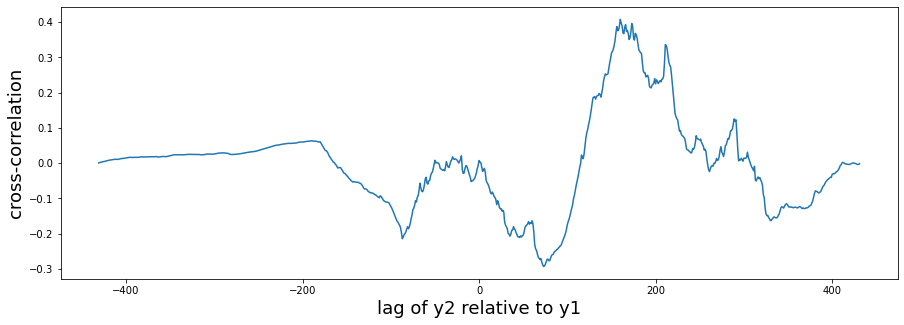

In [28]:
import numpy as np
c = c[c['CO_1'].notna()]
y1 = c['CO_1']
y2 = c[' CO(ppm)']
npts = len(c)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(y1, y2)
MAE = mean_absolute_error(y1, y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

In [29]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=c['created_at'], y=c['CO_1'], name="IIIT Node CO"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=c['created_at'], y=c[' CO(ppm)'], name="Aeroqual CO"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="IIIT Node vs Aeroqual CO data"
)

# Set x-axis title
fig.update_xaxes(title_text="xaxis title")

# Set y-axes titles
fig.update_yaxes(title_text="<b>IIITNode CO_1(ppm)</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Aeroqual CO(ppm)</b> ", secondary_y=True)

fig.show()

max correlation is at lag 63
max correlation is  0.313
Pearsons correlation: 0.138
MSE CO:  84.69569531018517
MAE CO:  7.605097222222223
RMSE CO:  9.203026421247804


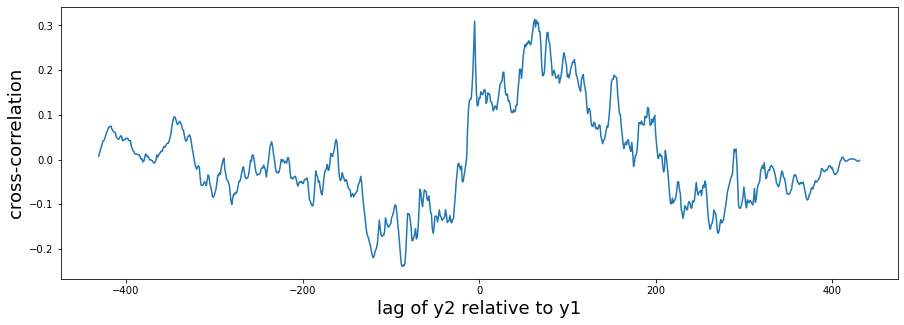

In [30]:
y1 = c['CO_2']
y2 = c[' CO(ppm)']
npts = len(c)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(y1, y2)
MAE = mean_absolute_error(y1, y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

In [31]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=c['created_at'], y=c['CO_2'], name="IIIT Node CO"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=c['created_at'], y=c[' CO(ppm)'], name="Aeroqual CO"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="IIIT Node vs Aeroqual CO data"
)

# Set x-axis title
fig.update_xaxes(title_text="xaxis title")

# Set y-axes titles
fig.update_yaxes(title_text="<b>IIITNode CO_2(ppm)</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Aeroqual CO(ppm)</b> ", secondary_y=True)

fig.show()

In [88]:
list(c)

['Unnamed: 0',
 'created_at',
 ' Monitor ID',
 ' Location ID',
 ' CO(ppm)',
 ' PM10(ppm)',
 ' PM2.5(ppm)',
 ' SO2(ppm)',
 'CO_1',
 'SO2_1',
 'CO_2',
 'SO2_2',
 'Temperature',
 'RH',
 'Pressure']

Text(0.5, 1.0, 'correlation of data')

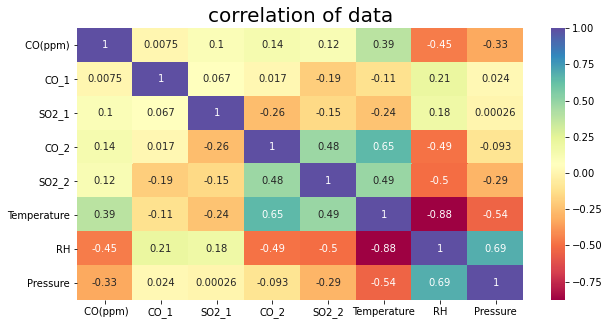

In [33]:
plt.rcParams['figure.figsize'] = (10, 5)
hm = sns.heatmap(c[[' CO(ppm)',
 'CO_1',
 'SO2_1',
 'CO_2',
 'SO2_2',
 'Temperature',
 'RH',
 'Pressure']].corr(), annot = True, cmap = 'Spectral')
hm.set_title(label = "correlation of data", fontsize = 20)

max correlation is at lag 94
max correlation is  0.356
Pearsons correlation: -0.063
MSE CO:  579.6689776818182
MAE CO:  18.57500505050505
RMSE CO:  24.076315699911774


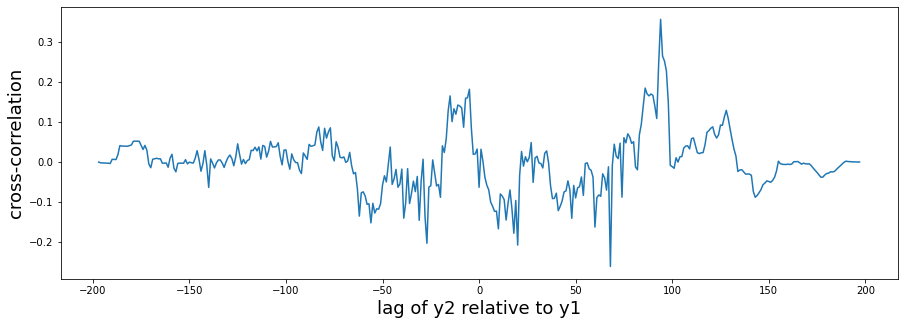

In [34]:
import numpy as np
s = s[s['SO2_1'].notna()]
y1 = s['SO2_1']
y2 = s[' SO2(ppm)']
npts = len(s)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(y1, y2)
MAE = mean_absolute_error(y1, y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

In [35]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=s['created_at'], y=s['SO2_1'], name="IIIT Node CO"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=s['created_at'], y=s[' SO2(ppm)'], name="Aeroqual CO"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="IIIT Node vs Aeroqual SO2 data"
)

# Set x-axis title
fig.update_xaxes(title_text="xaxis title")

# Set y-axes titles
fig.update_yaxes(title_text="<b>IIITNode SO2_1(ppm)</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Aeroqual SO2(ppm)</b> ", secondary_y=True)

fig.show()

max correlation is at lag 4
max correlation is  0.287
Pearsons correlation: 0.215
MSE CO:  7.863445868686867
MAE CO:  2.388212121212121
RMSE CO:  2.8041836367625548


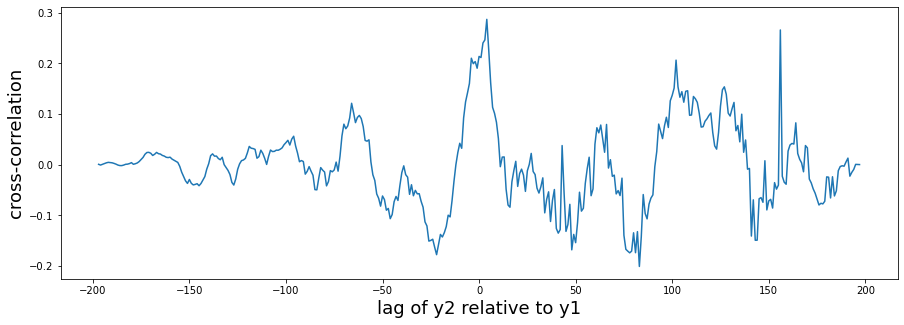

In [36]:

y1 = s['SO2_2']
y2 = s[' SO2(ppm)']
npts = len(s)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error(y1, y2)
MAE = mean_absolute_error(y1, y2)
print("MSE CO: ", MSE)
print("MAE CO: ", MAE)
print("RMSE CO: ", np.sqrt(mean_squared_error(y1, y2)))

In [37]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=s['created_at'], y=s['SO2_2'], name="IIIT Node CO"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=s['created_at'], y=s[' SO2(ppm)'], name="Aeroqual CO"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="IIIT Node vs Aeroqual SO2 data"
)

# Set x-axis title
fig.update_xaxes(title_text="xaxis title")

# Set y-axes titles
fig.update_yaxes(title_text="<b>IIITNode SO2_2(ppm)</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Aeroqual SO2(ppm)</b> ", secondary_y=True)

fig.show()

In [97]:
list(s)

['Unnamed: 0',
 'created_at',
 ' Monitor ID',
 ' Location ID',
 ' CO(ppm)',
 ' PM10(ppm)',
 ' PM2.5(ppm)',
 ' SO2(ppm)',
 'CO_1',
 'SO2_1',
 'CO_2',
 'SO2_2',
 'Temperature',
 'RH',
 'Pressure']

Text(0.5, 1.0, 'correlation of data')

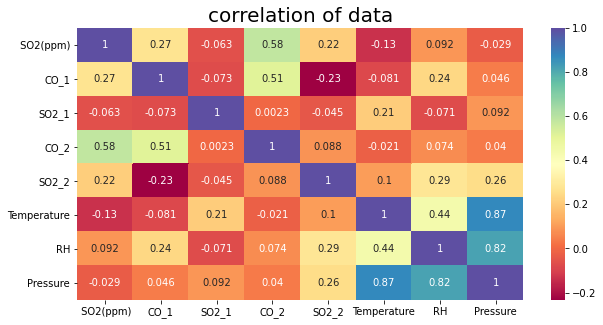

In [38]:
plt.rcParams['figure.figsize'] = (10, 5)
hm = sns.heatmap(s[[' SO2(ppm)',
 'CO_1',
 'SO2_1',
 'CO_2',
 'SO2_2',
 'Temperature',
 'RH',
 'Pressure']].corr(), annot = True, cmap = 'Spectral')
hm.set_title(label = "correlation of data", fontsize = 20)

# Prana and Gases

In [113]:
p

,AQI-IN,PM25,PM10,Temp(cel),Hum,CO(ppm),SO2(ppm),NO2(ppm),O3(ppm)
Date Time,,,,,,,,,
2021-11-01 10:44:00,11.0,7.0,7.0,32.05,37.35,20.480,16.751,-0.190,2.112
2021-11-01 10:45:00,9.0,5.5,5.5,32.00,37.85,14.260,16.751,-0.194,1.696
2021-11-01 10:46:00,10.0,6.0,6.0,32.00,38.35,11.535,16.751,-0.202,1.392
2021-11-01 10:47:00,10.0,6.0,7.0,32.00,38.70,9.800,16.751,-0.198,1.191
2021-11-01 10:49:00,14.0,8.5,9.5,32.25,37.85,8.245,4.914,-0.205,0.895
...,...,...,...,...,...,...,...,...,...
2021-11-08 11:37:00,13.0,8.0,8.5,30.40,37.75,15.590,17.287,-0.080,3.313
2021-11-08 11:38:00,9.0,5.5,5.5,30.50,37.80,20.685,17.287,-0.078,2.170
2021-11-08 11:39:00,6.0,4.0,4.0,30.60,37.90,14.520,17.287,-0.069,1.822


In [127]:
pr = p
pr

,created_at,AQI-IN,PM25,PM10,Temp(cel),Hum,CO(ppm),SO2(ppm),NO2(ppm),O3(ppm)
Date Time,,,,,,,,,,
2021-11-01 10:44:00,2021-11-01 10:44:00,11.0,7.0,7.0,32.05,37.35,20.480,16.751,-0.190,2.112
2021-11-01 10:45:00,2021-11-01 10:45:00,9.0,5.5,5.5,32.00,37.85,14.260,16.751,-0.194,1.696
2021-11-01 10:46:00,2021-11-01 10:46:00,10.0,6.0,6.0,32.00,38.35,11.535,16.751,-0.202,1.392
2021-11-01 10:47:00,2021-11-01 10:47:00,10.0,6.0,7.0,32.00,38.70,9.800,16.751,-0.198,1.191
2021-11-01 10:49:00,2021-11-01 10:49:00,14.0,8.5,9.5,32.25,37.85,8.245,4.914,-0.205,0.895
...,...,...,...,...,...,...,...,...,...,...
2021-11-08 11:37:00,2021-11-08 11:37:00,13.0,8.0,8.5,30.40,37.75,15.590,17.287,-0.080,3.313
2021-11-08 11:38:00,2021-11-08 11:38:00,9.0,5.5,5.5,30.50,37.80,20.685,17.287,-0.078,2.170
2021-11-08 11:39:00,2021-11-08 11:39:00,6.0,4.0,4.0,30.60,37.90,14.520,17.287,-0.069,1.822


In [126]:
#pr['created_at']= pr.index
pr.insert(loc = 0, column = 'created_at', value = p.index) 
pr

ValueError: cannot insert created_at, already exists

In [129]:
DF11 = DF1[DF1['CO_1'].notna()]

In [130]:
J = pd.merge(pr,DF11, on = 'created_at', how = 'inner')

In [131]:
J

,created_at,AQI-IN,PM25,PM10,Temp(cel),Hum,CO(ppm),SO2(ppm),NO2(ppm),O3(ppm),CO_1,SO2_1,CO_2,SO2_2,Temperature,RH,Pressure
0,2021-11-03 14:30:00,6.0,4.0,4.0,34.70,46.60,12.330,5.962,-0.239,3.771,0.0,16.000,0.000,0.000,33.220,45.618,941.963
1,2021-11-03 14:31:00,6.5,4.0,4.0,34.50,46.70,18.715,4.007,-0.234,2.482,0.0,16.000,-0.105,0.789,33.107,45.884,941.941
2,2021-11-03 14:32:00,5.0,3.0,3.0,34.30,47.40,19.170,3.778,-0.231,1.922,0.0,16.000,0.105,0.316,32.929,46.075,941.913
3,2021-11-03 14:33:00,4.0,2.5,2.5,34.15,47.50,13.355,3.764,-0.227,1.624,0.0,16.000,-0.053,12.211,32.316,47.428,941.868
4,2021-11-03 14:34:00,5.0,3.0,3.0,33.95,48.15,9.685,3.694,-0.222,1.291,0.0,17.600,-0.100,0.300,31.966,48.717,941.873
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
896,2021-11-06 19:53:00,8.0,5.0,5.0,23.00,73.80,4.030,3.613,0.098,0.286,16.0,21.053,-0.053,1.105,23.778,67.183,942.265
897,2021-11-06 19:54:00,7.0,4.5,4.5,23.00,73.90,3.995,3.590,0.094,0.280,16.0,18.824,-0.176,1.235,23.918,66.762,942.269
898,2021-11-06 19:55:00,9.0,5.5,6.0,23.00,73.60,3.990,3.546,0.100,0.284,16.0,16.000,-0.222,1.056,23.827,66.847,942.274
899,2021-11-06 19:56:00,8.0,5.0,5.0,23.00,73.60,4.210,3.560,0.099,0.281,16.0,20.000,-0.250,1.400,23.813,66.769,942.292


In [132]:
list(J)

['created_at',
 'AQI-IN',
 'PM25',
 'PM10',
 'Temp(cel)',
 'Hum',
 'CO(ppm)',
 'SO2(ppm)',
 'NO2(ppm)',
 'O3(ppm)',
 'CO_1',
 'SO2_1',
 'CO_2',
 'SO2_2',
 'Temperature',
 'RH',
 'Pressure']

Text(0.5, 1.0, 'correlation of data')

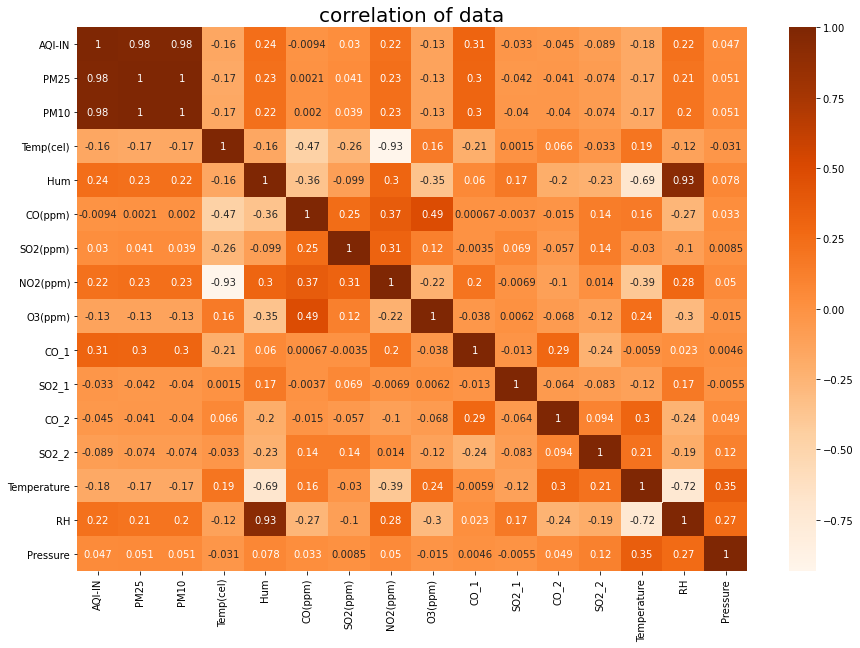

In [142]:
plt.rcParams['figure.figsize'] = (15, 10)
hm = sns.heatmap(J[['AQI-IN',
 'PM25',
 'PM10',
 'Temp(cel)',
 'Hum',
 'CO(ppm)',
 'SO2(ppm)',
 'NO2(ppm)',
 'O3(ppm)',
 'CO_1',
 'SO2_1',
 'CO_2',
 'SO2_2',
 'Temperature',
 'RH',
 'Pressure']].corr(), annot = True, cmap = 'Oranges')
hm.set_title(label = "correlation of data", fontsize = 20)

# Prana and Megasense
### Device 76

In [149]:
m = pd.read_csv('Megasense_device76//Device76_8nov.csv', parse_dates = ['Date Time'])

In [150]:
m

,Unnamed: 0,Date Time,timestamp,hr_time,temp_c,hum_prcnt,press_hpa,ozone_ppm,ozone_volt_mv,co_ppm,...,co-mg,bc-proxy,ldsa-proxy,newaqi,dosage-male-walking-low,dosage-male-walking-high,dosage-female-walking-low,dosage-female-walking-high,accbin,date
0,0,2021-05-06 16:26:52,1620298612050,2021-05-06 10:56:52,33.540001,25.024000,938.914612,0,286,429,...,0.293991,1.448908,0.000000,98.7,3.326717,8.316793,2.892797,7.231994,1,2021-05-06 10:56:52
1,1,2021-05-06 16:27:23,1620298643452,2021-05-06 10:57:23,33.599998,24.941000,938.923584,0,370,429,...,0.293883,1.462163,0.000000,97.3,3.579556,8.948891,3.112658,7.781644,1,2021-05-06 10:57:23
2,2,2021-05-06 16:27:54,1620298674053,2021-05-06 10:57:54,33.619999,24.746000,938.965698,2,-46,433,...,0.296887,1.446125,23.236138,96.6,3.536627,8.841569,3.075328,7.688321,1,2021-05-06 10:57:54
3,3,2021-05-06 16:28:25,1620298705062,2021-05-06 10:58:25,33.650002,25.643000,938.979187,0,99,439,...,0.302550,1.402127,0.000000,95.0,3.377119,8.442797,2.936625,7.341563,1,2021-05-06 10:58:25
4,4,2021-05-06 16:28:58,1620298738452,2021-05-06 10:58:58,33.570000,24.670000,939.000000,3,-59,435,...,0.298437,1.396044,22.512057,94.3,3.423429,8.558571,2.976894,7.442236,1,2021-05-06 10:58:58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13676,13676,2021-11-07 11:26:05,1636264565616,2021-11-07 05:56:05,33.310001,32.539001,951.788208,93,-1848,348,...,0.236558,0.378830,10.069744,151.8,18.200013,45.500034,15.826099,39.565247,0,2021-11-07 05:56:05
13677,13677,2021-11-07 11:26:36,1636264596620,2021-11-07 05:56:36,33.299999,32.428001,951.836487,79,-1580,365,...,0.250066,0.479320,11.572226,151.0,20.048459,50.121147,17.433442,43.583606,0,2021-11-07 05:56:36
13678,13678,2021-11-07 11:27:08,1636264628407,2021-11-07 05:57:08,33.270000,32.695000,951.822205,85,-1688,377,...,0.259948,0.548782,12.503899,151.3,23.974727,59.936817,20.847589,52.118971,0,2021-11-07 05:57:08
13679,13679,2021-11-07 11:27:38,1636264658630,2021-11-07 05:57:38,33.250000,32.681000,951.856018,87,-1741,383,...,0.264747,0.543324,12.405633,151.4,21.577893,53.944732,18.763385,46.908463,0,2021-11-07 05:57:38


In [147]:
pr1 = p.rename(columns = {'created_at': 'Date Time'})

In [151]:

m.set_index("Date Time", inplace = True)
m = m.resample('T', label='right', closed='right').mean().round(3)


In [152]:
m

,Unnamed: 0,timestamp,temp_c,hum_prcnt,press_hpa,ozone_ppm,ozone_volt_mv,co_ppm,co_mv,no2_ppb,...,o3-ug,co-mg,bc-proxy,ldsa-proxy,newaqi,dosage-male-walking-low,dosage-male-walking-high,dosage-female-walking-low,dosage-female-walking-high,accbin
Date Time,,,,,,,,,,,,,,,,,,,,,
2021-05-06 16:27:00,0.0,1.620299e+12,33.540,25.024,938.915,0.0,286.0,429.0,1698.0,4510.0,...,44.396,0.294,1.449,0.000,98.70,3.327,8.317,2.893,7.232,1.0
2021-05-06 16:28:00,1.5,1.620299e+12,33.610,24.844,938.945,1.0,162.0,431.0,1703.5,4328.0,...,46.102,0.295,1.454,11.618,96.95,3.558,8.895,3.094,7.735,1.0
2021-05-06 16:29:00,3.5,1.620299e+12,33.610,25.156,938.990,1.5,20.0,437.0,1724.5,4101.0,...,46.962,0.300,1.399,11.256,94.65,3.400,8.501,2.957,7.392,1.0
2021-05-06 16:30:00,5.0,1.620299e+12,33.410,24.624,939.002,0.0,256.0,437.0,1732.0,3946.0,...,44.469,0.300,1.399,0.000,93.10,3.627,9.068,3.154,7.886,1.0
2021-05-06 16:31:00,6.5,1.620299e+12,33.145,24.843,939.023,1.5,-13.5,438.5,1728.0,3685.0,...,47.196,0.302,1.334,11.060,90.50,3.481,8.702,3.027,7.567,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-07 11:27:00,13676.5,1.636265e+12,33.305,32.484,951.812,86.0,-1714.0,356.5,1495.5,105.0,...,193.586,0.243,0.429,10.821,151.40,19.124,47.811,16.630,41.574,0.0
2021-11-07 11:28:00,13678.5,1.636265e+12,33.260,32.688,951.839,86.0,-1714.5,380.0,1566.0,149.5,...,193.603,0.262,0.546,12.455,151.35,22.776,56.941,19.805,49.514,0.0
2021-11-07 11:29:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [153]:
pr1 = p

In [154]:
pr1

,created_at,AQI-IN,PM25,PM10,Temp(cel),Hum,CO(ppm),SO2(ppm),NO2(ppm),O3(ppm)
Date Time,,,,,,,,,,
2021-11-01 10:44:00,2021-11-01 10:44:00,11.0,7.0,7.0,32.05,37.35,20.480,16.751,-0.190,2.112
2021-11-01 10:45:00,2021-11-01 10:45:00,9.0,5.5,5.5,32.00,37.85,14.260,16.751,-0.194,1.696
2021-11-01 10:46:00,2021-11-01 10:46:00,10.0,6.0,6.0,32.00,38.35,11.535,16.751,-0.202,1.392
2021-11-01 10:47:00,2021-11-01 10:47:00,10.0,6.0,7.0,32.00,38.70,9.800,16.751,-0.198,1.191
2021-11-01 10:49:00,2021-11-01 10:49:00,14.0,8.5,9.5,32.25,37.85,8.245,4.914,-0.205,0.895
...,...,...,...,...,...,...,...,...,...,...
2021-11-08 11:37:00,2021-11-08 11:37:00,13.0,8.0,8.5,30.40,37.75,15.590,17.287,-0.080,3.313
2021-11-08 11:38:00,2021-11-08 11:38:00,9.0,5.5,5.5,30.50,37.80,20.685,17.287,-0.078,2.170
2021-11-08 11:39:00,2021-11-08 11:39:00,6.0,4.0,4.0,30.60,37.90,14.520,17.287,-0.069,1.822


In [156]:
M1 = pd.merge(pr1, m,on = 'Date Time', how = 'inner').dropna()

In [157]:
M1

,created_at,AQI-IN,PM25,PM10,Temp(cel),Hum,CO(ppm),SO2(ppm),NO2(ppm),O3(ppm),...,o3-ug,co-mg,bc-proxy,ldsa-proxy,newaqi,dosage-male-walking-low,dosage-male-walking-high,dosage-female-walking-low,dosage-female-walking-high,accbin
Date Time,,,,,,,,,,,,,,,,,,,,,
2021-11-01 12:10:00,2021-11-01 12:10:00,41.5,25.0,28.0,28.65,43.05,5.470,0.894,-0.030,0.366,...,153.424,0.240,1.514,22.560,126.267,17.255,43.139,15.005,37.512,0.0
2021-11-01 12:11:00,2021-11-01 12:11:00,35.0,21.0,24.0,28.30,43.40,4.890,0.693,-0.024,0.366,...,173.802,0.283,1.683,23.980,147.950,22.844,57.111,19.865,49.662,0.0
2021-11-01 12:12:00,2021-11-01 12:12:00,38.0,23.0,25.5,28.30,43.75,5.180,0.773,-0.016,0.370,...,162.655,0.252,1.481,22.296,128.100,16.334,40.834,14.203,35.508,0.0
2021-11-01 12:13:00,2021-11-01 12:13:00,20.5,12.5,13.5,28.55,43.05,3.925,0.684,-0.044,0.354,...,194.867,0.262,1.514,22.509,145.100,18.034,45.085,15.682,39.204,0.0
2021-11-01 12:14:00,2021-11-01 12:14:00,8.0,5.0,5.5,29.00,42.65,4.065,0.777,-0.089,0.358,...,214.816,0.258,1.478,22.090,152.050,16.573,41.433,14.412,36.029,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-06 20:41:00,2021-11-06 20:41:00,66.0,40.0,45.0,24.80,62.70,4.590,2.827,0.107,0.287,...,129.798,0.244,0.000,0.000,102.150,13.805,34.512,12.004,30.011,0.0
2021-11-06 20:42:00,2021-11-06 20:42:00,60.0,36.0,40.0,24.80,60.60,4.610,2.872,0.107,0.297,...,128.135,0.235,0.000,0.000,97.950,13.080,32.701,11.374,28.435,0.0
2021-11-07 08:53:00,2021-11-07 08:53:00,73.0,44.0,50.5,24.35,56.65,6.110,19.200,0.121,0.641,...,159.409,0.202,0.000,0.000,151.650,26.945,67.361,23.430,58.575,0.0


In [158]:
list(M1)

['created_at',
 'AQI-IN',
 'PM25',
 'PM10',
 'Temp(cel)',
 'Hum',
 'CO(ppm)',
 'SO2(ppm)',
 'NO2(ppm)',
 'O3(ppm)',
 'Unnamed: 0',
 'timestamp',
 'temp_c',
 'hum_prcnt',
 'press_hpa',
 'ozone_ppm',
 'ozone_volt_mv',
 'co_ppm',
 'co_mv',
 'no2_ppb',
 'no2_mv',
 'tvoc_ppb',
 'mc2p5_ugpm3',
 'mc1p0_ugpm3',
 'mc4p0_ugpm3',
 'mc10p0_ugpm3',
 'nc0p5_npcm3',
 'nc1p0_npcm3',
 'nc2p5_npcm3',
 'nc4p0_npcm3',
 'nc10p0_npcm3',
 'typ_pm_um',
 'x_g',
 'y_g',
 'z_g',
 'x_raw',
 'y_raw',
 'z_raw',
 'eq_db',
 'onesmin_db',
 'onesmax_db',
 'lux_lx',
 'uv_mwpm2',
 'batt_volt',
 'batt_prcnt',
 'si1133_int',
 'lis3dh_int',
 'sgpc3_int',
 'batt_int',
 'speco3_int',
 'sps30_int',
 'sps30pre_int',
 'mic4514_int',
 'mic4514pre_int',
 'mic_int',
 'bme280_int',
 'leds_on',
 'code_version',
 'receivedTimestamp',
 'lat',
 'lon',
 'acc',
 'co-ug',
 'no2-ug',
 'o3-ug',
 'co-mg',
 'bc-proxy',
 'ldsa-proxy',
 'newaqi',
 'dosage-male-walking-low',
 'dosage-male-walking-high',
 'dosage-female-walking-low',
 'dosage-fema

Text(0.5, 1.0, 'correlation of data')

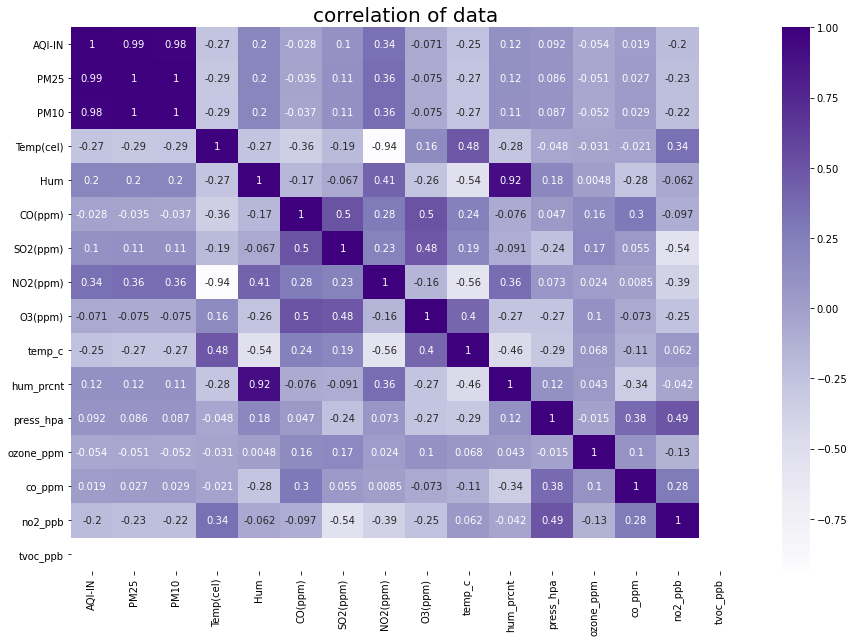

In [160]:
plt.rcParams['figure.figsize'] = (15, 10)
hm = sns.heatmap(M1[['AQI-IN',
 'PM25',
 'PM10',
 'Temp(cel)',
 'Hum',
 'CO(ppm)',
 'SO2(ppm)',
 'NO2(ppm)',
 'O3(ppm)',
 'temp_c',
 'hum_prcnt',
 'press_hpa',
 'ozone_ppm',
 'co_ppm',
 'no2_ppb',
 'tvoc_ppb']].corr(), annot = True, cmap = 'Purples')
hm.set_title(label = "correlation of data", fontsize = 20)

max correlation is at lag 1
max correlation is  0.307
Pearsons correlation: 0.296
MSE SO2:  135897.816173095
MAE SO2:  363.08812230215824
RMSE SO2:  368.6432098562172


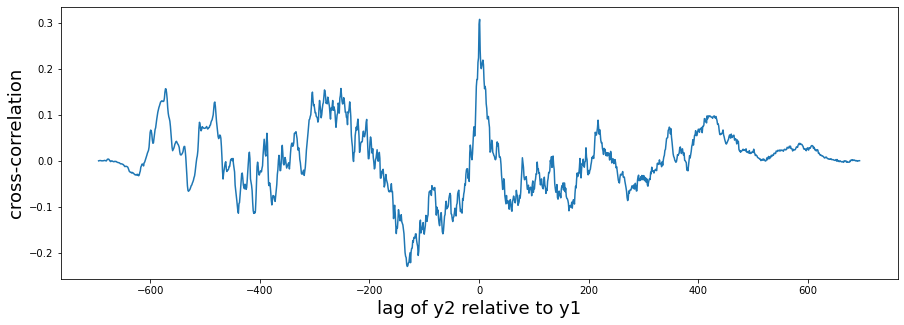

In [161]:
y1 = M1['CO(ppm)']
y2 = M1['co_ppm']
npts = len(M1)
lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
ccor = ccov / (npts * y2.std() * y1.std())
fig= plt.figure(figsize=(15,5))
plt.plot(lags, ccor)
plt.ylabel('cross-correlation', fontsize =18)
plt.xlabel('lag of y2 relative to y1', fontsize =18)

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)
print("max correlation is ", round(max(ccor),3))
corr, _ = pearsonr(y2, y1) 
print('Pearsons correlation: %.3f' % corr) 
MSE = mean_squared_error( y1, y2)
MAE = mean_absolute_error(y1,y2)
print("MSE SO2: ", MSE)
print("MAE SO2: ", MAE)
print("RMSE SO2: ", np.sqrt(mean_squared_error(y1, y2)))


CO:
Prana CO and Megasense device 76 CO = (0.3)

NO2:
Prana NO2 and Megasense device 76 NO2 = (-0.39)

O3:
Prana O3 and Megasense device 76 O3 = (0.1)

Temp:
Prana Temp and Megasense device 76 Temp = (0.48)

RH:
Prana RH and Megasense device 76 RH = (0.92)

# Lab experiments 

# Gases

In [39]:
df1 = pd.read_csv('Aero_gases_labexp.csv', parse_dates = ['created_at'])

In [40]:
len(df1)

1055

In [41]:
df1.dtypes

created_at     datetime64[ns]
 CO(ppm)              float64
 NO2(ppm)             float64
CO_1                  float64
SO2_1                 float64
CO_2                  float64
CO_3                  float64
Temperature           float64
RH                    float64
SO2_2                 float64
SO2_3                 float64
dtype: object

In [12]:
def lag_correlation(y1, y2):
    npts = len(y1)
    lags = np.arange(-npts + 1, npts)
    ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
    ccor = ccov / (npts * y2.std() * y1.std())
    fig= plt.figure(figsize=(15,5))
    plt.plot(lags, ccor)
    plt.ylabel('cross-correlation',fontsize =18)
    plt.xlabel('lag of y2 relative to y1', fontsize = 18)
    
    maxlag = lags[np.argmax(ccor)]
    print("max correlation is at lag %d" % maxlag)
    maxcorr = round(max(ccor),3)
    print("max correlation is ", round(max(ccor),3))
    corr, _ = pearsonr(y2, y1) 
    print('Pearsons correlation: %.3f' % corr) 
    MSE = mean_squared_error(y1, y2)
    MAE = mean_absolute_error(y1, y2)
    RMSE = np.sqrt(MSE)
    print("MSE : ", MSE)
    print("MAE : ", MAE)
    print("RMSE : ", RMSE)
    return

max correlation is at lag -290
max correlation is  0.41
Pearsons correlation: 0.039
MSE :  1577982.9071311604
MAE :  823.6758085308057
RMSE :  1256.177896291429
max correlation is at lag 0
max correlation is  0.507
Pearsons correlation: 0.508
MSE :  2099518.111728209
MAE :  976.3128156862745
RMSE :  1448.9713978295806


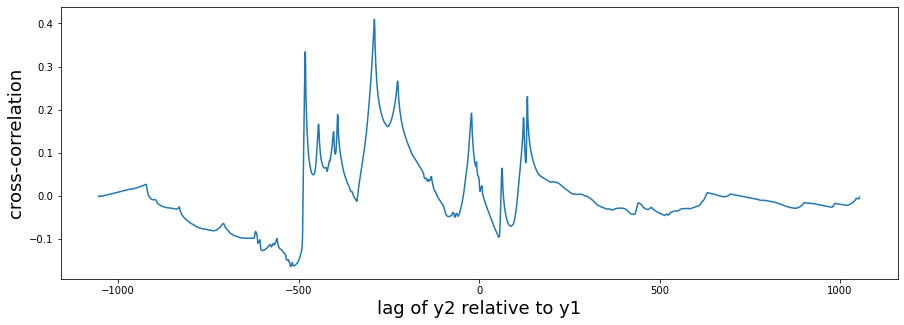

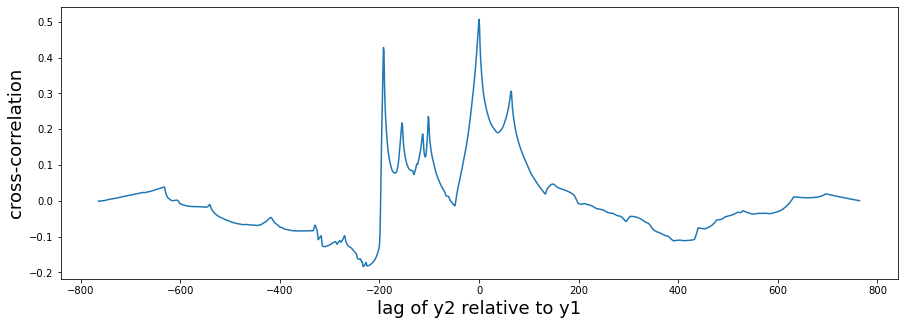

In [43]:
lag_correlation(df1[' CO(ppm)'], df1['CO_1'])
df1['CO_1_shift'] = df1['CO_1'].shift(290)
df1_1 = df1.dropna()
lag_correlation(df1_1[' CO(ppm)'], df1_1['CO_1_shift'])

max correlation is at lag 6
max correlation is  0.957
Pearsons correlation: 0.398
MSE :  530.9344381317536
MAE :  19.36797440758294
RMSE :  23.042014628320885
max correlation is at lag 0
max correlation is  0.974
Pearsons correlation: 0.975
MSE :  355.2990195652174
MAE :  17.425678524374177
RMSE :  18.84937716650652


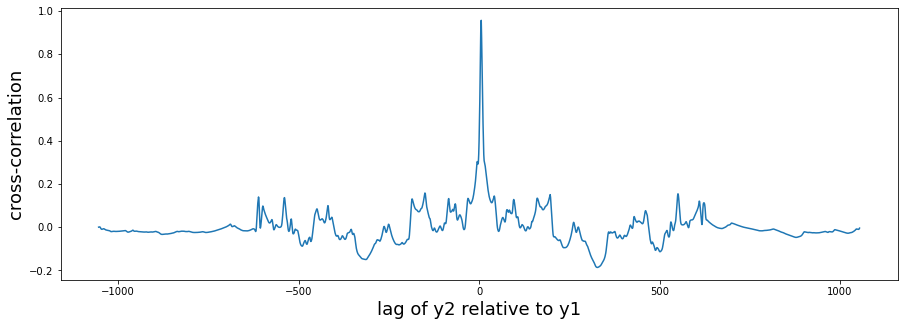

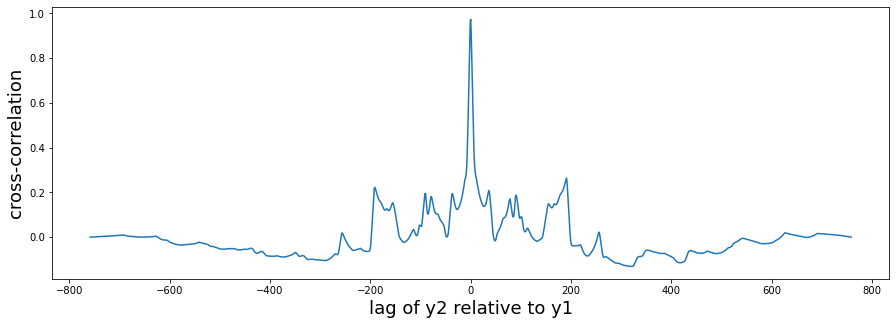

In [44]:
lag_correlation(df1[' CO(ppm)'], df1['CO_3'])
df1['CO_3_shift'] = df1['CO_3'].shift(-6)
df1_1 = df1.dropna()
lag_correlation(df1_1[' CO(ppm)'], df1_1['CO_3_shift'])

In [46]:
list(df1_1)

['created_at',
 ' CO(ppm)',
 ' NO2(ppm)',
 'CO_1',
 'SO2_1',
 'CO_2',
 'CO_3',
 'Temperature',
 'RH',
 'SO2_2',
 'SO2_3',
 'CO_1_shift',
 'CO_3_shift']

Text(0.5, 1.0, 'correlation of data')

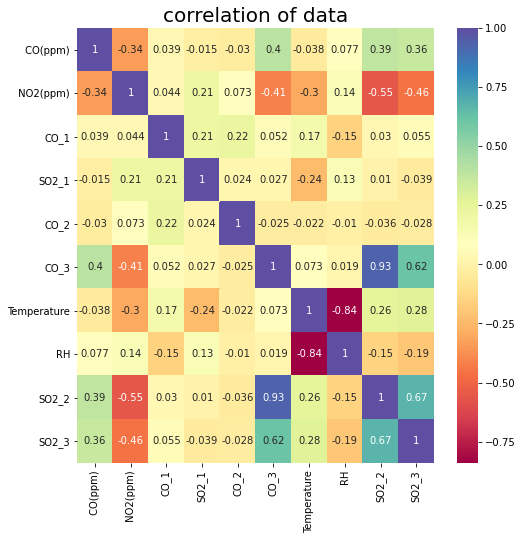

In [51]:
plt.rcParams['figure.figsize'] = (8, 8)
hm = sns.heatmap(df1[[' CO(ppm)',
 ' NO2(ppm)',
 'CO_1',
 'SO2_1',
 'CO_2',
 'CO_3',
 'Temperature',
 'RH',
 'SO2_2',
 'SO2_3']].corr(), annot = True, cmap = 'Spectral')
hm.set_title(label = "correlation of data", fontsize = 20)

Text(0.5, 1.0, 'correlation of data')

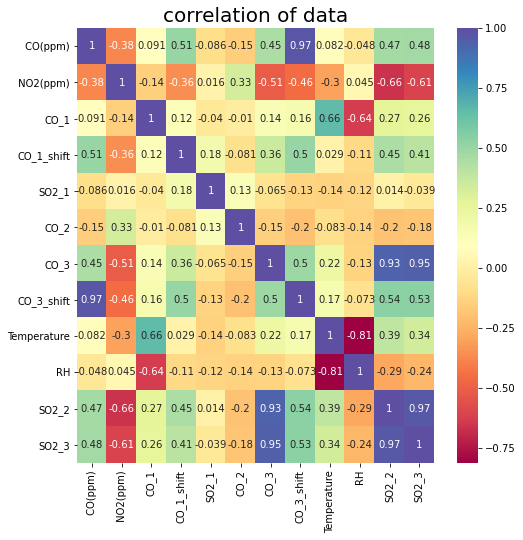

In [52]:
plt.rcParams['figure.figsize'] = (8, 8)
hm = sns.heatmap(df1_1[[' CO(ppm)',
 ' NO2(ppm)',
 'CO_1',
 'CO_1_shift',
 'SO2_1',
 'CO_2',
 'CO_3',
 'CO_3_shift',
 'Temperature',
 'RH',
 'SO2_2',
 'SO2_3']].corr(), annot = True, cmap = 'Spectral')
hm.set_title(label = "correlation of data", fontsize = 20)

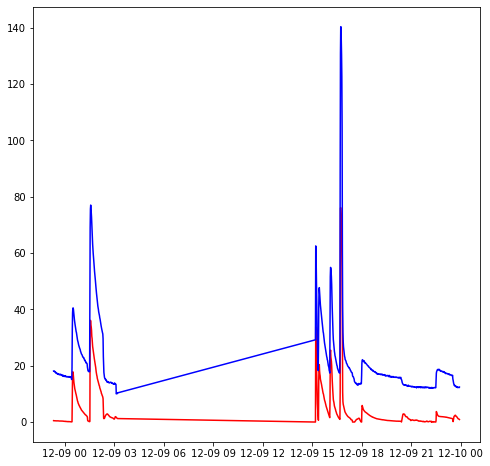

In [53]:
x = df1_1['created_at']
y1 = df1_1[' CO(ppm)']
y2 = df1_1['CO_3_shift']
plt.plot(x, y1, 'r')
plt.plot(x,y2, 'b')
plt.show()

max correlation is at lag 0
max correlation is  0.97
Pearsons correlation: 0.972
MSE :  0.31312680764163375
MAE :  0.49200395256916984
RMSE :  0.5595773473270998


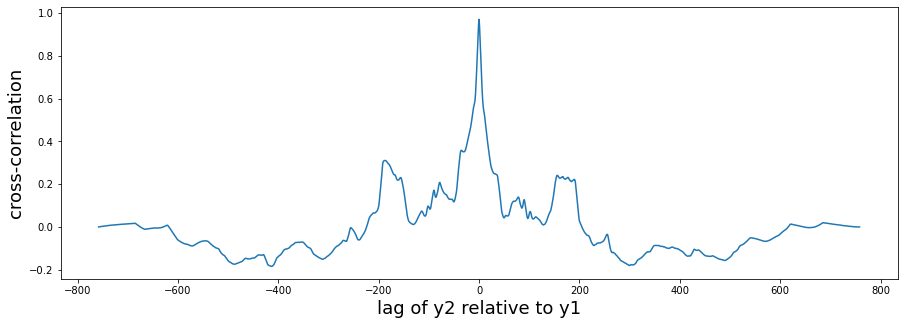

In [54]:
lag_correlation(df1_1['SO2_2'], df1_1['SO2_3'])

Coefficients:  [0.47655747]
Intercept:  -6.2263225615689946
R2  0.8841402442792818
MAE of simple linear regression of  1.095233442046619
MSE of simple linear regression 1.8193181276105357
RMSE of simple linear regression 1.3488210139268055
Test data Spearman correlation of simple linear regression: 0.686
Test data Pearson correlation Random Forest: 0.941


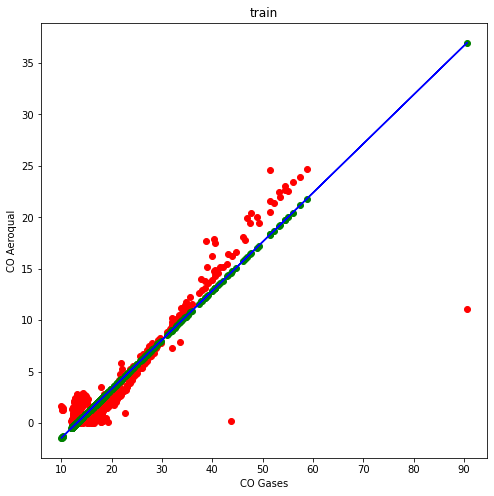

In [58]:
X = df1_2[['CO_3_shift']]
y = df1_2[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, shuffle= True,random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,1))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

plt.scatter(X_train,y_train ,color = 'red')
plt.scatter(X_train,regressor.predict(X_train) ,color = 'green')
plt.plot(X_train, regressor.predict(X_train), color = 'blue')
plt.xlabel('CO Gases')
plt.ylabel('CO Aeroqual')
plt.title("train")
plt.show()

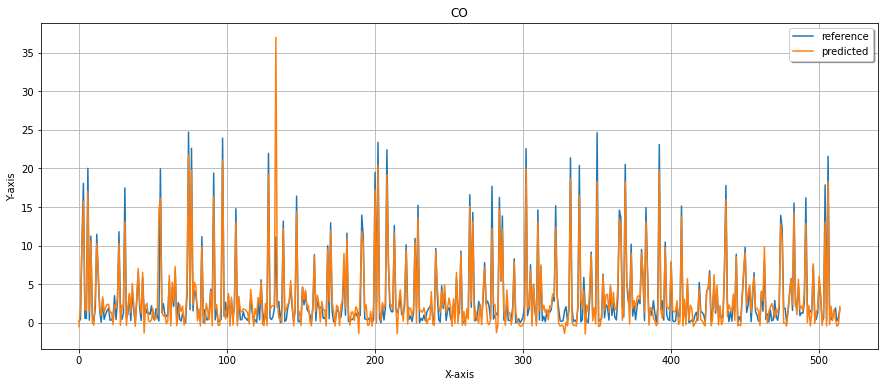

In [59]:
x_ax = range(len(y_train))
plt.figure(figsize = (15, 6))
plt.plot(x_ax, y_train, label="reference")
plt.plot(x_ax, regressor.predict(X_train), label="predicted")
#plt.plot(x_ax, X_train, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
x_ax = range(len(y_train))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_train, label="reference")
plt.plot(x_ax, regressor.predict(X_train), label="predicted")
#plt.plot(x_ax, X_train, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [60]:
max(df1_2[' CO(ppm)'])

24.71

In [56]:
df1_2 = df1_1[df1_1[' CO(ppm)']<25]

In [57]:
len(df1_2)

736

## Megasense


In [27]:
aero = pd.read_csv('Aeroqual_data//aeroqual_2-9th_dec.csv', parse_dates = ['Date Time'])

In [4]:
aero.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1870 entries, 0 to 1869
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date Time  1870 non-null   datetime64[ns]
 1    CO(ppm)   1751 non-null   float64       
 2    NO2(ppm)  1394 non-null   float64       
 3    O3(ppm)   113 non-null    float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 58.6 KB


In [30]:
aco = aero.dropna(subset=[' CO(ppm)'])
len(aco)

1751

In [31]:
aco = aco[aco[' CO(ppm)']<26]
len(aco)

1718

In [2]:
d1 = pd.read_csv('Megasense_&_Aeroqual_data//Device76_2-9th_December.csv', parse_dates = ['Date Time']).dropna(how = 'all')
d2 = pd.read_csv('Megasense_&_Aeroqual_data//Device61_2-9th_December.csv', parse_dates = ['Date Time']).dropna(how = 'all')
d3 = pd.read_csv('Megasense_&_Aeroqual_data//DeviceC5_2-9th_December.csv', parse_dates = ['Date Time']).dropna(how = 'all')


In [3]:

d1['Date'] = d1['Date Time'].dt.date
d1['Time'] = d1['Date Time'].dt.time


In [4]:
d1['Date'] = pd.to_datetime(d1['Date'])
type(d1['Date'])


pandas.core.series.Series

In [5]:
len(d1)

1612

In [178]:
#start_date = pd.to_datetime("2021-12-02").date()
#end_date = pd.to_datetime("2021-12-08").date()
mask = (d1['Date'] > "2021-12-02") & (d1['Date'] < "2021-12-08")

dm1 = d1.loc[mask]

In [6]:
mask1 = (d1['Date']>= "2021-12-08")
dl1  = d1.loc[mask1]
len(dl1)

1042

In [12]:


dm1 = dm1.dropna()


NameError: name 'dm1' is not defined

In [9]:
dl1 = dl1[dl1[' CO(ppm)']<25]

In [22]:
d1 = d1.drop([' O3(ppm)'], axis = 1).dropna()

In [7]:
plt.rcParams['figure.figsize'] = (6, 5)
hm = sns.heatmap(dl1[[' CO(ppm)',' NO2(ppm)',
 'temp_c',
 'hum_prcnt',
 'press_hpa',
 'co_ppm',
 'co_shift',
 'no2_ppb' ]].corr(), annot = True, cmap = 'Spectral')
hm.set_title(label = "correlation of data", fontsize = 20)

KeyError: "['co_shift'] not in index"

### CO

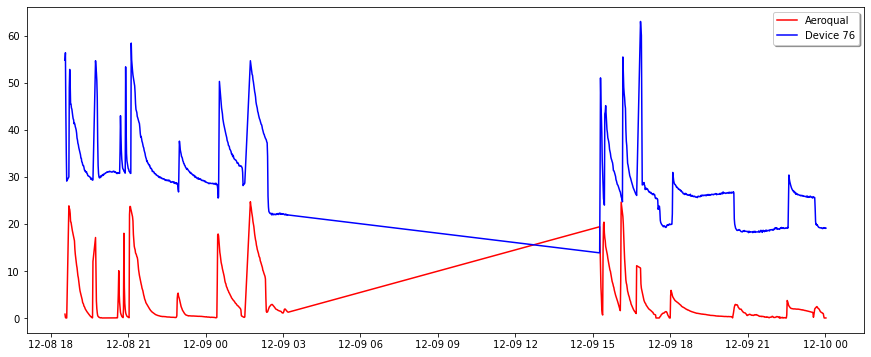

In [10]:
# Device 76
plt.figure(figsize = (15, 6))
x = dl1['Date Time']
y1 = dl1[' CO(ppm)']
y2 = dl1['co_ppm']/10
plt.plot(x, y1, 'r', label = 'Aeroqual')
plt.plot(x, y2, 'b', label = 'Device 76')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.show()

In [15]:
dl1['co_shift'] = dl1['co_ppm'].shift(-3)
dl1 = dl1.dropna(subset = {'co_shift'})


<ipython-input-15-2abfc6555ffc>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dl1['co_shift'] = dl1['co_ppm'].shift(-3)


max correlation is at lag 0
max correlation is  0.731
Pearsons correlation: 0.732
MSE :  89122.11426699505
MAE :  288.4958188118812
RMSE :  298.53327162478064


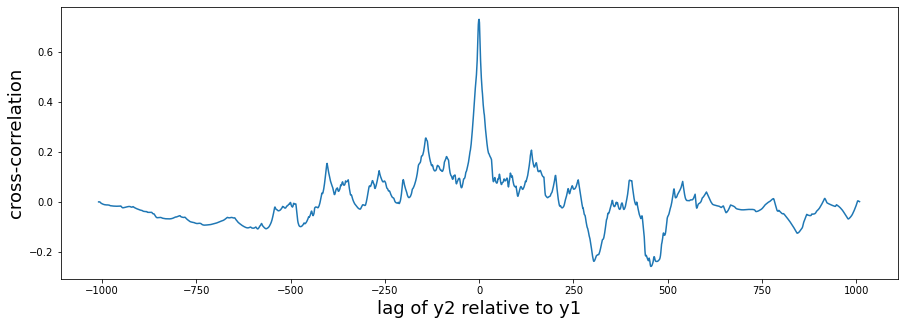

In [16]:
lag_correlation(dl1[' CO(ppm)'], dl1['co_shift'])

max correlation is at lag 3
max correlation is  0.722
Pearsons correlation: 0.654
MSE :  89711.6249584452
MAE :  289.1710533070089
RMSE :  299.51898931193864


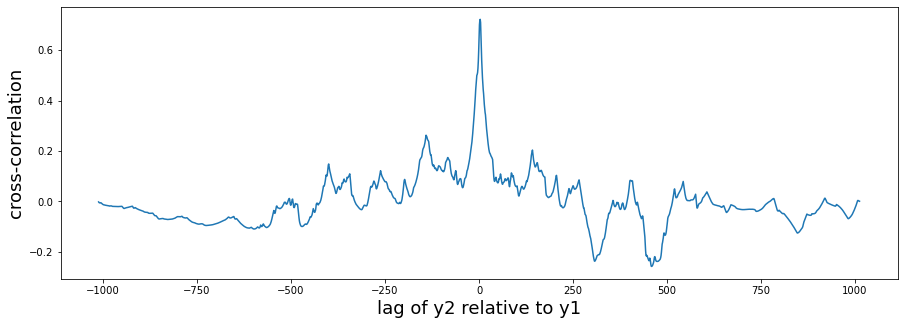

In [14]:
#dm1 = dm1.dropna(subset = {'co_shift'})
lag_correlation(dl1[' CO(ppm)'], dl1['co_ppm'])

Coefficients:  [0.04972198]
Intercept:  -11.081674562998282
R2  0.47281096321293214
MAE of simple linear regression of  2.661325790917368
MSE of simple linear regression 13.075672607004233
RMSE of simple linear regression 3.6160299510657032
Test data Spearman correlation of simple linear regression: 0.427
Test data Pearson correlation simple linear regression: 0.696


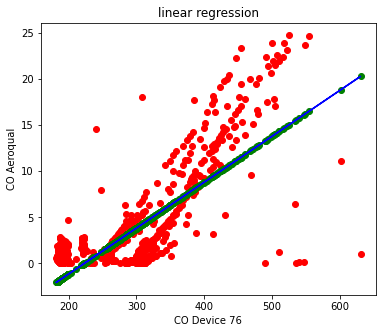

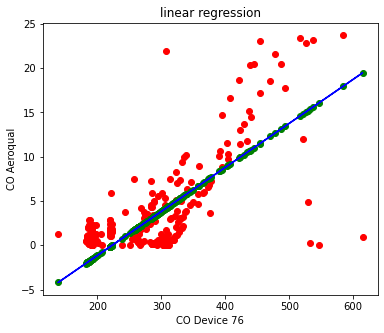

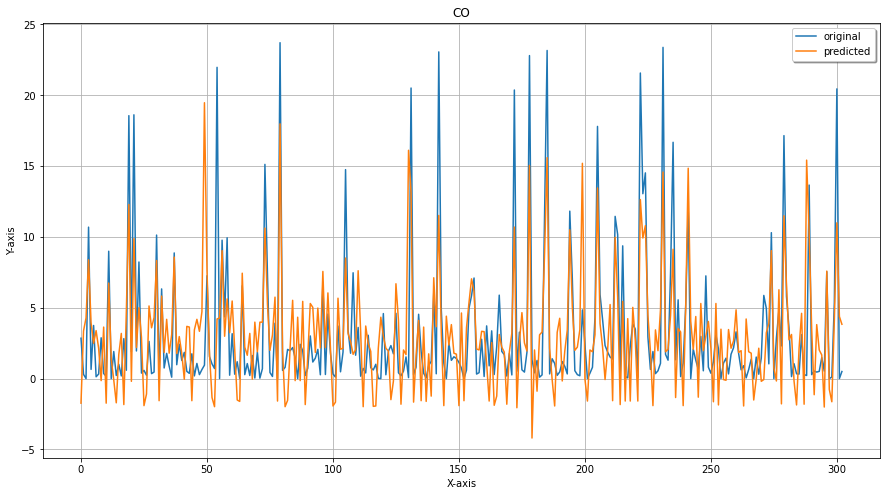

In [55]:
dl1 = dl1.dropna(subset = {'co_shift'})
X = dl1[['co_shift']]
y = dl1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, shuffle= True,random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,1))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation simple linear regression: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression
    

    


plt.scatter(X_train,y_train ,color = 'red')
plt.scatter(X_train,regressor.predict(X_train) ,color = 'green')
plt.plot(X_train, regressor.predict(X_train), color = 'blue')
plt.xlabel('CO Device 76')
plt.ylabel('CO Aeroqual')
plt.title("linear regression")
plt.show()

plt.scatter(X_test,y_test ,color = 'red')
plt.scatter(X_test,regressor.predict(X_test) ,color = 'green')
plt.plot(X_test, regressor.predict(X_test), color = 'blue')
plt.xlabel('CO Device 76')
plt.ylabel('CO Aeroqual')
plt.title("linear regression")
plt.show()

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

## Random Forest

In [68]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

r2 = []
mae = []
mse = []
rmse= []
pear = []
spear= []
n = list(range(1, 101))
for i in n:
    regr = RandomForestRegressor(max_depth=i, random_state=0)
    regr.fit(X_train, y_train)
    test_y_hat = regr.predict(X_test)
    R2_score = r2_score(y_test,test_y_hat).round(3)
    MAE = metrics.mean_absolute_error(y_test,test_y_hat).round(3)
    MSE = mean_squared_error(y_test, test_y_hat).round(3)
    RMSE = np.sqrt(mean_squared_error(y_test, test_y_hat)).round(3)
    PEAR = pearsonr(y_test, test_y_hat)
    SPEAR = spearman = spearmanr(y_test, test_y_hat)
    r2.append(R2_score)
    mae.append(MAE)
    mse.append(MSE)
    rmse.append(RMSE)
    pear.append(PEAR[0].round(3))
    spear.append(SPEAR[0].round(3))
    
fig = make_subplots(rows=2, cols=3,
shared_xaxes=False,
vertical_spacing=0.05)

fig.add_trace(go.Scatter(x = n, y=r2, name = 'R2_score', xaxis="x1",yaxis = 'y1'),
row=1, col=1)
fig.add_trace(go.Scatter(x = n, y=mae, name = 'MAE', xaxis="x2",yaxis = 'y2'),
row=1, col=2)
fig.add_trace(go.Scatter(x = n, y=mse, name = 'MSE', xaxis="x3",yaxis = 'y3'),
row=1, col=3)
fig.add_trace(go.Scatter(x = n, y=rmse, name = 'RMSE', xaxis="x4",yaxis = 'y4'),
row=2, col=1)
fig.add_trace(go.Scatter(x = n, y=pear, name = 'Pearson correlation', xaxis="x5",yaxis = 'y5'),
row=2, col=2)
fig.add_trace(go.Scatter(x = n, y=spear, name = 'Spearman Corelation', xaxis="x6",yaxis = 'y6'),
row=2, col=3)




fig.update_layout(height=600, width=1000,
title_text="Random forest CO")





# Create axis objects
fig.update_layout(   
xaxis1=dict(title ="n_estimators"),
yaxis1 =dict(title="R2 score"),
xaxis2=dict(title ="n_estimators"),
yaxis2 =dict(title="MAE"),
xaxis3=dict(title ="n_estimators"),
yaxis3 =dict(title="MSE"),
xaxis4=dict(title ="n_estimators"),
yaxis4 =dict(title="RMSE"),
xaxis5=dict(title ="n_estimators"),
yaxis5 =dict(title="Pearson correlation"),
xaxis6=dict(title ="n_estimators"),
yaxis6 =dict(title="Spearman Correaltion"),
)

fig.show()
#fig.write_html("November_1Hour_pm10.html")    


In [58]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
X = dl1[['co_shift']]
y = dl1[' CO(ppm)']
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, shuffle= True,random_state= 0)

regr = RandomForestRegressor(max_depth=3, random_state=0)
regr.fit(X_train, y_train)
test_y_hat = regr.predict(X_test)

print('R2_score: ', r2_score(y_test,test_y_hat))

print("MAE of simple Random Forestregression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple Random Forestregression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple Random Forestregression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple Random Forestregression: {spearman[0]:.3}')
print(f'Test data Pearson correlation simple Random Forestregression: {pearson[0]:.3}')

R2_score:  0.6973443052929832
MAE of simple Random Forestregression of  1.615052499720687
MSE of simple Random Forestregression 7.506656057858775
RMSE of simple Random Forestregression 2.7398277423697235
Test data Spearman correlation of simple Random Forestregression: 0.588
Test data Pearson correlation simple Random Forestregression: 0.836


## Decision Tree Regression

In [44]:
from sklearn.tree import DecisionTreeRegressor
regressor = DecisionTreeRegressor(random_state = 0) 
  
# fit the regressor with X and Y data
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)
print('R2_score: ', r2_score(y_test,y_pred))

print("MAE of Decision tree regression of ", metrics.mean_absolute_error(y_test,y_pred))

    #MSE
print("MSE of Decision tree regression", mean_squared_error(y_test, y_pred))

    #RMSE
print("RMSE of Decision tree regression", np.sqrt(mean_squared_error(y_test, y_pred)))

spearman = spearmanr(y_test, y_pred)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, y_pred)

print(f'Test data Spearman correlation of Decision tree regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation Decision tree regression: {pearson[0]:.3}')

R2_score:  0.5227257939696087
MAE of Decision tree regression of  1.760745638849599
MSE of Decision tree regression 11.837653718777727
RMSE of Decision tree regression 3.440589152859976
Test data Spearman correlation of Decision tree regression: 0.578
Test data Pearson correlation Decision tree regression: 0.755


## SVM Regression

In [75]:
from sklearn.svm import SVR

# Fit regression model
svr_rbf = SVR(kernel="rbf", C=100, gamma=0.1, epsilon=0.1)
svr_lin = SVR(kernel="linear", C=100, gamma=0.1)
svr_poly = SVR(kernel="poly", C=100, gamma="auto", degree=3, epsilon=0.1, coef0=1)

In [69]:
# SVR RBF (Radial basis function) kernel
svr_rbf.fit(X_train, y_train)
y_pred1 = svr_rbf.predict(X_test)
print('R2_score: ', r2_score(y_test,y_pred1))

print("MAE of SVR RBF kernel: ", metrics.mean_absolute_error(y_test,y_pred1))

    #MSE
print("MSE of SVR RBF kernel:", mean_squared_error(y_test, y_pred1))

    #RMSE
print("RMSE of SVR RBF kernel:", np.sqrt(mean_squared_error(y_test, y_pred1)))

spearman = spearmanr(y_test, y_pred1)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, y_pred1)

print(f'Test data Spearman correlation of SVR RBF kernel: {spearman[0]:.3}')
print(f'Test data Pearson correlation SVR RBF kernel: {pearson[0]:.3}')

R2_score:  0.5000511577702703
MAE of SVR RBF kernel:  1.65801989318866
MSE of SVR RBF kernel: 12.400044244256781
RMSE of SVR RBF kernel: 3.521369654588507
Test data Spearman correlation of SVR RBF kernel: 0.626
Test data Pearson correlation SVR RBF kernel: 0.735


In [74]:
# SVR Linear Kernel
svr_lin.fit(X_train, y_train)
y_pred2 = svr_lin.predict(X_test)
print('R2_score: ', r2_score(y_test,y_pred2))

print("MAE of SVR Linear kernel: ", metrics.mean_absolute_error(y_test,y_pred2))

    #MSE
print("MSE of SVR Linear kernel:", mean_squared_error(y_test, y_pred2))

    #RMSE
print("RMSE of SVR Linear kernel:", np.sqrt(mean_squared_error(y_test, y_pred2)))

spearman = spearmanr(y_test, y_pred2)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, y_pred2)

print(f'Test data Spearman correlation of SVR Linear kernel: {spearman[0]:.3}')
print(f'Test data Pearson correlation SVR Linear kernel: {pearson[0]:.3}')

R2_score:  0.4371523415288191
MAE of SVR Linear kernel:  2.4411221483124645
MSE of SVR Linear kernel: 13.960100070822692
RMSE of SVR Linear kernel: 3.7363217301007006
Test data Spearman correlation of SVR Linear kernel: 0.427
Test data Pearson correlation SVR Linear kernel: 0.696


In [ ]:
# SVR Polynomial Kernel
svr_poly.fit(X_train, y_train)
y_pred3 = svr_poly.predict(X_test)

print('R2_score: ', r2_score(y_test,y_pred3))

print("MAE of SVR Polynomial kernel: ", metrics.mean_absolute_error(y_test,y_pred3))

    #MSE
print("MSE of SVR Polynomial kernel:", mean_squared_error(y_test, y_pred3))

    #RMSE
print("RMSE of SVR Polynomial kernel:", np.sqrt(mean_squared_error(y_test, y_pred3)))

spearman = spearmanr(y_test, y_pred3)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, y_pred3)

print(f'Test data Spearman correlation of SVR Polynomial kernel: {spearman[0]:.3}')
print(f'Test data Pearson correlation SVR Polynomial kernel: {pearson[0]:.3}')

In [ ]:
from sklearn.inspection import permutation_importance
from sklearn import datasets, ensemble
params = {
    "n_estimators": 500,
    "max_depth": 4,
    "min_samples_split": 5,
    "learning_rate": 0.01,
    "loss": "squared_error",
}

reg = ensemble.GradientBoostingRegressor(**params)
reg.fit(X_train, y_train)

y_pred4 = reg.predict(X_test)

print('R2_score: ', r2_score(y_test,y_pred4))

print("MAE of SVR Polynomial kernel: ", metrics.mean_absolute_error(y_test,y_pred4))

    #MSE
print("MSE of SVR Polynomial kernel:", mean_squared_error(y_test, y_pred4))

    #RMSE
print("RMSE of SVR Polynomial kernel:", np.sqrt(mean_squared_error(y_test, y_pred4)))

spearman = spearmanr(y_test, y_pred4)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, y_pred4)

print(f'Test data Spearman correlation of SVR Polynomial kernel: {spearman[0]:.3}')
print(f'Test data Pearson correlation SVR Polynomial kernel: {pearson[0]:.3}')

## Polynomial Regression

Polynomial linear regression MAE: 1.662000194285788
Polynomial linear regression MSE: 7.842036670377684
Polynomial linear regression RMSE: 2.8003636675220744
Polynomial linear regression R-2 score: 0.684
Polynomial linear regression Spearman correlation: 0.352
Random Forest Pearson correlation: 0.828


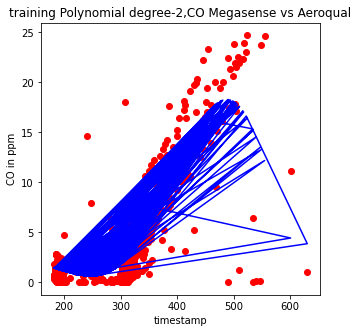

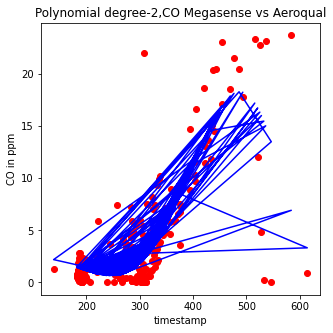

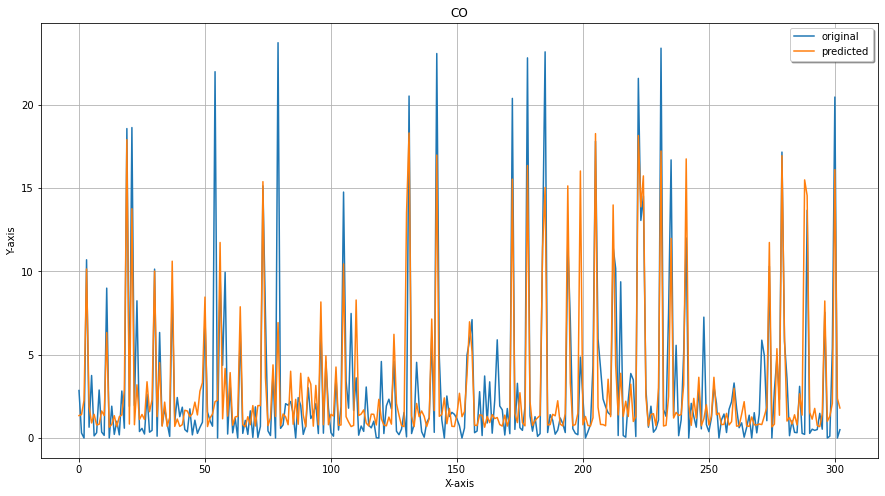

In [137]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=9)
X_poly = poly_reg.fit_transform(X_train)
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

y_pred = pol_reg.predict(poly_reg.fit_transform(X_test))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, y_pred))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))



test_score = r2_score(y_test, y_pred)
spearman = spearmanr(y_test, y_pred)
pearson = pearsonr(y_test, y_pred)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
print(f'Random Forest Pearson correlation: {pearson[0]:.3}')
plt.figure(figsize = (5, 5))
plt.scatter(X_train, y_train, color='red')
plt.plot(X_train, pol_reg.predict(poly_reg.fit_transform(X_train)), color='blue')
plt.title('training Polynomial degree-2,CO Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('CO in ppm')
plt.show()
plt.figure(figsize = (5, 5))
plt.scatter(X_test, y_test, color='red')
plt.plot(X_test, pol_reg.predict(poly_reg.fit_transform(X_test)), color='blue')
plt.title('Polynomial degree-2,CO Megasense vs Aeroqual')
plt.xlabel('timestamp')
plt.ylabel('CO in ppm')
plt.show()
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, y_pred, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Coefficients:  [ 0.04997008 -0.23940481]
Intercept:  -3.029903324627284
R2  0.47983302866979727
MAE of simple linear regression of  2.60546303677102
MSE of simple linear regression 12.90150694244773
RMSE of simple linear regression 3.591866776823401
Test data Spearman correlation of simple linear regression: 0.428
Test data Pearson correlation simple linear regression: 0.701


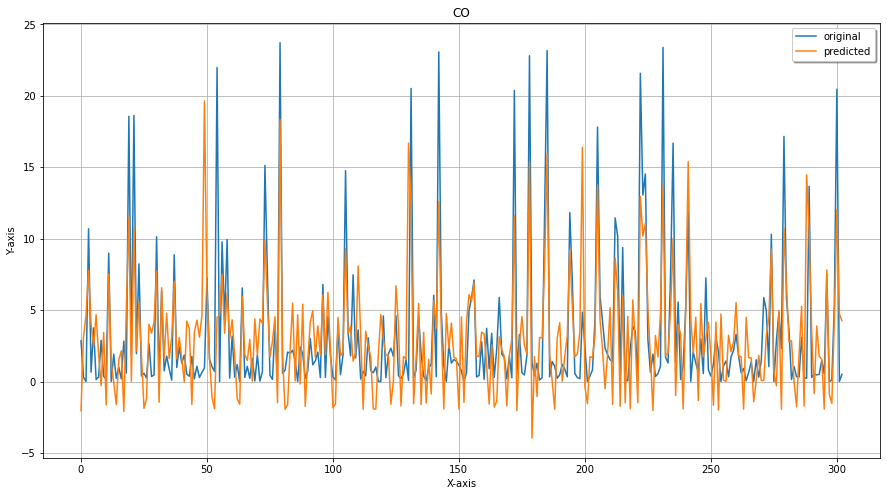

In [138]:
dl1 = dl1.dropna(subset = {'co_shift'})
X = dl1[['co_shift', 'temp_c']]
y = dl1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, shuffle= True,random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation simple linear regression: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

'''plt.scatter(X_train,y_train ,color = 'red')
plt.scatter(X_train,regressor.predict(X_train) ,color = 'green')
plt.plot(X_train, regressor.predict(X_train), color = 'blue')
plt.xlabel('CO Device 76')
plt.ylabel('CO Aeroqual')
plt.title("linear regression")
plt.show()

plt.scatter(X_test,y_test ,color = 'red')
plt.scatter(X_test,regressor.predict(X_test) ,color = 'green')
plt.plot(X_test, regressor.predict(X_test), color = 'blue')
plt.xlabel('CO Device 76')
plt.ylabel('CO Aeroqual')
plt.title("linear regression")
plt.show()'''

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Polynomial linear regression MAE: 1.3635550979420918
Polynomial linear regression MSE: 6.558986207269539
Polynomial linear regression RMSE: 2.561051777545612
Polynomial linear regression R-2 score: 0.736
Polynomial linear regression Spearman correlation: 0.638
Random Forest Pearson correlation: 0.86


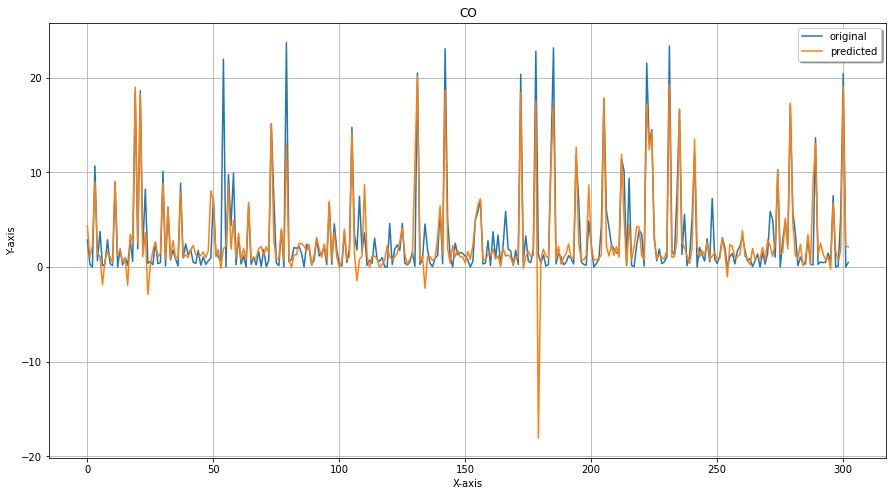

In [143]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=6)
X_poly = poly_reg.fit_transform(X_train)
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

y_pred = pol_reg.predict(poly_reg.fit_transform(X_test))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, y_pred))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))



test_score = r2_score(y_test, y_pred)
spearman = spearmanr(y_test, y_pred)
pearson = pearsonr(y_test, y_pred)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, y_pred, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Coefficients:  [0.04954661 0.0227781 ]
Intercept:  -11.864380408683877
R2  0.47194003111191096
MAE of simple linear regression of  2.6663312391022522
MSE of simple linear regression 13.097274010336303
RMSE of simple linear regression 3.619015613441907
Test data Spearman correlation of simple linear regression: 0.429
Test data Pearson correlation simple linear regression: 0.695


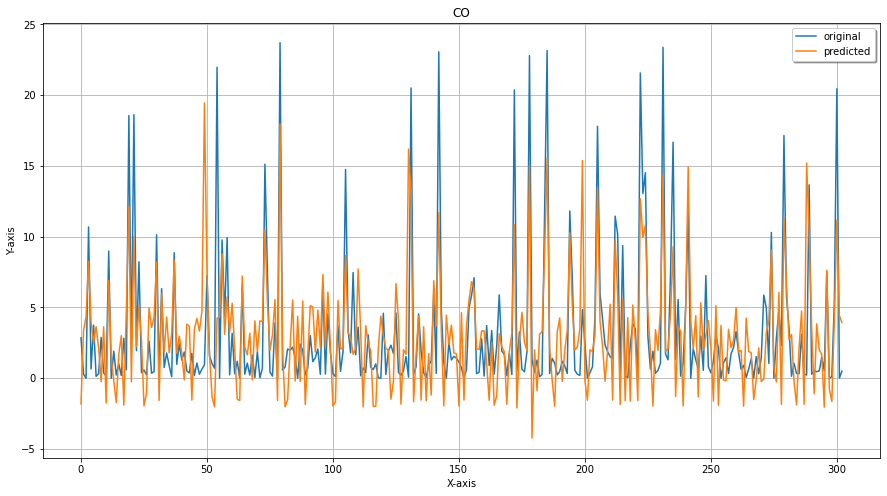

In [144]:
dl1 = dl1.dropna(subset = {'co_shift'})
X = dl1[['co_shift', 'hum_prcnt']]
y = dl1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, shuffle= True,random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation simple linear regression: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

'''plt.scatter(X_train,y_train ,color = 'red')
plt.scatter(X_train,regressor.predict(X_train) ,color = 'green')
plt.plot(X_train, regressor.predict(X_train), color = 'blue')
plt.xlabel('CO Device 76')
plt.ylabel('CO Aeroqual')
plt.title("linear regression")
plt.show()

plt.scatter(X_test,y_test ,color = 'red')
plt.scatter(X_test,regressor.predict(X_test) ,color = 'green')
plt.plot(X_test, regressor.predict(X_test), color = 'blue')
plt.xlabel('CO Device 76')
plt.ylabel('CO Aeroqual')
plt.title("linear regression")
plt.show()'''

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Polynomial linear regression MAE: 1.3211850853546792
Polynomial linear regression MSE: 7.147836386345176
Polynomial linear regression RMSE: 2.6735437879984643
Polynomial linear regression R-2 score: 0.712
Polynomial linear regression Spearman correlation: 0.614
Random Forest Pearson correlation: 0.848


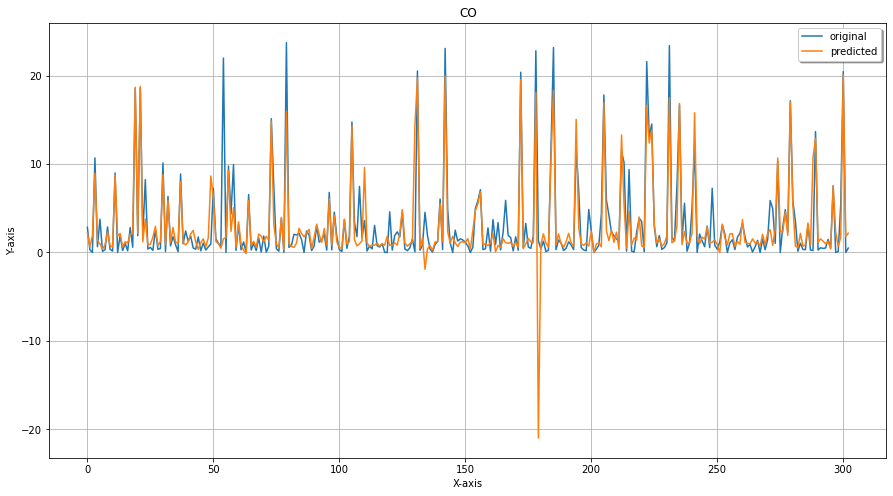

In [148]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=6)
X_poly = poly_reg.fit_transform(X_train)
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

y_pred = pol_reg.predict(poly_reg.fit_transform(X_test))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, y_pred))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))



test_score = r2_score(y_test, y_pred)
spearman = spearmanr(y_test, y_pred)
pearson = pearsonr(y_test, y_pred)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, y_pred, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Coefficients:  [ 0.04907886 -0.09221347]
Intercept:  76.38218893906091
R2  0.47394512462612415
MAE of simple linear regression of  2.6493849278670414
MSE of simple linear regression 13.04754242544208
RMSE of simple linear regression 3.612138206857827
Test data Spearman correlation of simple linear regression: 0.431
Test data Pearson correlation simple linear regression: 0.696


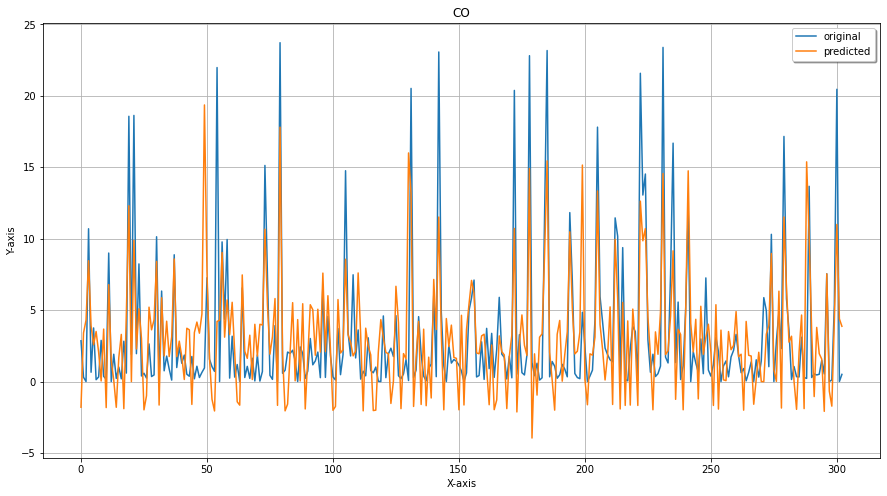

In [149]:
dl1 = dl1.dropna(subset = {'co_shift'})
X = dl1[['co_shift', 'press_hpa']]
y = dl1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, shuffle= True,random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation simple linear regression: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

'''plt.scatter(X_train,y_train ,color = 'red')
plt.scatter(X_train,regressor.predict(X_train) ,color = 'green')
plt.plot(X_train, regressor.predict(X_train), color = 'blue')
plt.xlabel('CO Device 76')
plt.ylabel('CO Aeroqual')
plt.title("linear regression")
plt.show()

plt.scatter(X_test,y_test ,color = 'red')
plt.scatter(X_test,regressor.predict(X_test) ,color = 'green')
plt.plot(X_test, regressor.predict(X_test), color = 'blue')
plt.xlabel('CO Device 76')
plt.ylabel('CO Aeroqual')
plt.title("linear regression")
plt.show()'''

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Polynomial linear regression MAE: 1.93701241366181
Polynomial linear regression MSE: 11.096596544569557
Polynomial linear regression RMSE: 3.3311554368671477
Polynomial linear regression R-2 score: 0.553
Polynomial linear regression Spearman correlation: 0.48
Random Forest Pearson correlation: 0.748


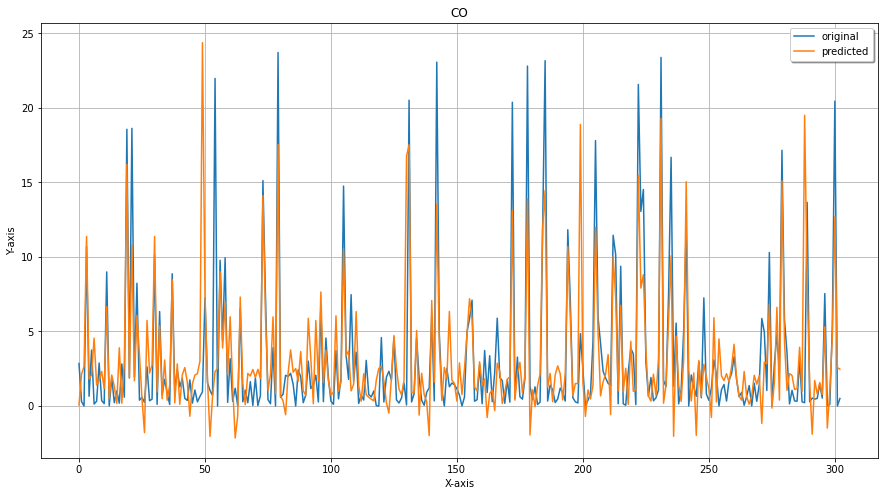

In [153]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=2)
X_poly = poly_reg.fit_transform(X_train)
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

y_pred = pol_reg.predict(poly_reg.fit_transform(X_test))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, y_pred))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))



test_score = r2_score(y_test, y_pred)
spearman = spearmanr(y_test, y_pred)
pearson = pearsonr(y_test, y_pred)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, y_pred, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Coefficients:  [ 0.05608681 -1.38730651 -0.63995454]
Intercept:  57.56710073377242
R2  0.5275951560907219
MAE of simple linear regression of  2.218973547557608
MSE of simple linear regression 11.716880750339952
RMSE of simple linear regression 3.4229929521312124
Test data Spearman correlation of simple linear regression: 0.485
Test data Pearson correlation simple linear regression: 0.731


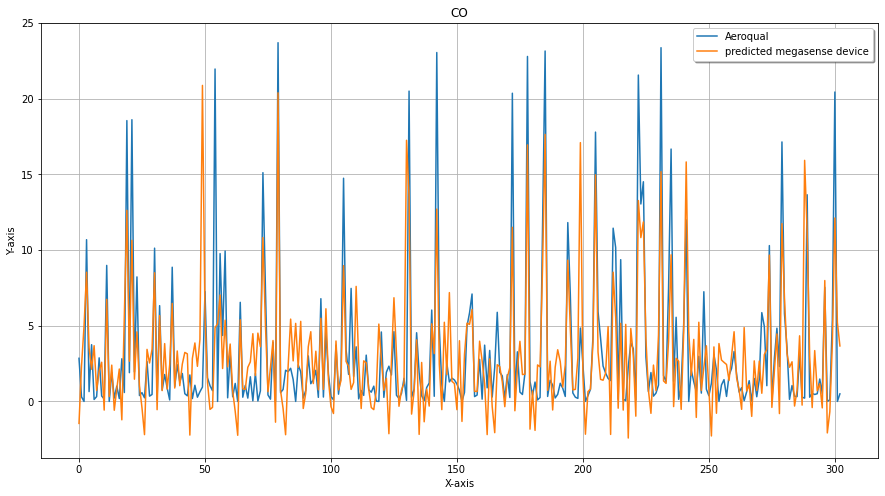

In [154]:
dl1 = dl1.dropna(subset = {'co_shift'})
X = dl1[['co_shift','temp_c','hum_prcnt']]
y = dl1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, shuffle= True,random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,3), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,3))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,3), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation simple linear regression: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

'''plt.scatter(X_train,y_train ,color = 'red')
plt.scatter(X_train,regressor.predict(X_train) ,color = 'green')
plt.plot(X_train, regressor.predict(X_train), color = 'blue')
plt.xlabel('CO Device 76')
plt.ylabel('CO Aeroqual')
plt.title("linear regression")
plt.show()

plt.scatter(X_test,y_test ,color = 'red')
plt.scatter(X_test,regressor.predict(X_test) ,color = 'green')
plt.plot(X_test, regressor.predict(X_test), color = 'blue')
plt.xlabel('CO Device 76')
plt.ylabel('CO Aeroqual')
plt.title("linear regression")
plt.show()'''

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="Aeroqual")
plt.plot(x_ax, test_y_hat, label="predicted megasense device")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Polynomial linear regression MAE: 1.997032058485314
Polynomial linear regression MSE: 11.862034633951803
Polynomial linear regression RMSE: 3.444130461227014
Polynomial linear regression R-2 score: 0.522
Polynomial linear regression Spearman correlation: 0.54
Random Forest Pearson correlation: 0.733


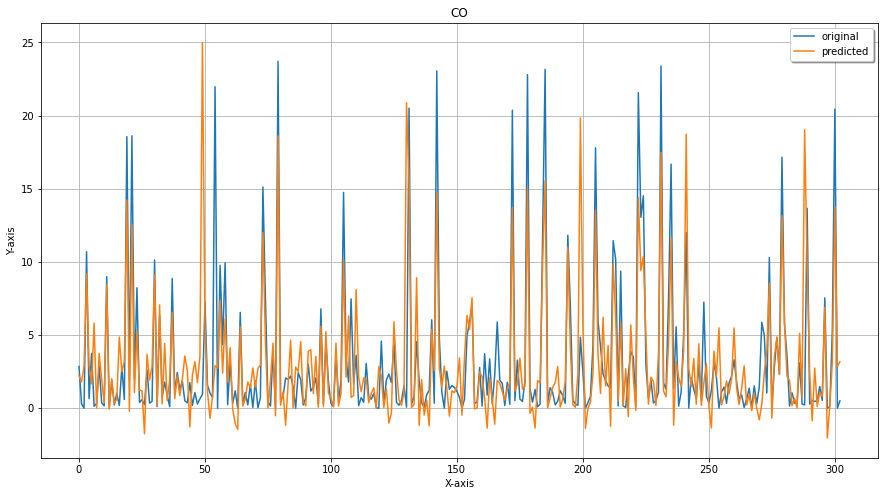

In [158]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=2)
X_poly = poly_reg.fit_transform(X_train)
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

y_pred = pol_reg.predict(poly_reg.fit_transform(X_test))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, y_pred))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))



test_score = r2_score(y_test, y_pred)
spearman = spearmanr(y_test, y_pred)
pearson = pearsonr(y_test, y_pred)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, y_pred, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Coefficients:  [ 0.05527388 -1.39026856 -0.64168759 -0.11891467]
Intercept:  170.51604573629592
R2  0.5274238377800577
MAE of simple linear regression of  2.2271180438102522
MSE of simple linear regression 11.721129894357594
RMSE of simple linear regression 3.423613572580526
Test data Spearman correlation of simple linear regression: 0.496
Test data Pearson correlation simple linear regression: 0.731


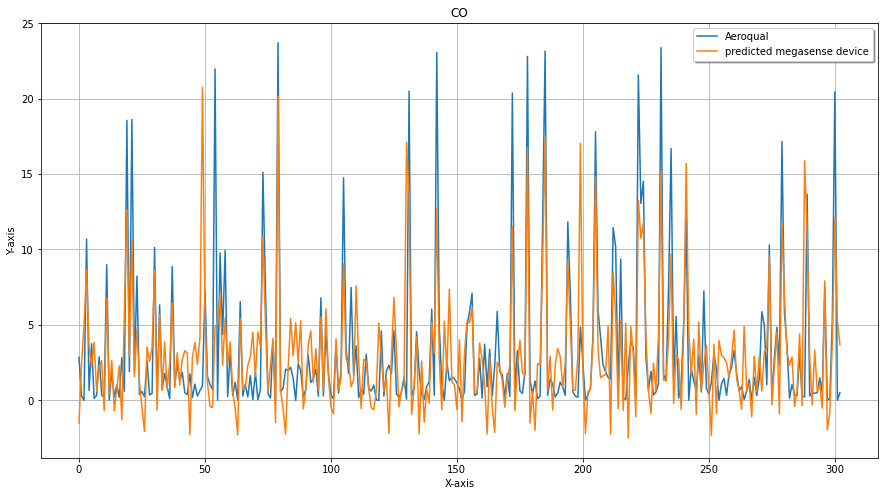

In [159]:
dl1 = dl1.dropna(subset = {'co_shift'})
X = dl1[['co_shift','temp_c','hum_prcnt', 'press_hpa']]
y = dl1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, shuffle= True,random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,4), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,4))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,4), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation simple linear regression: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

'''plt.scatter(X_train,y_train ,color = 'red')
plt.scatter(X_train,regressor.predict(X_train) ,color = 'green')
plt.plot(X_train, regressor.predict(X_train), color = 'blue')
plt.xlabel('CO Device 76')
plt.ylabel('CO Aeroqual')
plt.title("linear regression")
plt.show()

plt.scatter(X_test,y_test ,color = 'red')
plt.scatter(X_test,regressor.predict(X_test) ,color = 'green')
plt.plot(X_test, regressor.predict(X_test), color = 'blue')
plt.xlabel('CO Device 76')
plt.ylabel('CO Aeroqual')
plt.title("linear regression")
plt.show()'''

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="Aeroqual")
plt.plot(x_ax, test_y_hat, label="predicted megasense device")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Polynomial linear regression MAE: 1.8328764520069163
Polynomial linear regression MSE: 136.96547300412064
Polynomial linear regression RMSE: 11.703224897613506
Polynomial linear regression R-2 score: -4.52
Polynomial linear regression Spearman correlation: 0.865
Random Forest Pearson correlation: 0.38


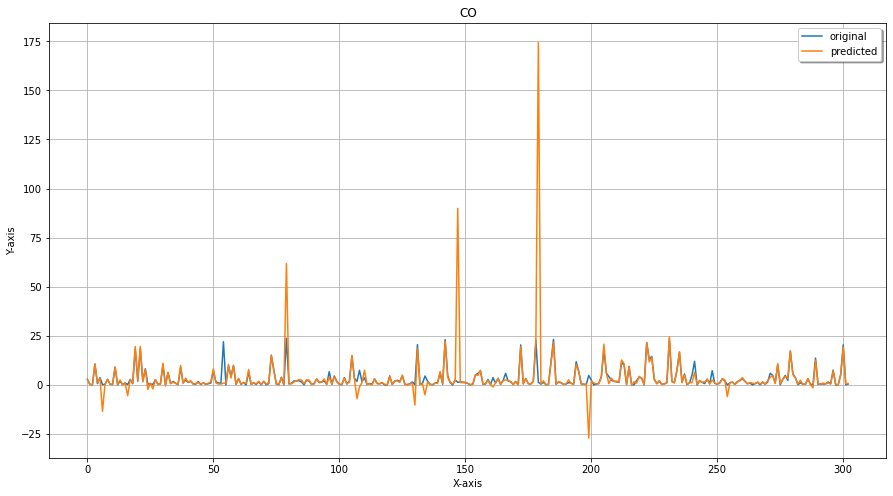

In [163]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=6)
X_poly = poly_reg.fit_transform(X_train)
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

y_pred = pol_reg.predict(poly_reg.fit_transform(X_test))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, y_pred))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))



test_score = r2_score(y_test, y_pred)
spearman = spearmanr(y_test, y_pred)
pearson = pearsonr(y_test, y_pred)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, y_pred, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Coefficients:  [ 0.03189861 -0.16546225]
Intercept:  -1.6789777324831592
R2  0.22977280959964552
MAE of simple linear regression of  1.6140066760734468
MSE of simple linear regression 4.251171306253646
RMSE of simple linear regression 2.0618368767324067
Test data Spearman correlation of simple linear regression: 0.479
Test data Pearson correlation simple linear regression: 0.49


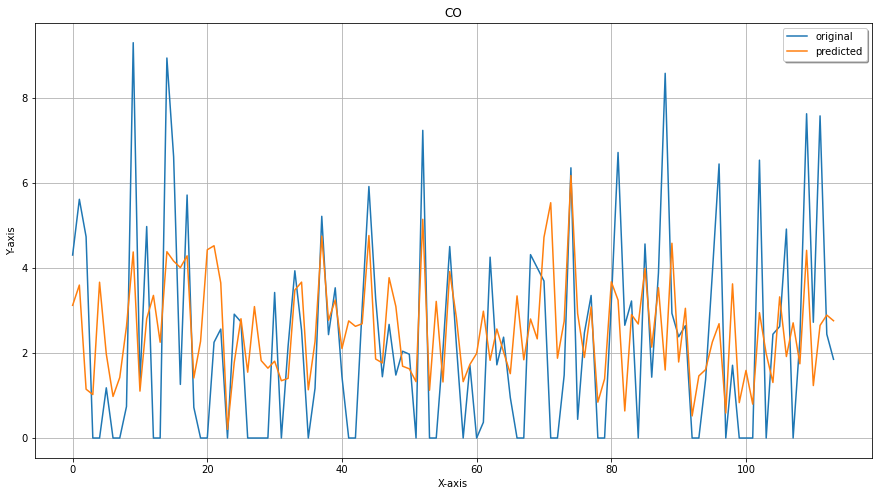

In [204]:
X = dm1[['co_shift','temp_c']]
y = dm1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, shuffle= True,random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation simple linear regression: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Coefficients:  [0.06644352 0.13393265]
Intercept:  -21.115535974864816
R2  0.5569899460591263
MAE of simple linear regression of  3.2432866991576024
MSE of simple linear regression 25.56826840127216
RMSE of simple linear regression 5.0565075300321825
Test data Spearman correlation of simple linear regression: 0.528
Test data Pearson correlation simple linear regression: 0.747


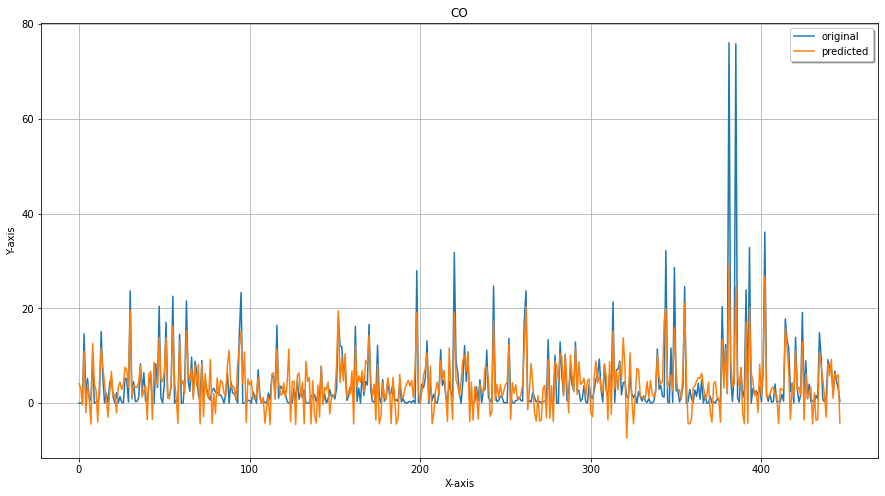

In [169]:
X = d1[['co_shift','hum_prcnt']]
y = d1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, shuffle= True,random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation simple linear regression: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Coefficients:  [0.06037927 0.00277602]
Intercept:  -17.893574281865117
R2  0.5871045905289665
MAE of simple linear regression of  3.0462918502193657
MSE of simple linear regression 23.830205561017692
RMSE of simple linear regression 4.881619153622872
Test data Spearman correlation of simple linear regression: 0.536
Test data Pearson correlation simple linear regression: 0.768


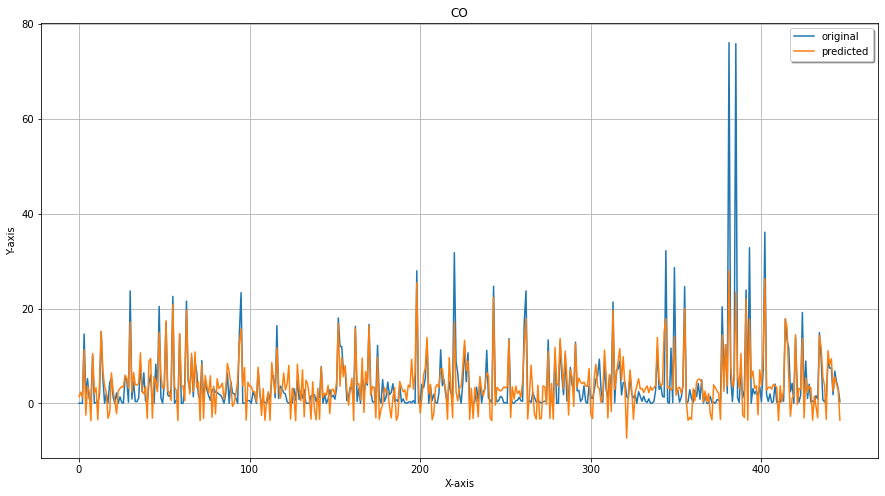

In [170]:
X = d1[['co_shift','no2_ppb']]
y = d1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, shuffle= True,random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation simple linear regression: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Coefficients:  [ 0.06563147 -0.69005891]
Intercept:  637.3640115659332
R2  0.5656056314727873
MAE of simple linear regression of  3.2085808973811223
MSE of simple linear regression 25.07101522347676
RMSE of simple linear regression 5.007096486335844
Test data Spearman correlation of simple linear regression: 0.518
Test data Pearson correlation simple linear regression: 0.753


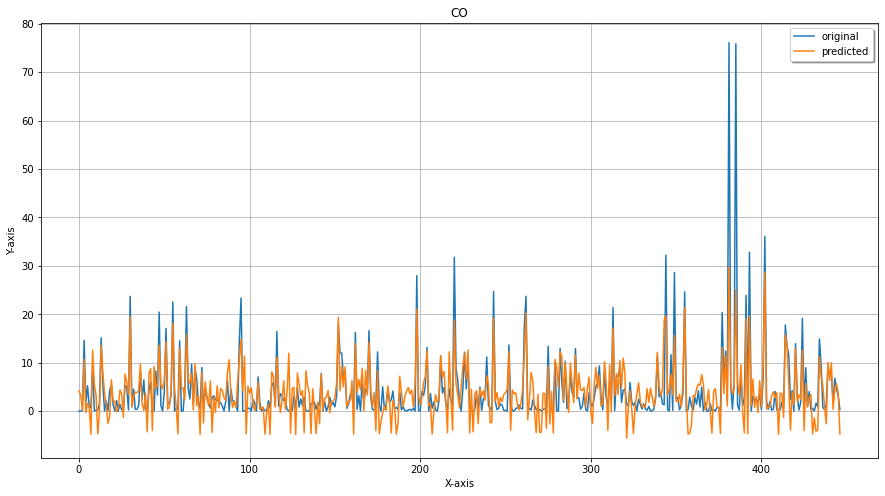

In [172]:
X = d1[['co_shift','press_hpa']]
y = d1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, shuffle= True,random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation simple linear regression: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Coefficients:  [ 0.06248229  0.00273896 -0.37727586]
Intercept:  -5.542585683292344
R2  0.6020012177248963
MAE of simple linear regression of  2.9751019603165023
MSE of simple linear regression 22.970448634439997
RMSE of simple linear regression 4.792749590208109
Test data Spearman correlation of simple linear regression: 0.534
Test data Pearson correlation simple linear regression: 0.777


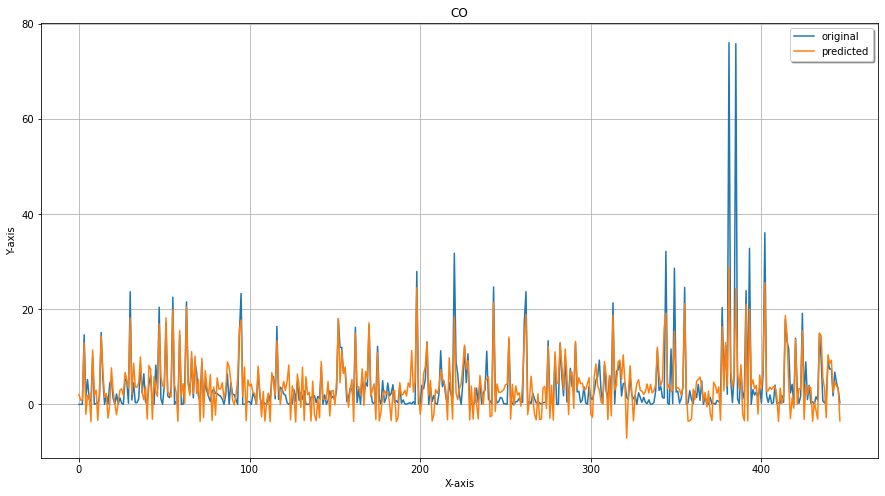

In [176]:
X = d1[['co_shift','no2_ppb','temp_c']]
y = d1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, shuffle= True,random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,3), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,3))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation simple linear regression: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Coefficients:  [ 0.06273141  0.00245291 -0.28272485 -0.33654158]
Intercept:  261.06053526847967
R2  0.6006136453747373
MAE of simple linear regression of  2.975309074632415
MSE of simple linear regression 23.050532194529552
RMSE of simple linear regression 4.8010969782466955
Test data Spearman correlation of simple linear regression: 0.526
Test data Pearson correlation simple linear regression: 0.775


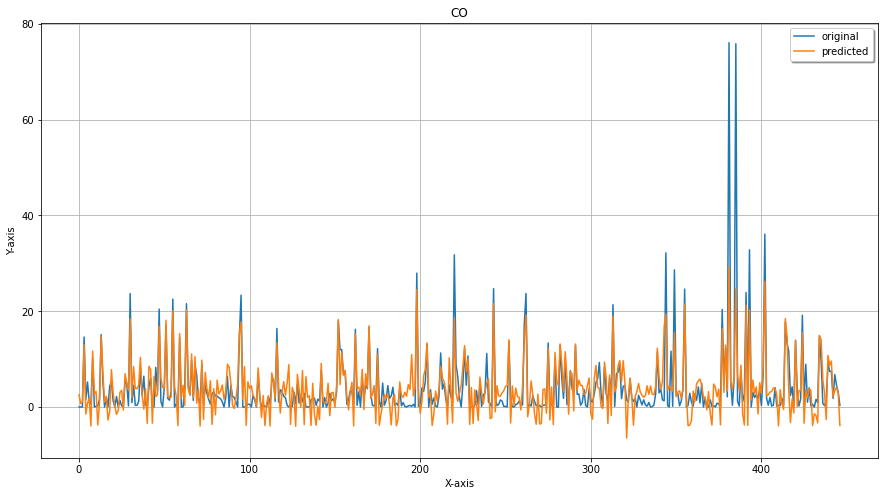

In [175]:
X = d1[['co_shift','no2_ppb','press_hpa','temp_c']]
y = d1[' CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, shuffle= True,random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,4), y_train)

print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,4))

ssr = np.sum((test_y_hat - y_test)**2)
ssr

    #  total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst

    # R2 score
r2 = 1 - (ssr/sst)
    
print("R2 ", r2)

    # MAE
    
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation simple linear regression: {pearson[0]:.3}')
    #print(f'Train data Spearman correlation of simple linear regression

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

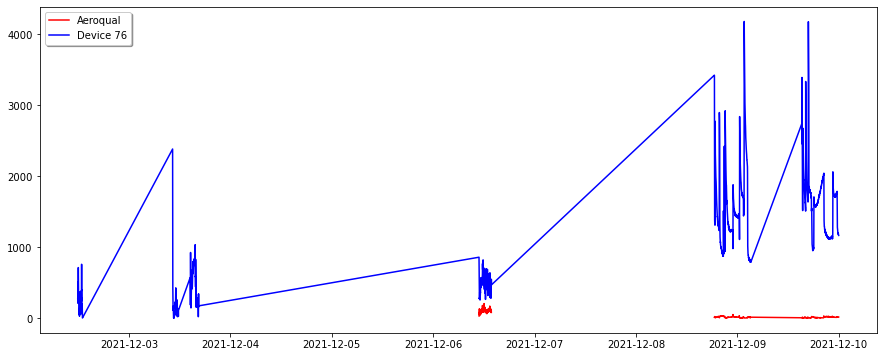

In [182]:
# NO2
# Device 76
plt.figure(figsize = (15, 6))
x = d1['Date Time']
y1 = d1[' NO2(ppm)']
y2 = d1['no2_ppb']
plt.plot(x, y1, 'r', label = 'Aeroqual')
plt.plot(x, y2, 'b', label = 'Device 76')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.show()

# January

In [69]:
a1 = pd.read_csv('Mobile data//January//aeroqual_30122to100122_CO.csv', parse_dates = ['Date Time'])
a2 = pd.read_csv('Mobile data//January//aeroqual_30122to100122_NO2.csv', parse_dates = ['Date Time'])

In [70]:
a1 = a1.drop(columns = [' Monitor ID', ' Location ID'], axis = 1)
a2 = a2.drop(columns = [' Monitor ID', ' Location ID'], axis = 1)


In [39]:
O = a1.merge(a2, on = 'Date Time', how = 'outer')

In [38]:
O.to_csv('Aeroqual_jan(3-8).csv')

In [72]:
S = pd.read_csv('Mobile data//January//Aeroqual_jan(3-8).csv', parse_dates = ['Date Time'])
S

,Unnamed: 0,Date Time,CO(ppm),NO2(ppm)
0,0,2022-01-03 11:30:00,0.0,NaN
1,1,2022-01-03 11:31:00,0.0,NaN
2,2,2022-01-03 11:32:00,0.0,NaN
3,3,2022-01-03 11:33:00,0.0,NaN
4,4,2022-01-03 11:34:00,0.0,NaN
...,...,...,...,...
2433,2433,2022-01-08 14:07:00,NaN,0.064
2434,2434,2022-01-08 14:08:00,NaN,0.063
2435,2435,2022-01-08 15:38:00,NaN,0.080
2436,2436,2022-01-08 15:39:00,NaN,0.078


In [73]:
d1 = pd.read_csv('Mobile data//January//device-76.csv')
d2 = pd.read_csv('Mobile data//January//device-61.csv')
d3 = pd.read_csv('Mobile data//January//device-c5.csv')

In [65]:
d1

,timestamp,hr_time,temp_c,hum_prcnt,press_hpa,ozone_ppm,ozone_volt_mv,co_ppm,co_mv,no2_ppb,...,co-mg,bc-proxy,ldsa-proxy,newaqi,dosage-male-walking-low,dosage-male-walking-high,dosage-female-walking-low,dosage-female-walking-high,accbin,date
0,1.620300e+12,06-05-2021 10:56,33.540001,25.024000,938.914612,0,286,429,1698,4510,...,0.293991,1.448908,0.000000,98.7,3.326717,8.316793,2.892797,7.231994,1,06-05-2021 10:56
1,1.620300e+12,06-05-2021 10:57,33.599998,24.941000,938.923584,0,370,429,1700,4364,...,0.293883,1.462163,0.000000,97.3,3.579556,8.948891,3.112658,7.781644,1,06-05-2021 10:57
2,1.620300e+12,06-05-2021 10:57,33.619999,24.746000,938.965698,2,-46,433,1707,4292,...,0.296887,1.446125,23.236138,96.6,3.536627,8.841569,3.075328,7.688321,1,06-05-2021 10:57
3,1.620300e+12,06-05-2021 10:58,33.650002,25.643000,938.979187,0,99,439,1731,4135,...,0.302550,1.402127,0.000000,95.0,3.377119,8.442797,2.936625,7.341563,1,06-05-2021 10:58
4,1.620300e+12,06-05-2021 10:58,33.570000,24.670000,939.000000,3,-59,435,1718,4067,...,0.298437,1.396044,22.512057,94.3,3.423429,8.558571,2.976894,7.442236,1,06-05-2021 10:58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20509,1.641640e+12,08-01-2022 10:09,39.580002,24.931999,944.705811,90,-1800,268,1249,307,...,0.162231,0.616216,12.455526,151.5,8.370311,20.925777,7.278531,18.196328,0,08-01-2022 10:09
20510,1.641640e+12,08-01-2022 10:09,39.570000,24.993000,944.788025,84,-1684,273,1266,332,...,0.166299,0.685182,13.298952,151.2,10.417881,26.044702,9.059027,22.647567,0,08-01-2022 10:09
20511,1.641640e+12,08-01-2022 10:10,39.540001,25.787001,944.724487,31,-610,258,1224,335,...,0.155075,0.636763,13.080544,79.5,8.147588,20.368969,7.084859,17.712147,0,08-01-2022 10:10
20512,1.641640e+12,08-01-2022 10:10,39.310001,25.489000,944.784729,28,-564,241,1172,364,...,0.141279,0.627603,13.001468,74.7,6.946174,17.365435,6.040151,15.100378,0,08-01-2022 10:10


In [74]:
from support_functions import Date_Time
Date_Time(d1, 'device76_3-8jan.csv')
Date_Time(d2, 'device61_3-8jan.csv')
Date_Time(d3, 'devicec5_3-8jan.csv')

In [66]:
p1 = pd.read_csv('device76_3-8jan.csv', parse_dates = ['Date Time'])
p2 = pd.read_csv('device61_3-8jan.csv', parse_dates = ['Date Time'])
p3 = pd.read_csv('devicec5_3-8jan.csv', parse_dates = ['Date Time'])


In [75]:
p1

,Date Time,timestamp,hr_time,temp_c,hum_prcnt,press_hpa,ozone_ppm,ozone_volt_mv,co_ppm,co_mv,...,co-mg,bc-proxy,ldsa-proxy,newaqi,dosage-male-walking-low,dosage-male-walking-high,dosage-female-walking-low,dosage-female-walking-high,accbin,date
0,2021-05-06 16:50:00,1.620300e+12,06-05-2021 10:56,33.540001,25.024000,938.914612,0,286,429,1698,...,0.293991,1.448908,0.000000,98.7,3.326717,8.316793,2.892797,7.231994,1,06-05-2021 10:56
1,2021-05-06 16:50:00,1.620300e+12,06-05-2021 10:57,33.599998,24.941000,938.923584,0,370,429,1700,...,0.293883,1.462163,0.000000,97.3,3.579556,8.948891,3.112658,7.781644,1,06-05-2021 10:57
2,2021-05-06 16:50:00,1.620300e+12,06-05-2021 10:57,33.619999,24.746000,938.965698,2,-46,433,1707,...,0.296887,1.446125,23.236138,96.6,3.536627,8.841569,3.075328,7.688321,1,06-05-2021 10:57
3,2021-05-06 16:50:00,1.620300e+12,06-05-2021 10:58,33.650002,25.643000,938.979187,0,99,439,1731,...,0.302550,1.402127,0.000000,95.0,3.377119,8.442797,2.936625,7.341563,1,06-05-2021 10:58
4,2021-05-06 16:50:00,1.620300e+12,06-05-2021 10:58,33.570000,24.670000,939.000000,3,-59,435,1718,...,0.298437,1.396044,22.512057,94.3,3.423429,8.558571,2.976894,7.442236,1,06-05-2021 10:58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20509,2022-01-08 16:36:40,1.641640e+12,08-01-2022 10:09,39.580002,24.931999,944.705810,90,-1800,268,1249,...,0.162231,0.616216,12.455526,151.5,8.370311,20.925777,7.278531,18.196328,0,08-01-2022 10:09
20510,2022-01-08 16:36:40,1.641640e+12,08-01-2022 10:09,39.570000,24.993000,944.788025,84,-1684,273,1266,...,0.166299,0.685182,13.298952,151.2,10.417881,26.044702,9.059027,22.647567,0,08-01-2022 10:09
20511,2022-01-08 16:36:40,1.641640e+12,08-01-2022 10:10,39.540001,25.787001,944.724487,31,-610,258,1224,...,0.155075,0.636763,13.080544,79.5,8.147588,20.368969,7.084859,17.712147,0,08-01-2022 10:10
20512,2022-01-08 16:36:40,1.641640e+12,08-01-2022 10:10,39.310001,25.489000,944.784729,28,-564,241,1172,...,0.141279,0.627603,13.001468,74.7,6.946174,17.365435,6.040151,15.100378,0,08-01-2022 10:10


In [61]:
m1 = O.merge(p1,on = 'Date Time', how = 'inner')
m2 = O.merge(p2,on = 'Date Time', how = 'inner')
m3 = O.merge(p3,on = 'Date Time', how = 'inner')


In [62]:
m1.to_csv('Aero_device76_3-8jan.csv', index = False)
m2.to_csv('Aero_device61_3-8jan.csv', index = False)
m3.to_csv('Aero_devicec5_3-8jan.csv', index = False)

In [66]:
len(O)

2438

In [62]:
d1 = pd.read_csv('Mobile data//January//Aero_device76_3-8jan.csv', parse_dates = ['Date Time'])
d2 = pd.read_csv('Mobile data//January//Aero_device61_3-8jan.csv', parse_dates = ['Date Time'])
d3 = pd.read_csv('Mobile data//January//Aero_devicec5_3-8jan.csv', parse_dates = ['Date Time'])

In [63]:
d1

,Date Time,CO(ppm),NO2(ppm),timestamp,hr_time,temp_c,hum_prcnt,press_hpa,ozone_ppm,ozone_volt_mv,...,co-mg,bc-proxy,ldsa-proxy,newaqi,dosage-male-walking-low,dosage-male-walking-high,dosage-female-walking-low,dosage-female-walking-high,accbin,date
0,2022-01-03 17:10:00,0.0,0.118,1.641210e+12,03-01-2022 10:16,36.240002,24.308001,949.830017,83,-1658,...,0.211992,1.429174,20.917404,151.2,20.741881,51.854701,18.036418,45.091045,1,03-01-2022 10:16
1,2022-01-03 17:10:00,0.0,0.118,1.641210e+12,03-01-2022 10:17,36.220001,24.134001,950.083374,63,-1252,...,0.170197,1.281704,19.755462,118.6,16.492475,41.231188,14.341283,35.853207,1,03-01-2022 10:17
2,2022-01-03 17:10:00,0.0,0.118,1.641210e+12,03-01-2022 10:17,36.180000,24.145000,949.899597,77,-1535,...,0.193446,1.268824,19.521930,145.8,15.758797,39.396993,13.703302,34.258255,1,03-01-2022 10:17
3,2022-01-03 17:10:00,0.0,0.118,1.641210e+12,03-01-2022 10:18,36.110001,24.228001,950.179871,82,-1633,...,0.161532,1.137919,18.276349,151.1,12.939858,32.349646,11.252051,28.130127,1,03-01-2022 10:18
4,2022-01-03 17:10:00,0.0,0.118,1.641210e+12,03-01-2022 10:18,36.040001,24.433001,949.686890,49,-983,...,0.180979,1.176018,18.923948,99.5,13.671283,34.178208,11.888072,29.720181,1,03-01-2022 10:18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1012,2022-01-08 13:50:00,NaN,0.062,1.641630e+12,08-01-2022 09:42,40.919998,24.181999,945.953491,113,-2248,...,0.219337,0.904053,15.334262,152.7,14.346099,35.865247,12.474868,31.187171,0,08-01-2022 09:42
1013,2022-01-08 13:50:00,NaN,0.062,1.641630e+12,08-01-2022 09:42,40.930000,23.858000,945.946716,113,-2264,...,0.205406,0.812826,14.382452,152.7,11.264984,28.162460,9.795638,24.489095,0,08-01-2022 09:42
1014,2022-01-08 13:50:00,NaN,0.062,1.641630e+12,08-01-2022 09:42,40.930000,23.858000,945.946716,113,-2264,...,0.205406,0.812826,14.382452,152.7,11.264984,28.162460,9.795638,24.489095,0,08-01-2022 09:42
1015,2022-01-08 13:50:00,NaN,0.062,1.641630e+12,08-01-2022 09:43,40.919998,24.056999,946.113098,117,-2339,...,0.224019,0.802361,14.232396,152.9,9.827179,24.567947,8.545373,21.363432,0,08-01-2022 09:43
